In [1]:
#Prints **all** console output, not just last item in cell 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
from collections import OrderedDict

In [3]:
import os
import csv
import json
from os import path

In [4]:
from funcy import *

In [5]:
from boilerplate import *
from string_utils import *

In [6]:
repo_dir = os.getcwd(); repo_dir

'/mnt/cube/home/AD/emeinhar/wr'

In [7]:
import numpy as np

In [8]:
from tqdm import tqdm, tqdm_gui, tqdm_notebook

In [9]:
from joblib import Parallel, delayed

J = -1
# J = 16
BACKEND = 'multiprocessing'
# BACKEND = 'loky'
V = 10
PREFER = 'processes'
# PREFER = 'threads'

def identity(x):
    return x

def par(gen_expr):
    return Parallel(n_jobs=J, backend=BACKEND, verbose=V, prefer=PREFER)(gen_expr)

In [10]:
import pandas as pd
import plotnine
from plotnine import *

In [11]:
a = 'nxt_swbd_word_analysis_relation_filtered_annotated.json'
# a = 'buckeye_word_analysis_relation_filtered_annotated.json'

In [12]:
n = 4

if 'nxt_swbd' in a:
    assert n in {2,3,4}
else:
    assert n in {2,3}

In [13]:
context_size = n - 1
context_size

3

In [14]:
!free -h

              total        used        free      shared  buff/cache   available
Mem:            62G        4.3G         16G         51M         41G         57G
Swap:          2.0G        1.2M        2.0G


In [15]:
word_analysis_relation = importDict(a)

In [16]:
!free -h

              total        used        free      shared  buff/cache   available
Mem:            62G        5.4G         15G         51M         41G         56G
Swap:          2.0G        1.2M        2.0G


In [17]:
word_analysis_relation[0]

{'utt_id': 't1_0',
 'utt_start': 0.8,
 'utt_end': 8.851,
 'utt_duration': 8.051,
 'utt_orth': 'okay uh first um i need to know uh how do you feel about uh about sending um an elderly uh',
 'utt_speech': 'okay uh first um i need to know uh how do you feel about uh about sending um an elderly uh',
 'conversation_id': '2005',
 'speaker': 'A',
 'sex': 'M',
 'dob': 1961,
 'dialect': 'NORTH',
 'speaker_id': 'spkr1169',
 'interlocutor_id': 'spkr1133',
 'topic': 'CARE OF THE ELDERLY',
 'turn_id': 't1',
 'id': 'ms1A_pw6',
 'distance_from_left_edge_of_turn': 0,
 'distance_from_right_edge_of_turn': 0,
 'num_phonwords': 21,
 'num_syllables': 27,
 'start': 2.83775,
 'end': 3.0,
 'duration': 0.16224999999999978,
 'speech_rate': 3.3536206682399703,
 'orth': 'need',
 'speech': 'need',
 'has_extreme_speech_rate': False,
 'type': 'phonword',
 'tag': 'phonword',
 'msstate': 'sw2005A-ms98-a-0001',
 'stress': 'p',
 'child_type': 'syllable',
 'missing_syllable_info': False,
 'child_fn': 'sw2005.A.syllables.

In [18]:
# words = word_analysis_relation

if 'nxt_swbd' in a:
    clutter_fields = ('msstate',
                      'child_type','child_fn', 'child_fp', 'child_ids', 'child_id_span', 'child_id_range',
                      'parent_type', 'phone_ids','phones','parent_ids')
else:
    clutter_fields = tuple()
# words = omit(word_analysis_relation, keys=clutter_fields)

words = lmap(partial(omit, keys=clutter_fields),
             word_analysis_relation)

In [19]:
words[0]

{'utt_id': 't1_0',
 'utt_start': 0.8,
 'utt_end': 8.851,
 'utt_duration': 8.051,
 'utt_orth': 'okay uh first um i need to know uh how do you feel about uh about sending um an elderly uh',
 'utt_speech': 'okay uh first um i need to know uh how do you feel about uh about sending um an elderly uh',
 'conversation_id': '2005',
 'speaker': 'A',
 'sex': 'M',
 'dob': 1961,
 'dialect': 'NORTH',
 'speaker_id': 'spkr1169',
 'interlocutor_id': 'spkr1133',
 'topic': 'CARE OF THE ELDERLY',
 'turn_id': 't1',
 'id': 'ms1A_pw6',
 'distance_from_left_edge_of_turn': 0,
 'distance_from_right_edge_of_turn': 0,
 'num_phonwords': 21,
 'num_syllables': 27,
 'start': 2.83775,
 'end': 3.0,
 'duration': 0.16224999999999978,
 'speech_rate': 3.3536206682399703,
 'orth': 'need',
 'speech': 'need',
 'has_extreme_speech_rate': False,
 'type': 'phonword',
 'tag': 'phonword',
 'stress': 'p',
 'missing_syllable_info': False,
 'POSs': ['VBP'],
 'isAdj': False,
 'isAdv': False,
 'isV': True,
 'isN': False,
 'syllables': 

In [20]:
ctxt_str_map = {'preceding':f'C = w_-{context_size}^-1',
                'following':f'C = w_+1^+{context_size}'}
ctxt_str_bwd, ctxt_str_fwd = ctxt_str_map['following'], ctxt_str_map['preceding']
ctxt_str_bwd, ctxt_str_fwd

source_str = 'W = w*'
target_str = "W' = w*"

no_noise_body_str_bwd, no_noise_body_str_fwd = f"{source_str} | {ctxt_str_bwd}", f"{source_str} | {ctxt_str_fwd}"
no_noise_body_str_bwd, no_noise_body_str_fwd

noise_body_str_bwd, noise_body_str_fwd = f"{target_str} | {source_str}, {ctxt_str_bwd}", f"{target_str} | {source_str}, {ctxt_str_fwd}"
noise_body_str_bwd, noise_body_str_fwd

('C = w_+1^+3', 'C = w_-3^-1')

('W = w* | C = w_+1^+3', 'W = w* | C = w_-3^-1')

("W' = w* | W = w*, C = w_+1^+3", "W' = w* | W = w*, C = w_-3^-1")

In [21]:
lm_field_forward_p = 'p' + '(' + no_noise_body_str_fwd + ')'
lm_field_forward_p
lm_field_backward_p = 'p' + '(' + no_noise_body_str_bwd + ')'
lm_field_backward_p
lm_field_forward_h = 'h' + '(' + no_noise_body_str_fwd + ')'
lm_field_forward_h
lm_field_backward_h = 'h' + '(' + no_noise_body_str_bwd + ')'
lm_field_backward_h
lm_field_backward_h_bar = 'h-bar' + '(' + no_noise_body_str_bwd + ')'
lm_field_backward_h_bar
lm_field_forward_h_bar = 'h-bar' + '(' + no_noise_body_str_fwd + ')'
lm_field_forward_h_bar

post_field_forward_p = 'p' + '(' + noise_body_str_fwd + ')'
post_field_forward_p
post_field_backward_p = 'p' + '(' + noise_body_str_bwd + ')'
post_field_backward_p
post_field_forward_h = 'h' + '(' + noise_body_str_fwd + ')'
post_field_forward_h
post_field_backward_h = 'h' + '(' + noise_body_str_bwd + ')'
post_field_backward_h
post_field_backward_h_bar = 'h-bar' + '(' + noise_body_str_bwd + ')'
post_field_backward_h_bar
post_field_forward_h_bar = 'h-bar' + '(' + noise_body_str_fwd + ')'
post_field_forward_h_bar

'p(W = w* | C = w_-3^-1)'

'p(W = w* | C = w_+1^+3)'

'h(W = w* | C = w_-3^-1)'

'h(W = w* | C = w_+1^+3)'

'h-bar(W = w* | C = w_+1^+3)'

'h-bar(W = w* | C = w_-3^-1)'

"p(W' = w* | W = w*, C = w_-3^-1)"

"p(W' = w* | W = w*, C = w_+1^+3)"

"h(W' = w* | W = w*, C = w_-3^-1)"

"h(W' = w* | W = w*, C = w_+1^+3)"

"h-bar(W' = w* | W = w*, C = w_+1^+3)"

"h-bar(W' = w* | W = w*, C = w_-3^-1)"

In [22]:
# # lm_field_forward_p = 'p(W = w* | C = w_-1^-1)'
# # lm_field_forward_h = 'h(W = w* | C = w_-1^-1)'
# # lm_field_backward_p = 'p(W = w* | C = w_+1^+1)'
# # lm_field_backward_h = 'h(W = w* | C = w_+1^+1)'

# # post_field_forward_p = "p(W' = w* | W = w*, C = w_-1^-1)"
# # post_field_forward_h = "h(W' = w* | W = w*, C = w_-1^-1)"
# # post_field_backward_p = "p(W' = w* | W = w*, C = w_+1^+1)"
# # post_field_backward_h = "h(W' = w* | W = w*, C = w_+1^+1)"

# lm_field_forward_p = 'p(W = w* | C = w_-2^-1)'
# lm_field_forward_h = 'h(W = w* | C = w_-2^-1)'
# lm_field_backward_p = 'p(W = w* | C = w_+1^+2)'
# lm_field_backward_h = 'h(W = w* | C = w_+1^+2)'

# post_field_forward_p = "p(W' = w* | W = w*, C = w_-2^-1)"
# post_field_forward_h = "h(W' = w* | W = w*, C = w_-2^-1)"
# post_field_backward_p = "p(W' = w* | W = w*, C = w_+1^+2)"
# post_field_backward_h = "h(W' = w* | W = w*, C = w_+1^+2)"

In [23]:
post_surprisals_forward_w_nans = lpluck(post_field_forward_h, words)
post_surprisals_backward_w_nans = lpluck(post_field_backward_h, words)
post_surprisals_forward = lfilter(lambda v: type(v) != str,
                                  post_surprisals_forward_w_nans)
post_surprisals_backward = lfilter(lambda v: type(v) != str,
                                  post_surprisals_backward_w_nans)

post_surprisals_forward_df = pd.DataFrame(lmap(lambda v: {post_field_forward_h:v},
                                               post_surprisals_forward))
post_surprisals_backward_df = pd.DataFrame(lmap(lambda v: {post_field_backward_h:v},
                                               post_surprisals_backward))

In [24]:
post_surprisals_forward_df.head()
post_surprisals_backward_df.head()
# post_surprisals_backward_df.info()

,"h(W' = w* | W = w*, C = w_-3^-1)"
0,2.901029
1,0.046792
2,0.180186
3,0.000043
4,0.879487


,"h(W' = w* | W = w*, C = w_+1^+3)"
0,1.854101
1,0.230150
2,2.075828
3,0.320880
4,1.332941


In [25]:
post_surprisals_forward_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108604 entries, 0 to 108603
Data columns (total 1 columns):
h(W' = w* | W = w*, C = w_-3^-1)    108601 non-null float64
dtypes: float64(1)
memory usage: 848.6 KB


In [26]:
foo = post_surprisals_forward_df[post_surprisals_forward_df[post_field_forward_h] > 2]
foo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15457 entries, 0 to 108600
Data columns (total 1 columns):
h(W' = w* | W = w*, C = w_-3^-1)    15457 non-null float64
dtypes: float64(1)
memory usage: 241.5 KB


In [27]:
# plot dist on posterior surprisals

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe55c6227d0>]],
      dtype=object)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe55c5fabd0>]],
      dtype=object)

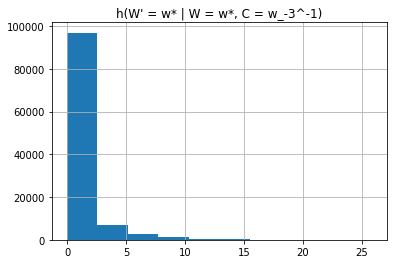

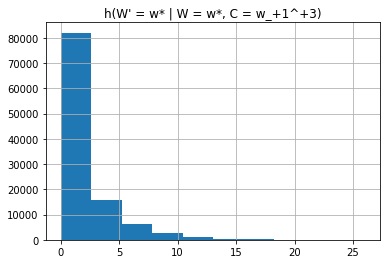

In [28]:
post_surprisals_forward_df.hist()
post_surprisals_backward_df.hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe55dbe41d0>]],
      dtype=object)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe55db79ad0>]],
      dtype=object)

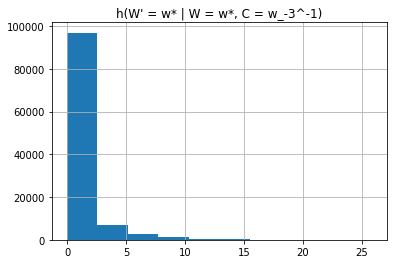

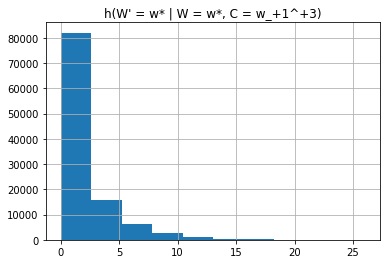

In [29]:
#bigrams
post_surprisals_forward_df.hist()
post_surprisals_backward_df.hist()

/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 598'. Pick better value with 'binwidth'.
  warn(msg.format(params['bins']), PlotnineWarning)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_bin : Removed 3 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)


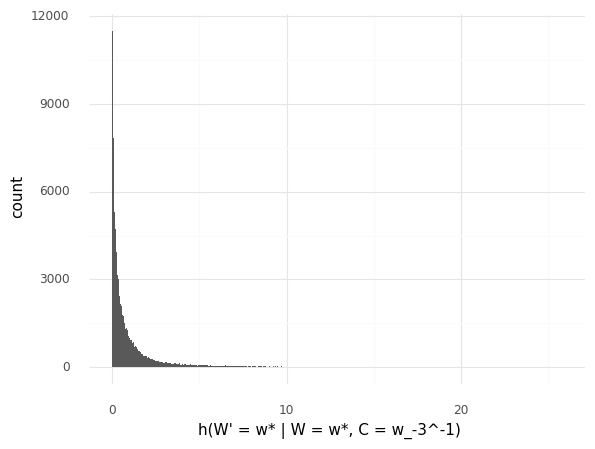

<ggplot: (8788943536309)>

In [30]:
ggplot(post_surprisals_forward_df, aes(x=post_field_forward_h)) + geom_histogram() + theme_minimal()

/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 397'. Pick better value with 'binwidth'.
  warn(msg.format(params['bins']), PlotnineWarning)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_bin : Removed 1 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)


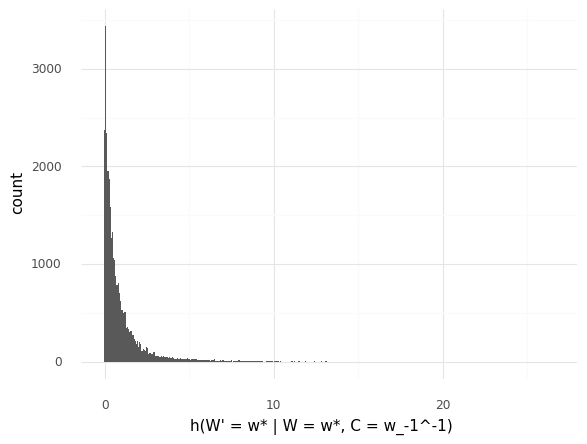

<ggplot: (8786316982977)>

In [22]:
#bigrams
ggplot(post_surprisals_forward_df, aes(x=post_field_forward_h)) + geom_histogram() + theme_minimal()

/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 304'. Pick better value with 'binwidth'.
  warn(msg.format(params['bins']), PlotnineWarning)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_bin : Removed 3 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)


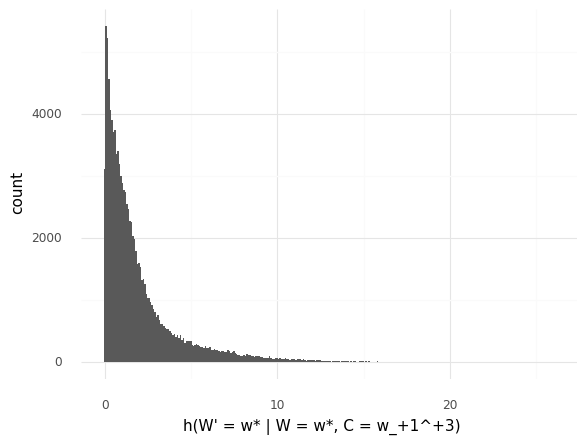

<ggplot: (8788943217113)>

In [31]:
ggplot(post_surprisals_backward_df, aes(x=post_field_backward_h)) + geom_histogram() + theme_minimal()

/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 338'. Pick better value with 'binwidth'.
  warn(msg.format(params['bins']), PlotnineWarning)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_bin : Removed 1 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)


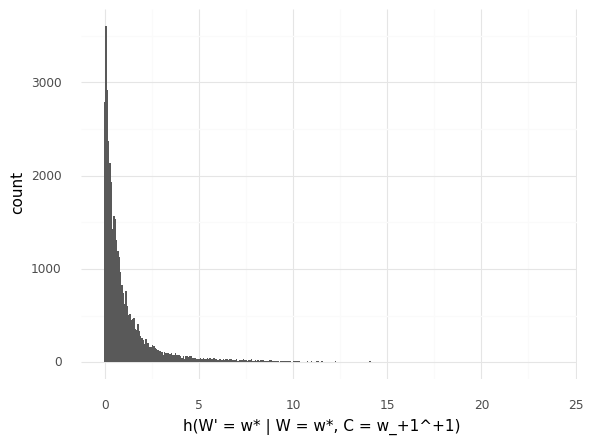

<ggplot: (8786316860997)>

In [23]:
#bigrams
ggplot(post_surprisals_backward_df, aes(x=post_field_backward_h)) + geom_histogram() + theme_minimal()

# Make Dev or Exploratory set

In [32]:
import random

In [33]:
from random import getrandbits

In [34]:
# %pdoc getrandbits

In [35]:
%pwd

'/mnt/cube/home/AD/emeinhar/wr'

In [36]:
if 'nxt_swbd' in a:
    random_seed_fp = 'nxt_swbd_exploratory_analysis_random_seed.json'
else:
    random_seed_fp = 'buckeye_exploratory_analysis_random_seed.json'

In [37]:
from os import chmod

In [38]:
if not path.exists(random_seed_fp):
    k_random_bits = 32
    random_seed = getrandbits(k_random_bits)
#     random_seed = 656975412 # for nxt_swbd
#     random_seed = 238729100 #for Buckeye
    random_seed
    random_seed_md = {'random_seed':random_seed,
                      'Production method':f"Produced by calling random.getrandbits with argument '{k_random_bits}'",
                      'Purpose':"Dividing up the word analysis relation into 50% for the purpose of exploratory data analysis."}
    random_seed_md
    exportDict(random_seed_fp, random_seed_md)
    chmod(random_seed_fp, 444)
#     !chmod 444 nxt_swbd_exploratory_analysis_random_seed.json
else:
    random_seed_md = importDict(random_seed_fp)
    random_seed_md['random_seed'] = int(random_seed_md['random_seed'])
    random_seed = random_seed_md['random_seed']
    random_seed_md
    random_seed

{'random_seed': 656975412,
 'Production method': "Produced by calling random.getrandbits with argument '32'",
 'Purpose': 'Dividing up the word analysis relation into 50% for the purpose of exploratory data analysis.'}

656975412

In [39]:
random.seed(a=random_seed)

In [40]:
from copy import deepcopy

In [41]:
shuffled_word_analysis_relation = deepcopy(word_analysis_relation)
random.shuffle(shuffled_word_analysis_relation)

In [42]:
n_obs = len(shuffled_word_analysis_relation)
n_obs

113237

In [43]:
middle_index = int(n_obs / 2)
middle_index
middle_index / n_obs

56618

0.4999955844821039

In [44]:
first_half = shuffled_word_analysis_relation[:middle_index+1]
len(first_half)
second_half = shuffled_word_analysis_relation[middle_index+1:]
len(second_half)

assert len(first_half) + len(second_half) == len(word_analysis_relation)

56619

56618

In [45]:
test_half = first_half
dev_half = second_half

In [53]:
#NXT_swbd
lpluck('segWord', dev_half)

['⋊.p.l.eɪ.⋉.⋉',
 '⋊.f.l.ɛ.k.s.ɪ.b.ə.l.⋉.⋉',
 '⋊.s.aɪ.n.⋉.⋉',
 '⋊.s.t.ʌ.f.⋉.⋉',
 '⋊.s.ɚ.v.ɪ.s.⋉.⋉',
 '⋊.p.l.i.z.d.⋉.⋉',
 '⋊.ɛ.s.p.ɛ.ʃ.ə.l.i.⋉.⋉',
 '⋊.h.ɑ.t.⋉.⋉',
 '⋊.f.ɛ.l.⋉.⋉',
 '⋊.k.ʌ.m.⋉.⋉',
 '⋊.b.ʌ.dʒ.ɪ.t.⋉.⋉',
 '⋊.k.w.ɪ.t.⋉.⋉',
 '⋊.ɑ.l.w.eɪ.z.⋉.⋉',
 '⋊.m.u.v.i.⋉.⋉',
 '⋊.b.i.ɪ.ŋ.⋉.⋉',
 '⋊.ɛ.v.ɛ.n.tʃ.u.ə.l.i.⋉.⋉',
 '⋊.d.ɪ.v.ɛ.l.ə.p.t.⋉.⋉',
 '⋊.w.ɚ.k.⋉.⋉',
 '⋊.s.ɛ.d.⋉.⋉',
 '⋊.ɛ.k.s.p.ɛ.n.s.ɪ.v.⋉.⋉',
 '⋊.m.ʌ.tʃ.⋉.⋉',
 '⋊.d.ɪ.f.ə.ɹ.ɪ.n.t.⋉.⋉',
 '⋊.ɛ.k.s.p.ɪ.ɹ.i.ɪ.n.s.⋉.⋉',
 '⋊.t.ɹ.aɪ.⋉.⋉',
 '⋊.p.ɹ.ɑ.b.l.ə.m.⋉.⋉',
 '⋊.s.ɪ.s.t.ə.m.⋉.⋉',
 '⋊.m.aɪ.l.z.⋉.⋉',
 '⋊.s.ʌ.m.w.ɑ.t.⋉.⋉',
 '⋊.b.æ.k.⋉.⋉',
 '⋊.ɪ.m.æ.dʒ.ɪ.n.⋉.⋉',
 '⋊.θ.ɪ.ŋ.z.⋉.⋉',
 '⋊.b.ɪ.z.n.ɪ.s.⋉.⋉',
 '⋊.g.ɛ.s.⋉.⋉',
 '⋊.ɪ.m.p.oʊ.ɹ.t.ɪ.n.t.⋉.⋉',
 '⋊.l.ʌ.v.⋉.⋉',
 '⋊.θ.ɪ.ŋ.⋉.⋉',
 '⋊.s.ʌ.m.t.aɪ.m.z.⋉.⋉',
 '⋊.p.æ.s.tʃ.ɚ.⋉.⋉',
 '⋊.h.ʌ.z.b.ə.n.d.⋉.⋉',
 '⋊.g.ɛ.s.⋉.⋉',
 '⋊.ɹ.i.s.ɪ.n.t.l.i.⋉.⋉',
 '⋊.k.eɪ.ɹ.f.ə.l.⋉.⋉',
 '⋊.d.ɪ.p.ɛ.n.d.ɪ.ŋ.⋉.⋉',
 '⋊.f.oʊ.ɹ.θ.⋉.⋉',
 '⋊.k.ʌ.m.⋉.⋉',
 '⋊.l.ɪ.v.d.⋉.⋉',
 '⋊.l.ɛ.v.ə.l.⋉.⋉',
 '⋊.θ.ɪ.ŋ.k.⋉.⋉',
 '⋊.w.eɪ.s

In [40]:
#buckeye
lpluck('segWord', dev_half)

['⋊.n.ɑ.n.s.t.ɹ.ʌ.k.tʃ.ɚ.d.⋉.⋉',
 '⋊.g.ɑ.n.⋉.⋉',
 '⋊.ɹ.æ.n.⋉.⋉',
 '⋊.v.aɪ.ʌ.l.ʌ.n.t.⋉.⋉',
 '⋊.ɹ.aɪ.t.ɪ.ŋ.⋉.⋉',
 '⋊.m.u.v.i.z.⋉.⋉',
 '⋊.s.p.æ.n.⋉.⋉',
 '⋊.f.æ.k.t.⋉.⋉',
 '⋊.w.eɪ.t.⋉.⋉',
 '⋊.t.ʊ.k.⋉.⋉',
 '⋊.s.ɛ.d.⋉.⋉',
 '⋊.s.ʌ.m.b.ʌ.d.i.⋉.⋉',
 '⋊.θ.ɪ.ŋ.k.⋉.⋉',
 '⋊.k.ʌ.p.l̩.⋉.⋉',
 '⋊.l.ɪ.t.l̩.⋉.⋉',
 '⋊.ɛ.ɹ.p.l.eɪ.n.⋉.⋉',
 '⋊.m.oʊ.ɹ.⋉.⋉',
 '⋊.n.aʊ.ʌ.d.eɪ.z.⋉.⋉',
 '⋊.m.i.t.⋉.⋉',
 '⋊.θ.ɪ.ŋ.k.⋉.⋉',
 '⋊.b.oʊ.ɹ.n.⋉.⋉',
 '⋊.θ.ɪ.ŋ.z.⋉.⋉',
 '⋊.p.ɹ.ɑ.b.l.ʌ.m.⋉.⋉',
 '⋊.h.oʊ.l.⋉.⋉',
 '⋊.p.l.eɪ.s.⋉.⋉',
 '⋊.s.ɪ.ŋ.k.⋉.⋉',
 '⋊.θ.ɪ.ŋ.k.⋉.⋉',
 '⋊.t.ɹ.æ.ʃ.d.⋉.⋉',
 '⋊.θ.ɪ.ŋ.⋉.⋉',
 '⋊.l.eɪ.ɪ.ŋ.⋉.⋉',
 '⋊.θ.ɪ.ŋ.z.⋉.⋉',
 '⋊.ʃ.u.t.⋉.⋉',
 '⋊.k.ɚ.s.ɪ.v.⋉.⋉',
 '⋊.s.ɛ.n.d.ɪ.ŋ.⋉.⋉',
 '⋊.θ.ɪ.ŋ.⋉.⋉',
 '⋊.g.ʊ.d.⋉.⋉',
 '⋊.ʌ.v.eɪ.l.ʌ.b.l̩.⋉.⋉',
 '⋊.w.ɛ.n.t.⋉.⋉',
 '⋊.m.ɛ.m.b.ɚ.z.⋉.⋉',
 '⋊.tʃ.i.t.⋉.⋉',
 '⋊.b.ɹ.ʌ.ð.ɚ.⋉.⋉',
 '⋊.h.aʊ.s.⋉.⋉',
 '⋊.m.ʌ.tʃ.⋉.⋉',
 '⋊.f.æ.m.ʌ.l.i.⋉.⋉',
 '⋊.m.eɪ.k.⋉.⋉',
 '⋊.b.i.t.⋉.⋉',
 '⋊.h.aɪ.p.ɚ.t.ɛ.n.ʃ.ʌ.n.⋉.⋉',
 '⋊.b.ɛ.t.ɚ.⋉.⋉',
 '⋊.ɹ.i.l.oʊ.k.eɪ.t.⋉.⋉',
 '⋊.t.ɛ.l.⋉.⋉',
 '⋊.b.aɪ.ɪ.ŋ.⋉.⋉',
 '⋊.l.ɪ.

In [46]:
%pwd

'/mnt/cube/home/AD/emeinhar/wr'

In [47]:
# !cp buckeye_test_data.json buckeye_test_data.json.BAK

In [48]:
# !cp buckeye_dev_half.json buckeye_dev_half.json.BAK

In [49]:
if 'nxt_swbd' in a:
    test_data_fp = 'nxt_swbd_test_data.json'
else:
    test_data_fp = 'buckeye_test_data.json'

if not path.exists(test_data_fp):
    exportDict(test_data_fp, test_half)
    chmod(test_data_fp, 444)
#     !chmod 444 nxt_swbd_test_data.json
else:
    test_half = importDict(test_data_fp)

if 'nxt_swbd' in a:
    dev_data_fp = 'nxt_swbd_dev_half.json'
else:
    dev_data_fp = 'buckeye_dev_half.json'
if not path.exists(dev_data_fp):
    exportDict(dev_data_fp, dev_half)
    chmod(dev_data_fp, 444)
#     !chmod 444 nxt_swbd_dev_half.json
else:
    dev_half = importDict(dev_data_fp)

In [50]:
test_data_fp
dev_data_fp

'nxt_swbd_test_data.json'

'nxt_swbd_dev_half.json'

In [51]:
lpluck('segWord', dev_half)

['⋊.p.l.eɪ.⋉.⋉',
 '⋊.f.l.ɛ.k.s.ɪ.b.ə.l.⋉.⋉',
 '⋊.s.aɪ.n.⋉.⋉',
 '⋊.s.t.ʌ.f.⋉.⋉',
 '⋊.s.ɚ.v.ɪ.s.⋉.⋉',
 '⋊.p.l.i.z.d.⋉.⋉',
 '⋊.ɛ.s.p.ɛ.ʃ.ə.l.i.⋉.⋉',
 '⋊.h.ɑ.t.⋉.⋉',
 '⋊.f.ɛ.l.⋉.⋉',
 '⋊.k.ʌ.m.⋉.⋉',
 '⋊.b.ʌ.dʒ.ɪ.t.⋉.⋉',
 '⋊.k.w.ɪ.t.⋉.⋉',
 '⋊.ɑ.l.w.eɪ.z.⋉.⋉',
 '⋊.m.u.v.i.⋉.⋉',
 '⋊.b.i.ɪ.ŋ.⋉.⋉',
 '⋊.ɛ.v.ɛ.n.tʃ.u.ə.l.i.⋉.⋉',
 '⋊.d.ɪ.v.ɛ.l.ə.p.t.⋉.⋉',
 '⋊.w.ɚ.k.⋉.⋉',
 '⋊.s.ɛ.d.⋉.⋉',
 '⋊.ɛ.k.s.p.ɛ.n.s.ɪ.v.⋉.⋉',
 '⋊.m.ʌ.tʃ.⋉.⋉',
 '⋊.d.ɪ.f.ə.ɹ.ɪ.n.t.⋉.⋉',
 '⋊.ɛ.k.s.p.ɪ.ɹ.i.ɪ.n.s.⋉.⋉',
 '⋊.t.ɹ.aɪ.⋉.⋉',
 '⋊.p.ɹ.ɑ.b.l.ə.m.⋉.⋉',
 '⋊.s.ɪ.s.t.ə.m.⋉.⋉',
 '⋊.m.aɪ.l.z.⋉.⋉',
 '⋊.s.ʌ.m.w.ɑ.t.⋉.⋉',
 '⋊.b.æ.k.⋉.⋉',
 '⋊.ɪ.m.æ.dʒ.ɪ.n.⋉.⋉',
 '⋊.θ.ɪ.ŋ.z.⋉.⋉',
 '⋊.b.ɪ.z.n.ɪ.s.⋉.⋉',
 '⋊.g.ɛ.s.⋉.⋉',
 '⋊.ɪ.m.p.oʊ.ɹ.t.ɪ.n.t.⋉.⋉',
 '⋊.l.ʌ.v.⋉.⋉',
 '⋊.θ.ɪ.ŋ.⋉.⋉',
 '⋊.s.ʌ.m.t.aɪ.m.z.⋉.⋉',
 '⋊.p.æ.s.tʃ.ɚ.⋉.⋉',
 '⋊.h.ʌ.z.b.ə.n.d.⋉.⋉',
 '⋊.g.ɛ.s.⋉.⋉',
 '⋊.ɹ.i.s.ɪ.n.t.l.i.⋉.⋉',
 '⋊.k.eɪ.ɹ.f.ə.l.⋉.⋉',
 '⋊.d.ɪ.p.ɛ.n.d.ɪ.ŋ.⋉.⋉',
 '⋊.f.oʊ.ɹ.θ.⋉.⋉',
 '⋊.k.ʌ.m.⋉.⋉',
 '⋊.l.ɪ.v.d.⋉.⋉',
 '⋊.l.ɛ.v.ə.l.⋉.⋉',
 '⋊.θ.ɪ.ŋ.k.⋉.⋉',
 '⋊.w.eɪ.s

In [52]:
!free -h

              total        used        free      shared  buff/cache   available
Mem:            62G        6.6G         13G         51M         42G         55G
Swap:          2.0G        1.2M        2.0G


# Distribution over word lengths

In [53]:
dev_half[0]

{'utt_id': 't110_1',
 'utt_start': 389.161875,
 'utt_end': 392.801875,
 'utt_duration': 3.6399999999999864,
 'utt_orth': 'wanting to play is the drums cause his my brother plays',
 'utt_speech': 'wanting to play is the drums cause his my brother plays',
 'conversation_id': '3152',
 'speaker': 'B',
 'sex': 'F',
 'dob': 1962,
 'dialect': 'MIXED',
 'speaker_id': 'spkr1320',
 'interlocutor_id': 'spkr1290',
 'topic': 'MUSIC',
 'turn_id': 't110',
 'id': 'ms89B_pw719',
 'distance_from_left_edge_of_turn': 1,
 'distance_from_right_edge_of_turn': 2,
 'num_phonwords': 11,
 'num_syllables': 13,
 'start': 389.611875,
 'end': 389.981875,
 'duration': 0.37000000000000455,
 'speech_rate': 3.571428571428585,
 'orth': 'play',
 'speech': 'play',
 'has_extreme_speech_rate': False,
 'type': 'phonword',
 'tag': 'phonword',
 'msstate': 'sw3152B-ms98-a-0089',
 'stress': 'p',
 'child_type': 'syllable',
 'missing_syllable_info': False,
 'child_fn': 'sw3152.B.syllables.xml',
 'child_fp': '/mnt/truffle/corpora/sw

In [54]:
dev_half[233]

{'utt_id': 't100_0',
 'utt_start': 296.867875,
 'utt_end': 298.067875,
 'utt_duration': 1.1999999999999886,
 'utt_orth': 'i have a good time with them',
 'utt_speech': 'i have a good time with them',
 'conversation_id': '3021',
 'speaker': 'B',
 'sex': 'M',
 'dob': 1950,
 'dialect': 'NORTHERN',
 'speaker_id': 'spkr1108',
 'interlocutor_id': 'spkr1279',
 'topic': 'GUN CONTROL',
 'turn_id': 't100',
 'id': 'ms72B_pw406',
 'distance_from_left_edge_of_turn': 0,
 'distance_from_right_edge_of_turn': 0,
 'num_phonwords': 7,
 'num_syllables': 7,
 'start': 297.207875,
 'end': 297.367875,
 'duration': 0.160000000000025,
 'speech_rate': 5.833333333333389,
 'orth': 'good',
 'speech': 'good',
 'has_extreme_speech_rate': False,
 'type': 'phonword',
 'tag': 'phonword',
 'msstate': 'sw3021B-ms98-a-0072',
 'stress': 'p',
 'child_type': 'syllable',
 'missing_syllable_info': False,
 'child_fn': 'sw3021.B.syllables.xml',
 'child_fp': '/mnt/truffle/corpora/switchboard_NXT_annotations/nxt_switchboard_ann/xml

In [423]:
all_prob_measure_fields = {
 'p(W = w*)',
 'h(W = w*)',
 'p(W = w* | C = w_+1^+1)',
 'h(W = w* | C = w_+1^+1)',
 "p(W' = w* | W = w*, C = w_+1^+1)",
 "h(W' = w* | W = w*, C = w_+1^+1)",
 'h-bar(W = w* | C = w_+1^+1)',
 "h-bar(W' = w* | W = w*, C = w_+1^+1)",
 'p(W = w* | C = w_+1^+3)',
 'h(W = w* | C = w_+1^+3)',
 "p(W' = w* | W = w*, C = w_+1^+3)",
 "h(W' = w* | W = w*, C = w_+1^+3)",
 'h-bar(W = w* | C = w_+1^+3)',
 "h-bar(W' = w* | W = w*, C = w_+1^+3)",
 'p(W = w* | C = w_-1^-1)',
 'h(W = w* | C = w_-1^-1)',
 "p(W' = w* | W = w*, C = w_-1^-1)",
 "h(W' = w* | W = w*, C = w_-1^-1)",
 'h-bar(W = w* | C = w_-1^-1)',
 "h-bar(W' = w* | W = w*, C = w_-1^-1)",
 'p(W = w* | C = w_-3^-1)',
 'h(W = w* | C = w_-3^-1)',
 "p(W' = w* | W = w*, C = w_-3^-1)",
 "h(W' = w* | W = w*, C = w_-3^-1)",
 'h-bar(W = w* | C = w_-3^-1)',
 "h-bar(W' = w* | W = w*, C = w_-3^-1)",
 'p(W = w* | C = w_-2^-1)',
 'h(W = w* | C = w_-2^-1)',
 "p(W' = w* | W = w*, C = w_-2^-1)",
 "h(W' = w* | W = w*, C = w_-2^-1)",
 'h-bar(W = w* | C = w_-2^-1)',
 "h-bar(W' = w* | W = w*, C = w_-2^-1)",
 'p(W = w* | C = w_+1^+2)',
 'h(W = w* | C = w_+1^+2)',
 "p(W' = w* | W = w*, C = w_+1^+2)",
 "h(W' = w* | W = w*, C = w_+1^+2)",
 'h-bar(W = w* | C = w_+1^+2)',
 "h-bar(W' = w* | W = w*, C = w_+1^+2)"}

In [424]:
def nanify(rel):
    r = deepcopy(rel)
    for field in all_prob_measure_fields:
#     for field in [post_field_backward_h, post_field_backward_p, 
#                   post_field_forward_h, post_field_forward_p,
#                   lm_field_backward_h, lm_field_backward_p,
#                   lm_field_forward_h, lm_field_forward_p,
#                   post_field_backward_h_bar, post_field_forward_h_bar,
#                   lm_field_backward_h_bar, lm_field_forward_h_bar]:
        if type(r[field]) == type('foo'):
            r[field] = np.nan
    return r

dev_words_nanned = lmap(nanify, dev_half)

In [422]:
list(dev_half[0].keys())

['utt_id',
 'utt_start',
 'utt_end',
 'utt_duration',
 'utt_orth',
 'utt_speech',
 'conversation_id',
 'speaker',
 'sex',
 'dob',
 'dialect',
 'speaker_id',
 'interlocutor_id',
 'topic',
 'turn_id',
 'id',
 'distance_from_left_edge_of_turn',
 'distance_from_right_edge_of_turn',
 'num_phonwords',
 'num_syllables',
 'start',
 'end',
 'duration',
 'speech_rate',
 'orth',
 'speech',
 'has_extreme_speech_rate',
 'type',
 'tag',
 'msstate',
 'stress',
 'child_type',
 'missing_syllable_info',
 'child_fn',
 'child_fp',
 'child_id_span',
 'child_id_range',
 'parent_type',
 'parent_ids',
 'POSs',
 'isAdj',
 'isAdv',
 'isV',
 'isN',
 'syllables',
 'phone_ids',
 'phones',
 'phone_durations',
 'phones_length',
 'orthography_length',
 'transcription',
 'is_non_speech',
 'is_disfluent',
 'is_filled_pause',
 'has_clitic',
 'is_unk',
 'is_content_word',
 'has_valid_transcription',
 'has_extreme_word_duration',
 'preceding_4_wordforms',
 'preceding_3_wordforms',
 'preceding_2_wordforms',
 'preceding_1_w

In [419]:
surprisal_fields = (lm_field_forward_h, lm_field_backward_h, 
                    post_field_forward_h, post_field_backward_h,
                    lm_field_forward_h_bar, lm_field_backward_h_bar,
                    post_field_forward_h_bar, post_field_backward_h_bar)
lm_fields = (lm_field_forward_h, lm_field_backward_h, lm_field_forward_h_bar, lm_field_backward_h_bar)
post_fields = (post_field_forward_h, post_field_backward_h, post_field_forward_h_bar, post_field_backward_h_bar)
fwd_fields = (lm_field_forward_h, post_field_forward_h, lm_field_forward_h_bar, post_field_forward_h_bar)
bwd_fields = (lm_field_backward_h, post_field_backward_h, lm_field_backward_h_bar, post_field_backward_h_bar)

In [425]:
if 'nxt_swbd' in a:
    loggable_fields = ('utt_duration', 'num_phonwords', 'num_syllables',
                       'duration', 'speech_rate', 'syllables', 
                       'phone_durations', 'phones_length', 'orthography_length')
else:
    loggable_fields = ('duration', 'speech_rate', 'syllables',
                       'phonemes_length', 'phones_length')

def add_logs_and_more_nans(rel):
    r = deepcopy(rel)
    for field in loggable_fields:
        if field == 'phone_durations':
            if field not in r or r[field] is None or r[field] == []:
                if 'phones_length' not in r:
                    r['phones_length'] = len(ds2t(r['transcription']))
                r[field] = [np.nan for each in range(r['phones_length'])]
                r['log_' + field] = [np.nan for each in range(r['phones_length'])]
            else:
                r['log_' + field] = lmap(float, np.log2(np.array(r[field])))
        else:
            if field not in r or r[field] is None:
                r[field] = np.nan
                r['log_' + field] = np.nan
            r['log_' + field] = float(np.log2(r[field]))
        if r['log_' + field] == np.inf or r['log_' + field] == -1.0 * np.inf:
            r['log_' + field] = np.nan
    return r

dev_words_logged = lmap(add_logs_and_more_nans, dev_words_nanned)

/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in log2
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log2


In [426]:
for r in dev_words_logged:
    for field in loggable_fields:
        if r['log_' + field] == np.inf or r['log_' + field] == -1.0 * np.inf:
            print(r)

In [58]:
dev_words_logged[0]
dev_words_logged[233]

{'utt_id': 't110_1',
 'utt_start': 389.161875,
 'utt_end': 392.801875,
 'utt_duration': 3.6399999999999864,
 'utt_orth': 'wanting to play is the drums cause his my brother plays',
 'utt_speech': 'wanting to play is the drums cause his my brother plays',
 'conversation_id': '3152',
 'speaker': 'B',
 'sex': 'F',
 'dob': 1962,
 'dialect': 'MIXED',
 'speaker_id': 'spkr1320',
 'interlocutor_id': 'spkr1290',
 'topic': 'MUSIC',
 'turn_id': 't110',
 'id': 'ms89B_pw719',
 'distance_from_left_edge_of_turn': 1,
 'distance_from_right_edge_of_turn': 2,
 'num_phonwords': 11,
 'num_syllables': 13,
 'start': 389.611875,
 'end': 389.981875,
 'duration': 0.37000000000000455,
 'speech_rate': 3.571428571428585,
 'orth': 'play',
 'speech': 'play',
 'has_extreme_speech_rate': False,
 'type': 'phonword',
 'tag': 'phonword',
 'msstate': 'sw3152B-ms98-a-0089',
 'stress': 'p',
 'child_type': 'syllable',
 'missing_syllable_info': False,
 'child_fn': 'sw3152.B.syllables.xml',
 'child_fp': '/mnt/truffle/corpora/sw

{'utt_id': 't100_0',
 'utt_start': 296.867875,
 'utt_end': 298.067875,
 'utt_duration': 1.1999999999999886,
 'utt_orth': 'i have a good time with them',
 'utt_speech': 'i have a good time with them',
 'conversation_id': '3021',
 'speaker': 'B',
 'sex': 'M',
 'dob': 1950,
 'dialect': 'NORTHERN',
 'speaker_id': 'spkr1108',
 'interlocutor_id': 'spkr1279',
 'topic': 'GUN CONTROL',
 'turn_id': 't100',
 'id': 'ms72B_pw406',
 'distance_from_left_edge_of_turn': 0,
 'distance_from_right_edge_of_turn': 0,
 'num_phonwords': 7,
 'num_syllables': 7,
 'start': 297.207875,
 'end': 297.367875,
 'duration': 0.160000000000025,
 'speech_rate': 5.833333333333389,
 'orth': 'good',
 'speech': 'good',
 'has_extreme_speech_rate': False,
 'type': 'phonword',
 'tag': 'phonword',
 'msstate': 'sw3021B-ms98-a-0072',
 'stress': 'p',
 'child_type': 'syllable',
 'missing_syllable_info': False,
 'child_fn': 'sw3021.B.syllables.xml',
 'child_fp': '/mnt/truffle/corpora/switchboard_NXT_annotations/nxt_switchboard_ann/xml

In [427]:
dev_words = deepcopy(dev_words_logged)

In [428]:
dev_words_df = pd.DataFrame(dev_words)

In [61]:
if 'nxt_swbd' in a:
    num_segs_field = 'phones_length'
else:
    num_segs_field = 'phonemes_length'
seg_word_lengths = lpluck(num_segs_field, lfilter(lambda d: num_segs_field in d,
                                                   dev_words))
seg_word_lengths[:5]

[3, 9, 3, 4, 5]

In [62]:
lengths_df = pd.DataFrame(lmap(lambda v: {'n_segs':v},
                                seg_word_lengths))
lengths_df.head()

,n_segs
0,3
1,9
2,3
3,4
4,5


In [63]:
plotnine.options.figure_size

(6.4, 4.8)

In [64]:
# plotnine.options.figure_size = (6.4, 4.8)
# my_scale_factor = 8
# plotnine.options.figure_size = (my_scale_factor * 6.4, my_scale_factor * 4.8)

def set_plot_scale_factor(n=None):
    if n is None:
        plotnine.options.figure_size = (6.4, 4.8)
        return plotnine.options.figure_size
    plotnine.options.figure_size = (n * 6.4, n * 4.8)
    return plotnine.options.figure_size

set_plot_scale_factor()

(6.4, 4.8)

/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 103'. Pick better value with 'binwidth'.
  warn(msg.format(params['bins']), PlotnineWarning)


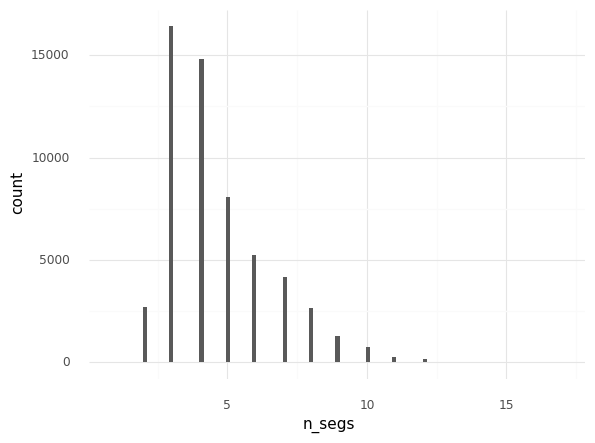

<ggplot: (8788915334909)>

In [65]:
ggplot(lengths_df, aes(x='n_segs')) + geom_histogram() + theme_minimal()

In [66]:
set_plot_scale_factor()

(6.4, 4.8)

/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 116'. Pick better value with 'binwidth'.
  warn(msg.format(params['bins']), PlotnineWarning)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_bin : Removed 107 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)


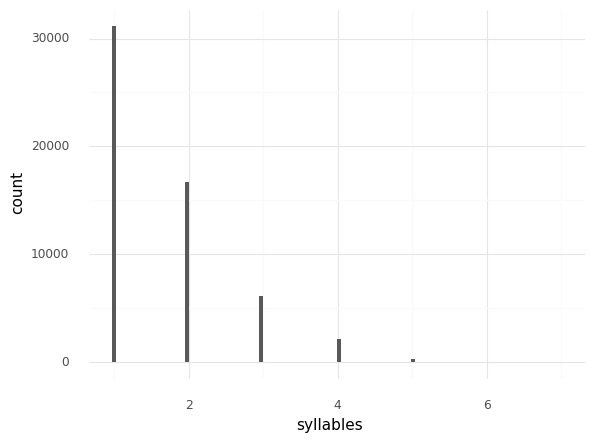

<ggplot: (8788918016453)>

In [67]:
ggplot(dev_words_df, aes(x='syllables')) + geom_histogram() + theme_minimal()

In [68]:
l = 4

In [69]:
words_w_l_segs = lambda l: lfilter(lambda d: num_segs_field in d and d[num_segs_field] == l,
                                   dev_words)
len(dev_half)
len(words_w_l_segs(l))

56618

14814

In [70]:
to_leon = lmap(partial(project, keys=['duration', 'log_duration'] + list(surprisal_fields)),
               words_w_l_segs(4))

# to_leon = lfilter(lambda d: all(not np.isnan(d[k]) for k in d),
#                   to_leon)

In [71]:
has_nans = [each for each in to_leon if any(np.isnan(each[k]) for k in each)]
len(has_nans)
# has_nans[0]

781

In [72]:
to_leon = lfilter(lambda d: all(not np.isnan(d[k]) for k in d),
                  to_leon)

In [73]:
has_nans = [each for each in to_leon if any(np.isnan(each[k]) for k in each)]
len(has_nans)

0

In [74]:
to_leon[0]

{'duration': 0.3199999999999932,
 'log_duration': -1.6438561897747554,
 'h(W = w* | C = w_-3^-1)': 5.726112287448609,
 'h(W = w* | C = w_+1^+3)': 20.66717485670624,
 "h(W' = w* | W = w*, C = w_-3^-1)": 0.2219713181257248,
 "h(W' = w* | W = w*, C = w_+1^+3)": 0.7560362219810486,
 'h-bar(W = w* | C = w_-3^-1)': 7.256580175665354,
 'h-bar(W = w* | C = w_+1^+3)': 13.809453471330297,
 "h-bar(W' = w* | W = w*, C = w_-3^-1)": 0.3171669502542376,
 "h-bar(W' = w* | W = w*, C = w_+1^+3)": 1.2596421522462065}

In [75]:
duration_arr = np.array(lpluck('duration', to_leon))
log_duration_arr = np.array(lpluck('log_duration', to_leon))
prior_backward_arr = np.array(lpluck(lm_field_backward_h, to_leon))
# prior_forward = lpluck(lm_field_forward_h, to_leon)
posterior_backward_arr = np.array(lpluck(post_field_backward_h, to_leon))
posterior_backward_avg_arr = np.array(lpluck(post_field_backward_h_bar, to_leon))

In [76]:
prior_backward_normalized = prior_backward_arr / np.linalg.norm(prior_backward_arr)

posterior_backward_normalized = posterior_backward_arr
corr = np.dot(prior_backward_normalized,posterior_backward_normalized)
posterior_residuals = posterior_backward_normalized - corr*prior_backward_normalized

posterior_backward_avg_normalized = posterior_backward_avg_arr
corr_avg = np.dot(prior_backward_normalized,posterior_backward_avg_normalized)
posterior_avg_residuals = posterior_backward_avg_normalized - corr_avg*prior_backward_normalized

In [77]:
def posterior_residuals_calc(posterior_probs, prior_probs):
#     post_normed = posterior_probs / np.linalg.norm(posterior_probs)
    post = posterior_probs
    prior_normed = prior_probs / np.linalg.norm(prior_probs)
    corr = np.dot(prior_normed, post)
    post_residuals = post - corr * prior_normed
#     corr = np.dot(prior_normed, post_normed)
#     post_residuals = post_normed - corr * prior_normed
    return post_residuals

In [78]:
assert all(posterior_residuals_calc(posterior_backward_arr, prior_backward_arr) == posterior_residuals)

In [79]:
pr_dur_df = pd.DataFrame(np.array([posterior_residuals, duration_arr, log_duration_arr]).T, columns=[post_field_backward_h + ' residual', 'duration', 'log_duration'])
pr_dur_df.head()

pr_avg_dur_df = pd.DataFrame(np.array([posterior_avg_residuals, duration_arr, log_duration_arr]).T, columns=[post_field_backward_h_bar + ' residual', 'duration', 'log_duration'])
pr_avg_dur_df.head()

,"h(W' = w* | W = w*, C = w_+1^+3) residual",duration,log_duration
0,-2.279319,0.32,-1.643856
1,-1.010323,0.27,-1.888969
2,-1.692476,0.33,-1.599462
3,-0.506204,0.17,-2.556393
4,-0.250550,0.31,-1.689660


,"h-bar(W' = w* | W = w*, C = w_+1^+3) residual",duration,log_duration
0,-1.535815,0.32,-1.643856
1,-0.201604,0.27,-1.888969
2,-1.855183,0.33,-1.599462
3,-1.565863,0.17,-2.556393
4,-0.274391,0.31,-1.689660


(51.2, 38.4)

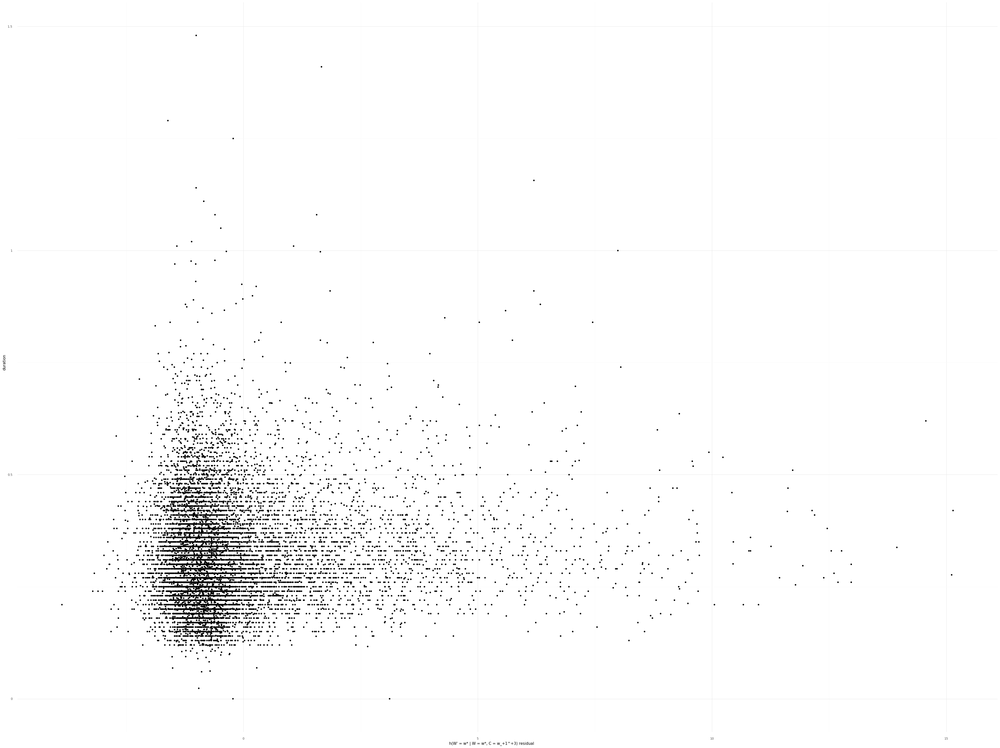

<ggplot: (8788915831337)>

(6.4, 4.8)

In [80]:
set_plot_scale_factor(8)
ggplot(pr_dur_df, aes(x=post_field_backward_h + ' residual', y='duration')) + geom_point() + theme_minimal()
# set_plot_scale_factor(16)
# ggplot(pr_dur_df, aes(x=post_field_backward_h + ' residual', y='duration')) + geom_point() + theme_minimal()
set_plot_scale_factor()

(51.2, 38.4)

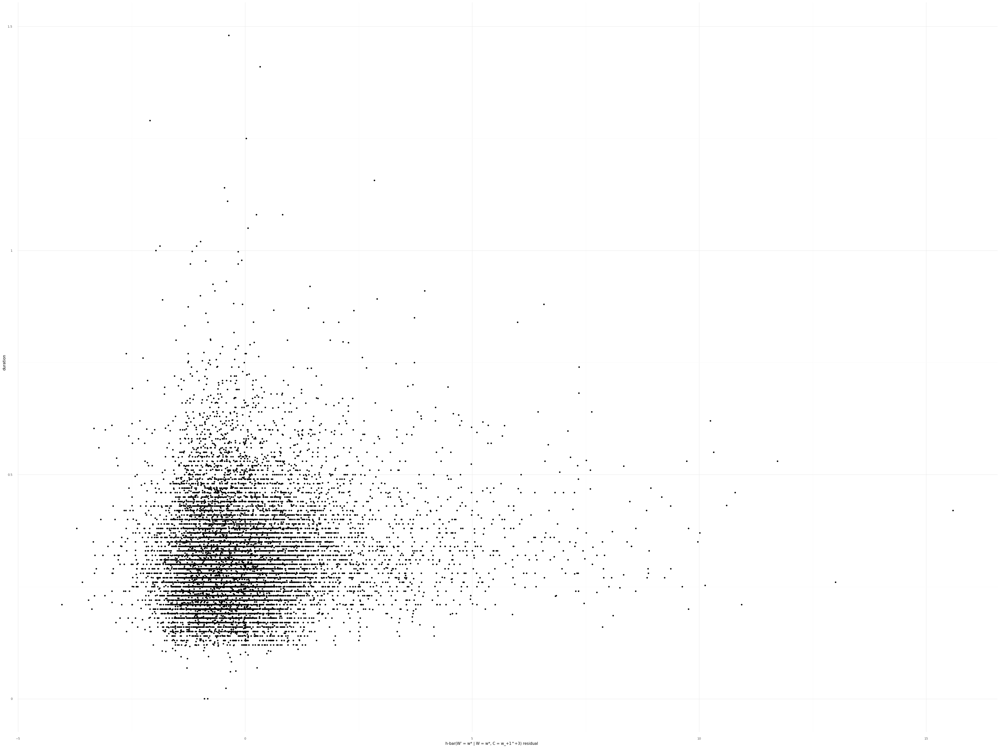

<ggplot: (8788915819217)>

(6.4, 4.8)

In [81]:
set_plot_scale_factor(8)
ggplot(pr_avg_dur_df, aes(x=post_field_backward_h_bar + ' residual', y='duration')) + geom_point() + theme_minimal()
# set_plot_scale_factor(16)
# ggplot(pr_avg_dur_df, aes(x=post_field_backward_h_bar + ' residual', y='duration')) + geom_point() + theme_minimal()
set_plot_scale_factor()

(51.2, 38.4)

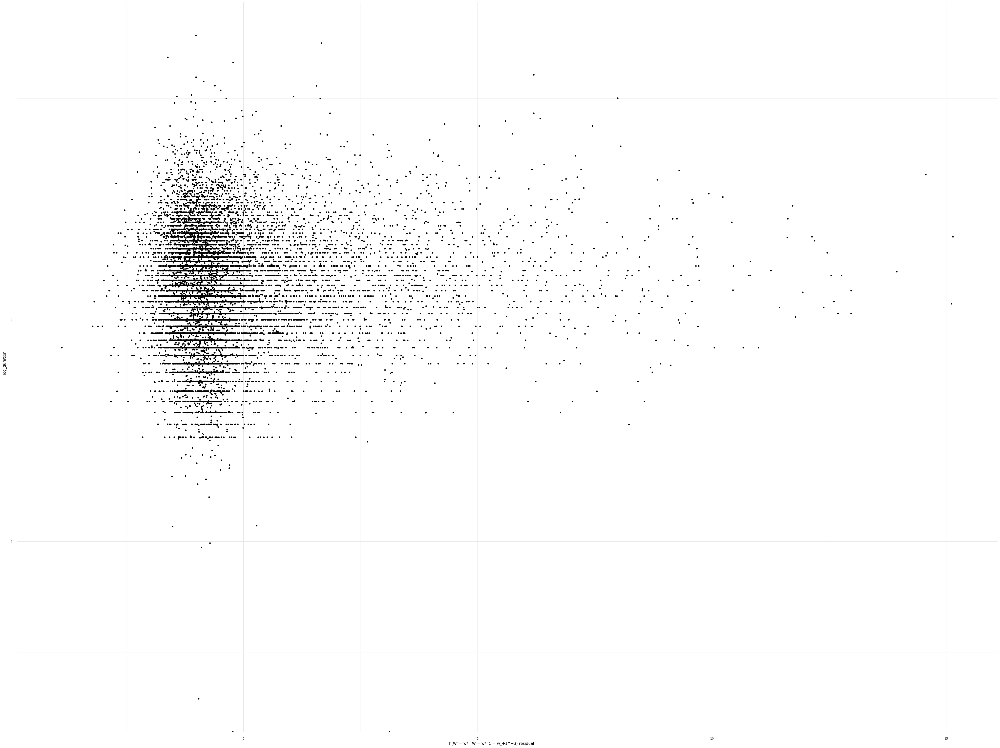

<ggplot: (8788915742109)>

(6.4, 4.8)

In [82]:
set_plot_scale_factor(8)
ggplot(pr_dur_df, aes(x=post_field_backward_h + ' residual', y='log_duration')) + geom_point() + theme_minimal()
# set_plot_scale_factor(16)
# ggplot(pr_dur_df, aes(x=post_field_backward_h + ' residual', y='log_duration')) + geom_point() + theme_minimal()
set_plot_scale_factor()

(51.2, 38.4)

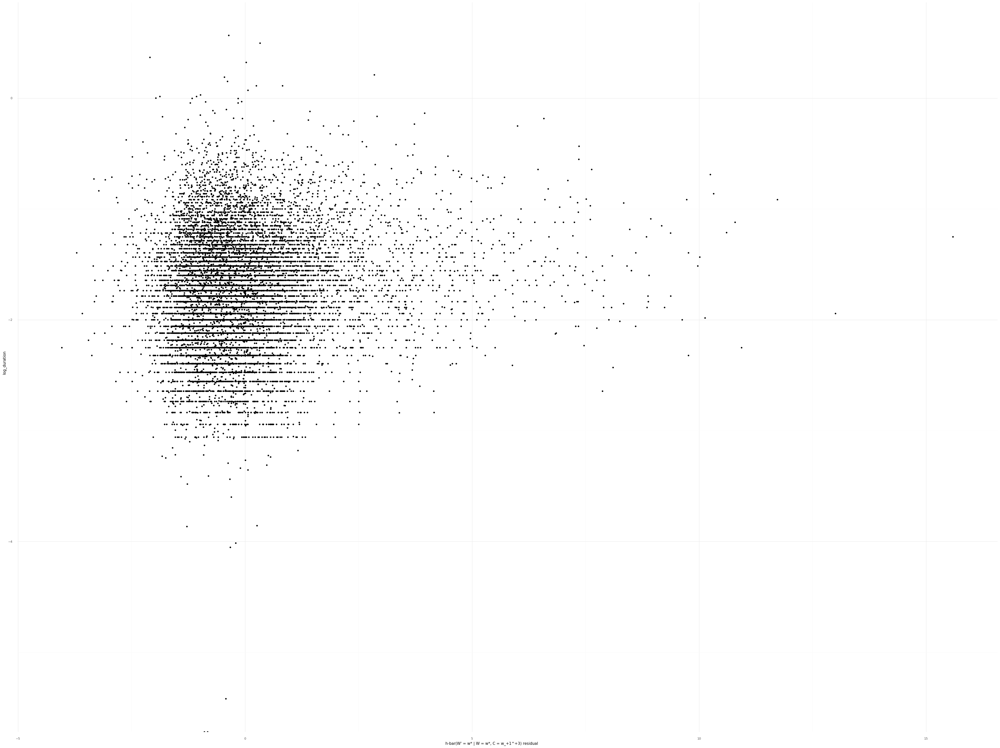

<ggplot: (8788915715481)>

(6.4, 4.8)

In [83]:
set_plot_scale_factor(8)
ggplot(pr_avg_dur_df, aes(x=post_field_backward_h_bar + ' residual', y='log_duration')) + geom_point() + theme_minimal()
# set_plot_scale_factor(16)
# ggplot(pr_avg_dur_df, aes(x=post_field_backward_h_bar + ' residual', y='log_duration')) + geom_point() + theme_minimal()
set_plot_scale_factor()

'Backwards posterior residuals ~ (log) duration'

(0.11070957349424693, 1.6130694575487656e-39)

'Backwards avg posterior residuals ~ (log) duration'

(0.11999335550198062, 3.624862994152283e-46)

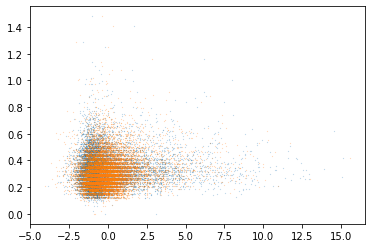

In [84]:
from matplotlib import pyplot as plt
import scipy
'Backwards posterior residuals ~ (log) duration'
plt.scatter(posterior_residuals, duration_arr, s=0.01)
scipy.stats.pearsonr(posterior_residuals, duration_arr)
# plt.scatter(posterior_residuals, log_duration_arr, s=0.01)
# scipy.stats.pearsonr(posterior_residuals, log_duration_arr)

'Backwards avg posterior residuals ~ (log) duration'
plt.scatter(posterior_avg_residuals, duration_arr, s=0.01)
scipy.stats.pearsonr(posterior_avg_residuals, duration_arr)
# plt.scatter(posterior_avg_residuals, log_duration_arr, s=0.01)
# scipy.stats.pearsonr(posterior_avg_residuals, log_duration_arr)


In [85]:
words_w_l_segs(l)[0]

{'utt_id': 't98_0',
 'utt_start': 336.29925,
 'utt_end': 340.89725,
 'utt_duration': 4.598000000000013,
 'utt_orth': 'how would it how what kind of stuff would they would you like them to do so that that',
 'utt_speech': 'how would it how what kind of stuff would they would you like them to do so that that',
 'conversation_id': '2870',
 'speaker': 'B',
 'sex': 'F',
 'dob': 1956,
 'dialect': 'MIXED',
 'speaker_id': 'spkr1231',
 'interlocutor_id': 'spkr1236',
 'topic': 'ELECTIONS AND VOTING',
 'turn_id': 't98',
 'id': 'ms90B_pw655',
 'distance_from_left_edge_of_turn': 0,
 'distance_from_right_edge_of_turn': 0,
 'num_phonwords': 19,
 'num_syllables': 19,
 'start': 337.77925,
 'end': 338.09925,
 'duration': 0.3199999999999932,
 'speech_rate': 4.132231404958666,
 'orth': 'stuff',
 'speech': 'stuff',
 'has_extreme_speech_rate': False,
 'type': 'phonword',
 'tag': 'phonword',
 'msstate': 'sw2870B-ms98-a-0090',
 'stress': 'p',
 'child_type': 'syllable',
 'missing_syllable_info': False,
 'child

(51.2, 38.4)

/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:452: PlotnineWarning: geom_jitter : Removed 107 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


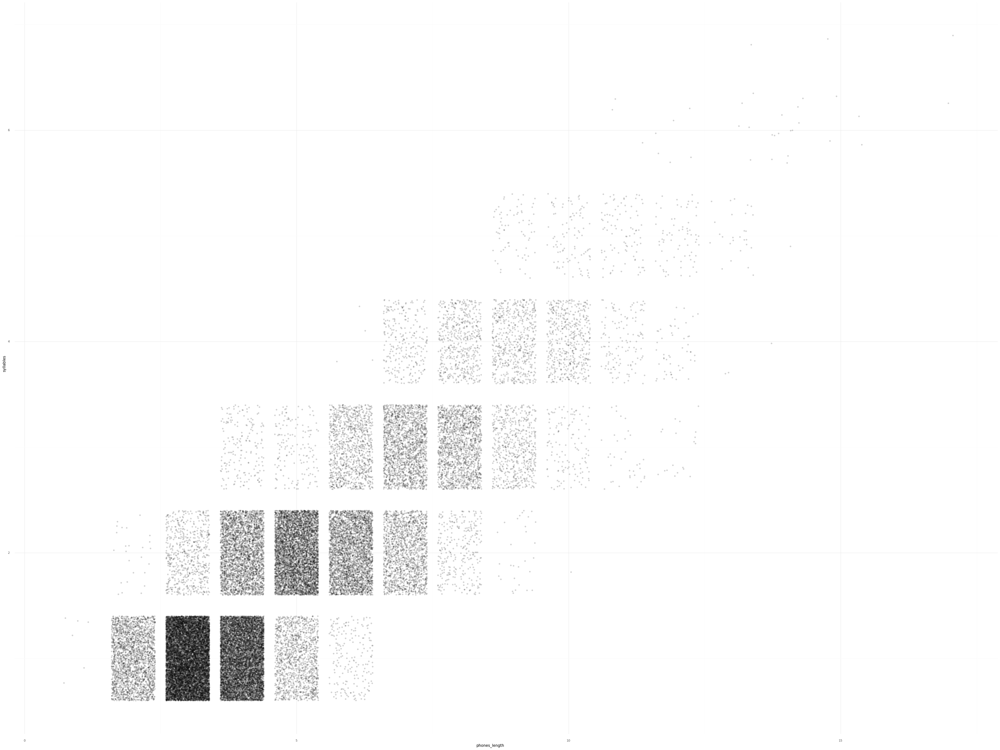

<ggplot: (8788915738341)>

(51.2, 38.4)

/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:452: PlotnineWarning: geom_jitter : Removed 107 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


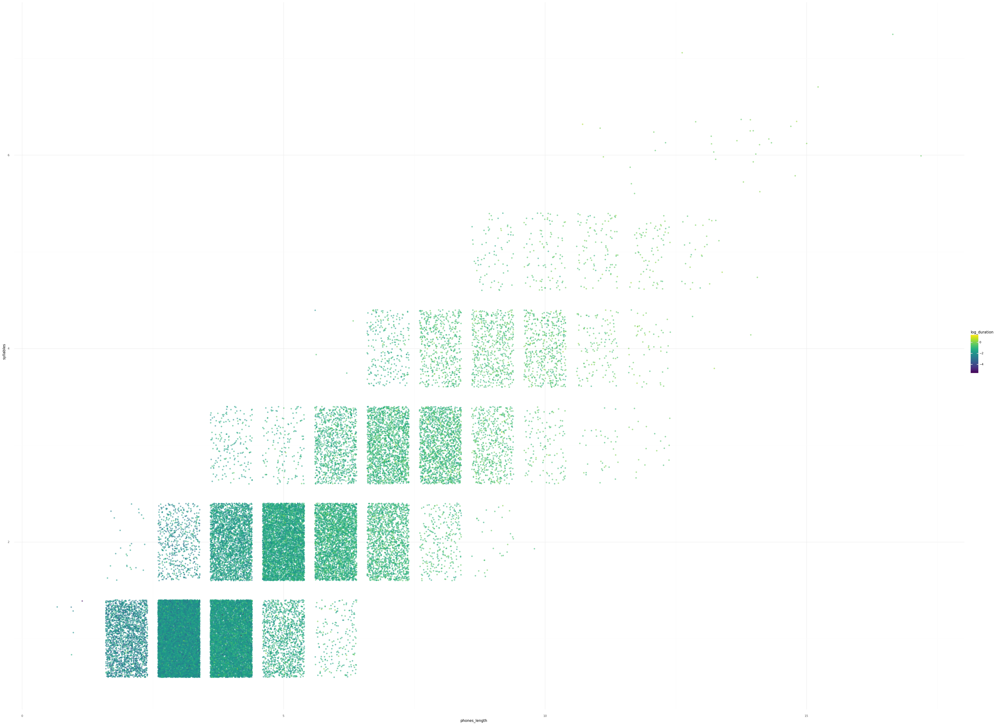

<ggplot: (8788915776357)>

(6.4, 4.8)

In [86]:
# set_plot_scale_factor(4)
# ggplot(dev_words_df, aes(x=num_segs_field, y='syllables')) + geom_jitter(alpha=0.15) + theme_minimal()
# set_plot_scale_factor(4)
# ggplot(dev_words_df, aes(x=num_segs_field, y='syllables')) + geom_jitter(alpha=0.05) + theme_minimal()
set_plot_scale_factor(8)
ggplot(dev_words_df, aes(x=num_segs_field, y='syllables')) + geom_jitter(alpha=0.15) + theme_minimal()
set_plot_scale_factor(8)
ggplot(dev_words_df, aes(x=num_segs_field, y='syllables', color='log_duration')) + geom_jitter(alpha=0.5) + theme_minimal()
set_plot_scale_factor()

In [87]:
s = 2

In [88]:
words_w_s_sylls = lambda s: lfilter(lambda d: 'syllables' in d and d['syllables'] == s,
                                    dev_words)
len(dev_half)
len(words_w_s_sylls(s))

56618

16741

Distribution on surprisals for just words with 4 segments:

In [89]:
valid_prob = lambda v: type(v) != str

In [90]:
post_surprisals_forward = lmap(partial(project, keys=(post_field_forward_h,)), words_w_l_segs(l))
post_surprisals_backward = lmap(partial(project, keys=(post_field_backward_h,)), words_w_l_segs(l))

post_surprisals_forward_df = pd.DataFrame(post_surprisals_forward)
post_surprisals_backward_df = pd.DataFrame(post_surprisals_backward)

# post_surprisals_forward = lpluck(post_field_forward_h, words_w_4_segs)
# post_surprisals_backward = lpluck(post_field_backward_h, words_w_4_segs)

# post_surprisals_forward_w_nans = lpluck(post_field_forward_h, words_w_4_segs)
# post_surprisals_backward_w_nans = lpluck(post_field_backward_h, words_w_4_segs)
# post_surprisals_forward = lfilter(lambda v: type(v) != str,
#                                   post_surprisals_forward_w_nans)
# post_surprisals_backward = lfilter(lambda v: type(v) != str,
#                                   post_surprisals_backward_w_nans)

# post_surprisals_forward_df = pd.DataFrame(lmap(lambda v: {post_field_forward_h:v},
#                                                post_surprisals_forward))
# post_surprisals_backward_df = pd.DataFrame(lmap(lambda v: {post_field_backward_h:v},
#                                                post_surprisals_backward))

In [91]:
post_surprisals_forward[0]
post_surprisals_forward_df.head()

{"h(W' = w* | W = w*, C = w_-3^-1)": 0.2219713181257248}

,"h(W' = w* | W = w*, C = w_-3^-1)"
0,0.221971
1,1.340851
2,0.076725
3,0.624517
4,0.104190


In [92]:
lm_surprisals_forward = lmap(partial(project, keys=(lm_field_forward_h,)), words_w_l_segs(l))
lm_surprisals_backward = lmap(partial(project, keys=(lm_field_backward_h,)), words_w_l_segs(l))

lm_surprisals_forward_df = pd.DataFrame(lm_surprisals_forward)
lm_surprisals_backward_df = pd.DataFrame(lm_surprisals_backward)

In [93]:
len(words_w_l_segs(l))

14814

In [94]:
dev_words_df[dev_words_df[num_segs_field] == 4].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14814 entries, 3 to 56612
Columns: 125 entries, utt_id to transcription_added?
dtypes: bool(16), float64(29), int64(8), object(72)
memory usage: 12.7+ MB


In [95]:
seg_syll_combos = [(1,3),(1,4),
                   (2,4),(2,5),(2,6)]

In [96]:
# for each_s, each_l in seg_syll_combos:
#     ggplot(dev_words_df[dev_words_df[num_segs_field] == each_l], aes(x=post_field_backward_h)) + geom_histogram() + theme_minimal() + ggtitle(f"l={each_l}")
#     ggplot(dev_words_df[dev_words_df['syllables'] == each_s], aes(x=post_field_backward_h)) + geom_histogram() + theme_minimal() + ggtitle(f"s={each_s}")
#     # ggplot(post_surprisals_backward_df, aes(x=post_field_backward_h)) + geom_histogram() + theme_minimal()

In [97]:
# for each_s, each_l in seg_syll_combos:
#     ggplot(dev_words_df[dev_words_df[num_segs_field] == each_l], aes(x=post_field_backward_h_bar)) + geom_histogram() + theme_minimal() + ggtitle(f"l={each_l}")
#     ggplot(dev_words_df[dev_words_df['syllables'] == each_s], aes(x=post_field_backward_h_bar)) + geom_histogram() + theme_minimal() + ggtitle(f"s={each_s}")
#     # ggplot(post_surprisals_backward_df, aes(x=post_field_backward_h)) + geom_histogram() + theme_minimal()

In [98]:
# for each_s, each_l in seg_syll_combos:
#     ggplot(dev_words_df[dev_words_df[num_segs_field] == each_l], aes(x=post_field_forward_h)) + geom_histogram() + theme_minimal() + ggtitle(f"l={each_l}")
#     ggplot(dev_words_df[dev_words_df['syllables'] == each_s], aes(x=post_field_forward_h)) + geom_histogram() + theme_minimal() + ggtitle(f"s={each_s}")
#     # ggplot(post_surprisals_backward_df, aes(x=post_field_backward_h)) + geom_histogram() + theme_minimal()
# # ggplot(dev_words_df[dev_words_df['phones_length'] == l], aes(x=post_field_forward_h)) + geom_histogram() + theme_minimal()
# # ggplot(dev_words_df[dev_words_df['syllables'] == s], aes(x=post_field_forward_h)) + geom_histogram() + theme_minimal()

In [99]:
# for each_s, each_l in seg_syll_combos:
#     ggplot(dev_words_df[dev_words_df[num_segs_field] == each_l], aes(x=post_field_forward_h_bar)) + geom_histogram() + theme_minimal() + ggtitle(f"l={each_l}")
#     ggplot(dev_words_df[dev_words_df['syllables'] == each_s], aes(x=post_field_forward_h_bar)) + geom_histogram() + theme_minimal() + ggtitle(f"s={each_s}")
#     # ggplot(post_surprisals_backward_df, aes(x=post_field_backward_h)) + geom_histogram() + theme_minimal()
# # ggplot(dev_words_df[dev_words_df['phones_length'] == l], aes(x=post_field_forward_h)) + geom_histogram() + theme_minimal()
# # ggplot(dev_words_df[dev_words_df['syllables'] == s], aes(x=post_field_forward_h)) + geom_histogram() + theme_minimal()

In [100]:
# for each_s, each_l in seg_syll_combos:
#     ggplot(dev_words_df[dev_words_df[num_segs_field] == each_l], aes(x=lm_field_backward_h)) + geom_histogram() + theme_minimal() + ggtitle(f"l={each_l}")
#     ggplot(dev_words_df[dev_words_df['syllables'] == each_s], aes(x=lm_field_backward_h)) + geom_histogram() + theme_minimal() + ggtitle(f"s={each_s}")
#     # ggplot(post_surprisals_backward_df, aes(x=post_field_backward_h)) + geom_histogram() + theme_minimal()
# # ggplot(dev_words_df[dev_words_df['phones_length'] == l], aes(x=lm_field_backward_h)) + geom_histogram() + theme_minimal()
# # ggplot(dev_words_df[dev_words_df['syllables'] == s], aes(x=lm_field_backward_h)) + geom_histogram() + theme_minimal()

In [101]:
# for each_s, each_l in seg_syll_combos:
#     ggplot(dev_words_df[dev_words_df[num_segs_field] == each_l], aes(x=lm_field_backward_h_bar)) + geom_histogram() + theme_minimal() + ggtitle(f"l={each_l}")
#     ggplot(dev_words_df[dev_words_df['syllables'] == each_s], aes(x=lm_field_backward_h_bar)) + geom_histogram() + theme_minimal() + ggtitle(f"s={each_s}")
#     # ggplot(post_surprisals_backward_df, aes(x=post_field_backward_h)) + geom_histogram() + theme_minimal()
# # ggplot(dev_words_df[dev_words_df['phones_length'] == l], aes(x=lm_field_backward_h)) + geom_histogram() + theme_minimal()
# # ggplot(dev_words_df[dev_words_df['syllables'] == s], aes(x=lm_field_backward_h)) + geom_histogram() + theme_minimal()

In [102]:
# for each_s, each_l in seg_syll_combos:
#     ggplot(dev_words_df[dev_words_df[num_segs_field] == each_l], aes(x=lm_field_forward_h)) + geom_histogram() + theme_minimal() + ggtitle(f"l={each_l}")
#     ggplot(dev_words_df[dev_words_df['syllables'] == each_s], aes(x=lm_field_forward_h)) + geom_histogram() + theme_minimal() + ggtitle(f"s={each_s}")
# # ggplot(dev_words_df[dev_words_df['phones_length'] == l], aes(x=lm_field_forward_h)) + geom_histogram() + theme_minimal()
# # ggplot(dev_words_df[dev_words_df['syllables'] == s], aes(x=lm_field_forward_h)) + geom_histogram() + theme_minimal()

In [103]:
# for each_s, each_l in seg_syll_combos:
#     ggplot(dev_words_df[dev_words_df[num_segs_field] == each_l], aes(x=lm_field_forward_h_bar)) + geom_histogram() + theme_minimal() + ggtitle(f"l={each_l}")
#     ggplot(dev_words_df[dev_words_df['syllables'] == each_s], aes(x=lm_field_forward_h_bar)) + geom_histogram() + theme_minimal() + ggtitle(f"s={each_s}")
# # ggplot(dev_words_df[dev_words_df['phones_length'] == l], aes(x=lm_field_forward_h)) + geom_histogram() + theme_minimal()
# # ggplot(dev_words_df[dev_words_df['syllables'] == s], aes(x=lm_field_forward_h)) + geom_histogram() + theme_minimal()

In [104]:
#scatter plot w/ x = post surprisals backward, y = duration

In [105]:
# surprisals_and_durations = lmap(partial(project, keys=(lm_field_forward_h, lm_field_backward_h, 
#                                                        post_field_forward_h, post_field_backward_h, 
#                                                        'duration', 'phones_length')),
#                                 words_w_4_segs)

In [106]:
# len(surprisals_and_durations)
# surprisals_and_durations[0]

In [107]:
# surprisals_and_durations_fwd = lfilter(lambda d: valid_prob(d[post_field_forward_h]),
#                                        surprisals_and_durations)
# len(surprisals_and_durations_fwd)
# surprisals_and_durations_bwd = lfilter(lambda d: valid_prob(d[post_field_backward_h]),
#                                        surprisals_and_durations)
# len(surprisals_and_durations_bwd)

In [108]:
# surprisals_and_durations_fwd_df = pd.DataFrame(surprisals_and_durations_fwd)
# surprisals_and_durations_fwd_df.head()

# surprisals_and_durations_bwd_df = pd.DataFrame(surprisals_and_durations_bwd)
# surprisals_and_durations_bwd_df.head()

In [109]:
# boxplots, binning at ~0.1

In [110]:
words_w_l_segs_df = pd.DataFrame(words_w_l_segs(l))

In [111]:
set_plot_scale_factor(4)

(25.6, 19.2)

In [112]:
# for each_s, each_l in seg_syll_combos:
#     # ggplot(words_w_l_segs_df, aes(x=lm_field_backward_h, y=post_field_backward_h)) + geom_point() + theme_minimal()
#     # ggplot(words_w_l_segs_df, aes(x=lm_field_forward_h, y=post_field_forward_h)) + geom_point() + theme_minimal()
#     ggplot(dev_words_df[dev_words_df[num_segs_field] == each_l], aes(x=lm_field_backward_h, y=post_field_backward_h)) + geom_point() + theme_minimal() + ggtitle(f"l={each_l}")
#     ggplot(dev_words_df[dev_words_df[num_segs_field] == each_l], aes(x=lm_field_forward_h, y=post_field_forward_h)) + geom_point() + theme_minimal() + ggtitle(f"l={each_l}")
#     ggplot(dev_words_df[dev_words_df['syllables'] == each_s], aes(x=lm_field_backward_h, y=post_field_backward_h)) + geom_point() + theme_minimal() + ggtitle(f"s={each_s}")
#     ggplot(dev_words_df[dev_words_df['syllables'] == each_s], aes(x=lm_field_forward_h, y=post_field_forward_h)) + geom_point() + theme_minimal() + ggtitle(f"s={each_s}")
#     print('=' * 80)

In [113]:
# # ggplot(words_w_s_sylls_df, aes(x=lm_field_backward_h, y=post_field_backward_h)) + geom_point() + theme_minimal()
# # ggplot(words_w_s_sylls_df, aes(x=lm_field_forward_h, y=post_field_forward_h)) + geom_point() + theme_minimal()
# ggplot(words_w_s_sylls_df, aes(x=post_field_backward_h, y=lm_field_backward_h)) + geom_point() + theme_minimal()
# ggplot(words_w_s_sylls_df, aes(x=post_field_forward_h, y=lm_field_forward_h)) + geom_point() + theme_minimal()

In [114]:
# ggplot(words_w_l_segs_df, aes(x=lm_field_forward_h, y='duration')) + geom_point() + theme_minimal()
# ggplot(words_w_l_segs_df, aes(x=post_field_forward_h, y='duration')) + geom_point() + theme_minimal()
# ggplot(words_w_l_segs_df, aes(x=lm_field_forward_h, y='log_duration')) + geom_point() + theme_minimal()
# ggplot(words_w_l_segs_df, aes(x=post_field_forward_h, y='log_duration')) + geom_point() + theme_minimal()
# ggplot(surprisals_and_durations_fwd_df, aes(x=post_field_forward_h, y='duration')) + geom_point() + theme_minimal()
# ggplot(surprisals_and_durations_fwd_df, aes(x=post_field_forward_h, y='duration')) + geom_point(alpha=0.3) + theme_minimal()
# ggplot(surprisals_and_durations_fwd_df, aes(x=post_field_forward_h, y='duration')) + geom_point(alpha=0.05) + theme_minimal()

In [115]:
# ggplot(words_w_l_segs_df, aes(x=lm_field_backward_h, y='duration')) + geom_point() + theme_minimal()
# ggplot(words_w_l_segs_df, aes(x=post_field_backward_h, y='duration')) + geom_point() + theme_minimal()
# ggplot(words_w_l_segs_df, aes(x=lm_field_backward_h, y='log_duration')) + geom_point() + theme_minimal()
# ggplot(words_w_l_segs_df, aes(x=post_field_backward_h, y='log_duration')) + geom_point() + theme_minimal()
# # ggplot(surprisals_and_durations_bwd_df, aes(x=post_field_backward_h, y='duration')) + geom_point() + theme_minimal()
# # ggplot(surprisals_and_durations_bwd_df, aes(x=post_field_backward_h, y='duration')) + geom_point(alpha=0.3) + theme_minimal()
# # ggplot(surprisals_and_durations_bwd_df, aes(x=post_field_backward_h, y='duration')) + geom_point(alpha=0.05) + theme_minimal()

In [116]:
max_fwd_surprisal_lm = max(dev_words_df[dev_words_df[num_segs_field] == l][lm_field_forward_h])
max_bwd_surprisal_lm = max(dev_words_df[dev_words_df[num_segs_field] == l][lm_field_backward_h])
max_fwd_surprisal_lm, max_bwd_surprisal_lm
max_surprisal_lm = max(max_fwd_surprisal_lm, max_bwd_surprisal_lm)
max_surprisal_lm
# max_fwd_surprisal_lm = max(words_w_l_segs_df[lm_field_forward_h])
# max_bwd_surprisal_lm = max(words_w_l_segs_df[lm_field_backward_h])
# max_fwd_surprisal_lm, max_bwd_surprisal_lm
# max_surprisal_lm = max(max_fwd_surprisal_lm, max_bwd_surprisal_lm)
# max_surprisal_lm

(40.468193036111735, 38.74028795422941)

40.468193036111735

In [117]:
words_w_s_sylls_df = pd.DataFrame(words_w_s_sylls(s))

In [118]:
max_fwd_surprisal_lm_s = max(dev_words_df[dev_words_df['syllables'] == s][lm_field_forward_h])
max_bwd_surprisal_lm_s = max(dev_words_df[dev_words_df['syllables'] == s][lm_field_backward_h])
max_fwd_surprisal_lm_s, max_bwd_surprisal_lm_s
max_surprisal_lm_s = max(max_fwd_surprisal_lm_s, max_bwd_surprisal_lm_s)
max_surprisal_lm_s
# max_fwd_surprisal_lm_s = max(words_w_s_sylls_df[lm_field_forward_h])
# max_bwd_surprisal_lm_s = max(words_w_s_sylls_df[lm_field_backward_h])
# max_fwd_surprisal_lm_s, max_bwd_surprisal_lm_s
# max_surprisal_lm_s = max(max_fwd_surprisal_lm_s, max_bwd_surprisal_lm_s)
# max_surprisal_lm_s

(39.817691572411874, 42.769553318242835)

42.769553318242835

In [119]:
max_fwd_surprisal = max(dev_words_df[dev_words_df[num_segs_field] == l][post_field_forward_h])
max_bwd_surprisal = max(dev_words_df[dev_words_df[num_segs_field] == l][post_field_backward_h])
max_fwd_surprisal, max_bwd_surprisal
max_surprisal = max(max_fwd_surprisal, max_bwd_surprisal)
max_surprisal

(18.69731903076172, 20.803054809570312)

20.803054809570312

In [120]:
max_fwd_surprisal_s = max(dev_words_df[dev_words_df['syllables'] == s][post_field_forward_h])
max_bwd_surprisal_s = max(dev_words_df[dev_words_df['syllables'] == s][post_field_backward_h])
max_fwd_surprisal_s, max_bwd_surprisal_s
max_surprisal_s = max(max_fwd_surprisal_s, max_bwd_surprisal_s)
max_surprisal_s

(23.99932861328125, 16.412479400634766)

23.99932861328125

In [121]:
"{:02.1f}".format(4.95)
"{:02.1f}".format(4.9)

'5.0'

'4.9'

In [122]:
bin_val_to_str = lambda v: "{:02.1f}".format(v)

In [123]:
# max_surprisal_generic = max([max_surprisal_lm, max_surprisal_lm_s, max_surprisal, max_surprisal_s])
max_surprisal_generic = 50.0
bin_size = 0.2
bin_num_decimal_places = 1
surprisal_range_generic = np.arange(start=0.0, 
                               stop=np.round(max_surprisal_generic + 2 * bin_size, 
                                             decimals=bin_num_decimal_places), 
                               step=bin_size)
surprisal_range_generic
surprisal_range_generic_cat = lmap(bin_val_to_str, surprisal_range_generic)
surprisal_range_generic_cat[:10]
surprisal_bins_generic = tuple(pairwise(surprisal_range_generic))
surprisal_bins_generic[:10]
surprisal_bins_generic_cat = tuple(pairwise(surprisal_range_generic_cat))
surprisal_bins_generic_cat[:10]
surprisal_bins_generic_edges = lmap(second, surprisal_bins_generic)
surprisal_bins_generic_edges[:10]
surprisal_bins_generic_edges_cat = lmap(second, surprisal_bins_generic_cat)
surprisal_bins_generic_edges_cat[:10]

array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,  1.4,  1.6,  1.8,  2. ,
        2.2,  2.4,  2.6,  2.8,  3. ,  3.2,  3.4,  3.6,  3.8,  4. ,  4.2,
        4.4,  4.6,  4.8,  5. ,  5.2,  5.4,  5.6,  5.8,  6. ,  6.2,  6.4,
        6.6,  6.8,  7. ,  7.2,  7.4,  7.6,  7.8,  8. ,  8.2,  8.4,  8.6,
        8.8,  9. ,  9.2,  9.4,  9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8,
       11. , 11.2, 11.4, 11.6, 11.8, 12. , 12.2, 12.4, 12.6, 12.8, 13. ,
       13.2, 13.4, 13.6, 13.8, 14. , 14.2, 14.4, 14.6, 14.8, 15. , 15.2,
       15.4, 15.6, 15.8, 16. , 16.2, 16.4, 16.6, 16.8, 17. , 17.2, 17.4,
       17.6, 17.8, 18. , 18.2, 18.4, 18.6, 18.8, 19. , 19.2, 19.4, 19.6,
       19.8, 20. , 20.2, 20.4, 20.6, 20.8, 21. , 21.2, 21.4, 21.6, 21.8,
       22. , 22.2, 22.4, 22.6, 22.8, 23. , 23.2, 23.4, 23.6, 23.8, 24. ,
       24.2, 24.4, 24.6, 24.8, 25. , 25.2, 25.4, 25.6, 25.8, 26. , 26.2,
       26.4, 26.6, 26.8, 27. , 27.2, 27.4, 27.6, 27.8, 28. , 28.2, 28.4,
       28.6, 28.8, 29. , 29.2, 29.4, 29.6, 29.8, 30

['0.0', '0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8']

((0.0, 0.2),
 (0.2, 0.4),
 (0.4, 0.6000000000000001),
 (0.6000000000000001, 0.8),
 (0.8, 1.0),
 (1.0, 1.2000000000000002),
 (1.2000000000000002, 1.4000000000000001),
 (1.4000000000000001, 1.6),
 (1.6, 1.8),
 (1.8, 2.0))

(('0.0', '0.2'),
 ('0.2', '0.4'),
 ('0.4', '0.6'),
 ('0.6', '0.8'),
 ('0.8', '1.0'),
 ('1.0', '1.2'),
 ('1.2', '1.4'),
 ('1.4', '1.6'),
 ('1.6', '1.8'),
 ('1.8', '2.0'))

[0.2,
 0.4,
 0.6000000000000001,
 0.8,
 1.0,
 1.2000000000000002,
 1.4000000000000001,
 1.6,
 1.8,
 2.0]

['0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8', '2.0']

In [124]:
bin_size = 0.2
bin_num_decimal_places = 1
surprisal_range_lm = np.arange(start=0.0, 
                               stop=np.round(max_surprisal_lm + 2 * bin_size, 
                                             decimals=bin_num_decimal_places), 
                               step=bin_size)
surprisal_range_lm
surprisal_range_lm_cat = lmap(bin_val_to_str, surprisal_range_lm)
surprisal_range_lm_cat[:10]
surprisal_bins_lm = tuple(pairwise(surprisal_range_lm))
surprisal_bins_lm[:10]
surprisal_bins_lm_cat = tuple(pairwise(surprisal_range_lm_cat))
surprisal_bins_lm_cat[:10]
surprisal_bins_lm_edges = lmap(second, surprisal_bins_lm)
surprisal_bins_lm_edges[:10]
surprisal_bins_lm_edges_cat = lmap(second, surprisal_bins_lm_cat)
surprisal_bins_lm_edges_cat[:10]

array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,  1.4,  1.6,  1.8,  2. ,
        2.2,  2.4,  2.6,  2.8,  3. ,  3.2,  3.4,  3.6,  3.8,  4. ,  4.2,
        4.4,  4.6,  4.8,  5. ,  5.2,  5.4,  5.6,  5.8,  6. ,  6.2,  6.4,
        6.6,  6.8,  7. ,  7.2,  7.4,  7.6,  7.8,  8. ,  8.2,  8.4,  8.6,
        8.8,  9. ,  9.2,  9.4,  9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8,
       11. , 11.2, 11.4, 11.6, 11.8, 12. , 12.2, 12.4, 12.6, 12.8, 13. ,
       13.2, 13.4, 13.6, 13.8, 14. , 14.2, 14.4, 14.6, 14.8, 15. , 15.2,
       15.4, 15.6, 15.8, 16. , 16.2, 16.4, 16.6, 16.8, 17. , 17.2, 17.4,
       17.6, 17.8, 18. , 18.2, 18.4, 18.6, 18.8, 19. , 19.2, 19.4, 19.6,
       19.8, 20. , 20.2, 20.4, 20.6, 20.8, 21. , 21.2, 21.4, 21.6, 21.8,
       22. , 22.2, 22.4, 22.6, 22.8, 23. , 23.2, 23.4, 23.6, 23.8, 24. ,
       24.2, 24.4, 24.6, 24.8, 25. , 25.2, 25.4, 25.6, 25.8, 26. , 26.2,
       26.4, 26.6, 26.8, 27. , 27.2, 27.4, 27.6, 27.8, 28. , 28.2, 28.4,
       28.6, 28.8, 29. , 29.2, 29.4, 29.6, 29.8, 30

['0.0', '0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8']

((0.0, 0.2),
 (0.2, 0.4),
 (0.4, 0.6000000000000001),
 (0.6000000000000001, 0.8),
 (0.8, 1.0),
 (1.0, 1.2000000000000002),
 (1.2000000000000002, 1.4000000000000001),
 (1.4000000000000001, 1.6),
 (1.6, 1.8),
 (1.8, 2.0))

(('0.0', '0.2'),
 ('0.2', '0.4'),
 ('0.4', '0.6'),
 ('0.6', '0.8'),
 ('0.8', '1.0'),
 ('1.0', '1.2'),
 ('1.2', '1.4'),
 ('1.4', '1.6'),
 ('1.6', '1.8'),
 ('1.8', '2.0'))

[0.2,
 0.4,
 0.6000000000000001,
 0.8,
 1.0,
 1.2000000000000002,
 1.4000000000000001,
 1.6,
 1.8,
 2.0]

['0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8', '2.0']

In [125]:
bin_size = 0.2
bin_num_decimal_places = 1
surprisal_range_lm_s = np.arange(start=0.0, 
                               stop=np.round(max_surprisal_lm_s + 2 * bin_size, 
                                             decimals=bin_num_decimal_places), 
                               step=bin_size)
surprisal_range_lm
surprisal_range_lm_s_cat = lmap(bin_val_to_str, surprisal_range_lm_s)
surprisal_range_lm_s_cat[:10]
surprisal_bins_lm_s = tuple(pairwise(surprisal_range_lm_s))
surprisal_bins_lm[:10]
surprisal_bins_lm_s_cat = tuple(pairwise(surprisal_range_lm_s_cat))
surprisal_bins_lm_s_cat[:10]
surprisal_bins_lm_s_edges = lmap(second, surprisal_bins_lm_s)
surprisal_bins_lm_s_edges[:10]
surprisal_bins_lm_s_edges_cat = lmap(second, surprisal_bins_lm_s_cat)
surprisal_bins_lm_s_edges_cat[:10]

array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,  1.4,  1.6,  1.8,  2. ,
        2.2,  2.4,  2.6,  2.8,  3. ,  3.2,  3.4,  3.6,  3.8,  4. ,  4.2,
        4.4,  4.6,  4.8,  5. ,  5.2,  5.4,  5.6,  5.8,  6. ,  6.2,  6.4,
        6.6,  6.8,  7. ,  7.2,  7.4,  7.6,  7.8,  8. ,  8.2,  8.4,  8.6,
        8.8,  9. ,  9.2,  9.4,  9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8,
       11. , 11.2, 11.4, 11.6, 11.8, 12. , 12.2, 12.4, 12.6, 12.8, 13. ,
       13.2, 13.4, 13.6, 13.8, 14. , 14.2, 14.4, 14.6, 14.8, 15. , 15.2,
       15.4, 15.6, 15.8, 16. , 16.2, 16.4, 16.6, 16.8, 17. , 17.2, 17.4,
       17.6, 17.8, 18. , 18.2, 18.4, 18.6, 18.8, 19. , 19.2, 19.4, 19.6,
       19.8, 20. , 20.2, 20.4, 20.6, 20.8, 21. , 21.2, 21.4, 21.6, 21.8,
       22. , 22.2, 22.4, 22.6, 22.8, 23. , 23.2, 23.4, 23.6, 23.8, 24. ,
       24.2, 24.4, 24.6, 24.8, 25. , 25.2, 25.4, 25.6, 25.8, 26. , 26.2,
       26.4, 26.6, 26.8, 27. , 27.2, 27.4, 27.6, 27.8, 28. , 28.2, 28.4,
       28.6, 28.8, 29. , 29.2, 29.4, 29.6, 29.8, 30

['0.0', '0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8']

((0.0, 0.2),
 (0.2, 0.4),
 (0.4, 0.6000000000000001),
 (0.6000000000000001, 0.8),
 (0.8, 1.0),
 (1.0, 1.2000000000000002),
 (1.2000000000000002, 1.4000000000000001),
 (1.4000000000000001, 1.6),
 (1.6, 1.8),
 (1.8, 2.0))

(('0.0', '0.2'),
 ('0.2', '0.4'),
 ('0.4', '0.6'),
 ('0.6', '0.8'),
 ('0.8', '1.0'),
 ('1.0', '1.2'),
 ('1.2', '1.4'),
 ('1.4', '1.6'),
 ('1.6', '1.8'),
 ('1.8', '2.0'))

[0.2,
 0.4,
 0.6000000000000001,
 0.8,
 1.0,
 1.2000000000000002,
 1.4000000000000001,
 1.6,
 1.8,
 2.0]

['0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8', '2.0']

In [126]:
bin_size = 0.2
bin_num_decimal_places = 1
surprisal_range = np.arange(start=0.0, 
                            stop=np.round(max_surprisal + 2 * bin_size, 
                                          decimals=bin_num_decimal_places), 
                            step=bin_size)
surprisal_range
surprisal_range_cat = lmap(bin_val_to_str, surprisal_range)
surprisal_range_cat[:10]
surprisal_bins = tuple(pairwise(surprisal_range))
surprisal_bins[:10]
surprisal_bins_cat = tuple(pairwise(surprisal_range_cat))
surprisal_bins_cat[:10]
surprisal_bins_edges = lmap(second, surprisal_bins)
surprisal_bins_edges[:10]
surprisal_bins_edges_cat = lmap(second, surprisal_bins_cat)
surprisal_bins_edges_cat[:10]

array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,  1.4,  1.6,  1.8,  2. ,
        2.2,  2.4,  2.6,  2.8,  3. ,  3.2,  3.4,  3.6,  3.8,  4. ,  4.2,
        4.4,  4.6,  4.8,  5. ,  5.2,  5.4,  5.6,  5.8,  6. ,  6.2,  6.4,
        6.6,  6.8,  7. ,  7.2,  7.4,  7.6,  7.8,  8. ,  8.2,  8.4,  8.6,
        8.8,  9. ,  9.2,  9.4,  9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8,
       11. , 11.2, 11.4, 11.6, 11.8, 12. , 12.2, 12.4, 12.6, 12.8, 13. ,
       13.2, 13.4, 13.6, 13.8, 14. , 14.2, 14.4, 14.6, 14.8, 15. , 15.2,
       15.4, 15.6, 15.8, 16. , 16.2, 16.4, 16.6, 16.8, 17. , 17.2, 17.4,
       17.6, 17.8, 18. , 18.2, 18.4, 18.6, 18.8, 19. , 19.2, 19.4, 19.6,
       19.8, 20. , 20.2, 20.4, 20.6, 20.8, 21. ])

['0.0', '0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8']

((0.0, 0.2),
 (0.2, 0.4),
 (0.4, 0.6000000000000001),
 (0.6000000000000001, 0.8),
 (0.8, 1.0),
 (1.0, 1.2000000000000002),
 (1.2000000000000002, 1.4000000000000001),
 (1.4000000000000001, 1.6),
 (1.6, 1.8),
 (1.8, 2.0))

(('0.0', '0.2'),
 ('0.2', '0.4'),
 ('0.4', '0.6'),
 ('0.6', '0.8'),
 ('0.8', '1.0'),
 ('1.0', '1.2'),
 ('1.2', '1.4'),
 ('1.4', '1.6'),
 ('1.6', '1.8'),
 ('1.8', '2.0'))

[0.2,
 0.4,
 0.6000000000000001,
 0.8,
 1.0,
 1.2000000000000002,
 1.4000000000000001,
 1.6,
 1.8,
 2.0]

['0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8', '2.0']

In [127]:
bin_size = 0.2
bin_num_decimal_places = 1
surprisal_range_s = np.arange(start=0.0, 
                               stop=np.round(max_surprisal_s + 2 * bin_size, 
                                             decimals=bin_num_decimal_places), 
                               step=bin_size)
surprisal_range
surprisal_range_s_cat = lmap(bin_val_to_str, surprisal_range_s)
surprisal_range_s_cat[:10]
surprisal_bins_s = tuple(pairwise(surprisal_range_s))
surprisal_bins[:10]
surprisal_bins_s_cat = tuple(pairwise(surprisal_range_s_cat))
surprisal_bins_s_cat[:10]
surprisal_bins_s_edges = lmap(second, surprisal_bins_s)
surprisal_bins_s_edges[:10]
surprisal_bins_s_edges_cat = lmap(second, surprisal_bins_s_cat)
surprisal_bins_s_edges_cat[:10]

array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,  1.4,  1.6,  1.8,  2. ,
        2.2,  2.4,  2.6,  2.8,  3. ,  3.2,  3.4,  3.6,  3.8,  4. ,  4.2,
        4.4,  4.6,  4.8,  5. ,  5.2,  5.4,  5.6,  5.8,  6. ,  6.2,  6.4,
        6.6,  6.8,  7. ,  7.2,  7.4,  7.6,  7.8,  8. ,  8.2,  8.4,  8.6,
        8.8,  9. ,  9.2,  9.4,  9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8,
       11. , 11.2, 11.4, 11.6, 11.8, 12. , 12.2, 12.4, 12.6, 12.8, 13. ,
       13.2, 13.4, 13.6, 13.8, 14. , 14.2, 14.4, 14.6, 14.8, 15. , 15.2,
       15.4, 15.6, 15.8, 16. , 16.2, 16.4, 16.6, 16.8, 17. , 17.2, 17.4,
       17.6, 17.8, 18. , 18.2, 18.4, 18.6, 18.8, 19. , 19.2, 19.4, 19.6,
       19.8, 20. , 20.2, 20.4, 20.6, 20.8, 21. ])

['0.0', '0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8']

((0.0, 0.2),
 (0.2, 0.4),
 (0.4, 0.6000000000000001),
 (0.6000000000000001, 0.8),
 (0.8, 1.0),
 (1.0, 1.2000000000000002),
 (1.2000000000000002, 1.4000000000000001),
 (1.4000000000000001, 1.6),
 (1.6, 1.8),
 (1.8, 2.0))

(('0.0', '0.2'),
 ('0.2', '0.4'),
 ('0.4', '0.6'),
 ('0.6', '0.8'),
 ('0.8', '1.0'),
 ('1.0', '1.2'),
 ('1.2', '1.4'),
 ('1.4', '1.6'),
 ('1.6', '1.8'),
 ('1.8', '2.0'))

[0.2,
 0.4,
 0.6000000000000001,
 0.8,
 1.0,
 1.2000000000000002,
 1.4000000000000001,
 1.6,
 1.8,
 2.0]

['0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8', '2.0']

In [128]:
v_in_bin = lambda bin_range: lambda v: v >= bin_range[0] and v <= bin_range[1]
surprisal_bins[0]
v_in_bin(surprisal_bins[0])(0.05)
v_in_bin(surprisal_bins[0])(0.15)

(0.0, 0.2)

True

True

In [129]:
# surprisals_to_durations_fwd = {bin_range:lfilter(lambda d: v_in_bin(bin_range)(d[post_field_forward_h]),
#                                                  surprisals_and_durations_fwd)
#                                for bin_range in surprisal_bins}
# surprisals_to_durations_fwd[surprisal_bins[0]]

In [130]:
# surprisals_and_durations_fwd[0]

In [131]:
# v_to_bin = lambda bin_ranges: lambda v: lfilter(lambda br: v_in_bin(br)(v),
#                                                 bin_ranges)[0]

def v_to_bin(bin_ranges):
    def get_bin(v):
        matches = lfilter(lambda br: v_in_bin(br)(v),
                          bin_ranges)
        if len(matches) != 1:
            print(bin_ranges)
            print(v)
            print(matches)
            raise Exception('damnit')
        return matches[0]
    return get_bin

v_to_bin(surprisal_bins_lm)(0.33)
v_to_bin(surprisal_bins_generic)(0.33)

(0.2, 0.4)

(0.2, 0.4)

In [132]:
binnable_field = lambda field_name: field_name in surprisal_fields

# binnify = lambda k,v: v if not binnable_field(k) else v_to_bin(surprisal_bins if "W'" in k else surprisal_bins_lm)(v)

def binnify(k,v,generic_bins=True):
    if not binnable_field(k):
        return v
    if generic_bins:
        return v_to_bin(surprisal_bins_generic)(v)
    if "W'" in k:
        return v_to_bin(surprisal_bins)(v)
    else:
        return v_to_bin(surprisal_bins_lm)(v)

def binnify_s(k,v,generic_bins=True):
    if not binnable_field(k):
        return v
    if generic_bins:
        return v_to_bin(surprisal_bins_generic)(v)
    if "W'" in k:
        return v_to_bin(surprisal_bins_s)(v)
    else:
        return v_to_bin(surprisal_bins_lm_s)(v)

binnify(post_field_forward_h, 0.33)

(0.2, 0.4)

In [133]:
def binnify_obs(d, s=False):
    d_prime = dict()
    for k in d:
        v = d[k]
        d_prime[k] = v
        if k in surprisal_fields:
            new_k = k + '_binned'
            if np.isnan(v):
                d_prime[new_k] = v
            else:
                if not s:
                    d_prime[new_k] = str(np.round(binnify(k,v)[1], 1))
                else:
                    d_prime[new_k] = str(np.round(binnify_s(k,v)[1], 1))
    return d_prime

In [134]:
# binnify_obs(surprisals_and_durations_fwd[0])

In [135]:
# words_w_4_segs[0]

In [136]:
#32.6s
dev_words_binned = lmap(binnify_obs, deepcopy(dev_words))
dev_words = dev_words_binned

In [137]:
dev_words_df = pd.DataFrame(dev_words)

In [138]:
# words_w_l_segs_binned_surprisals = []
# for d in words_w_l_segs:
#     try:
#         binned = binnify_obs(d)
#     except TypeError as plottingIsTheFuckingWorst:
#         print(json.dumps(d, ensure_ascii=False, indent=1))
#         print(plottingIsTheFuckingWorst)
#         print('\n')
#         raise
#     words_w_l_segs_binned_surprisals.append(binned)

In [139]:
# words_w_s_sylls_binned_surprisals = []
# for d in words_w_s_sylls:
#     try:
#         binned = binnify_obs(d, True)
#     except TypeError as plottingIsTheFuckingWorst:
#         print(json.dumps(d, ensure_ascii=False, indent=1))
#         print(plottingIsTheFuckingWorst)
#         print('\n')
#         raise
#     words_w_s_sylls_binned_surprisals.append(binned)

In [140]:
# words_w_l_segs_binned_surprisals_cat = []
# for d in words_w_l_segs_binned_surprisals:
#     d_prime = deepcopy(d)
#     for field in surprisal_fields:
#         d_prime[field + '_binned'] = str(d[field + '_binned'])
#     words_w_l_segs_binned_surprisals_cat.append(d_prime)

In [141]:
# words_w_s_sylls_binned_surprisals_cat = []
# for d in words_w_s_sylls_binned_surprisals:
#     d_prime = deepcopy(d)
#     for field in surprisal_fields:
#         d_prime[field + '_binned'] = str(d[field + '_binned'])
#     words_w_s_sylls_binned_surprisals_cat.append(d_prime)

In [142]:
# words_w_l_segs_binned_surprisals_df = pd.DataFrame(words_w_l_segs_binned_surprisals_cat)

In [143]:
# words_w_s_sylls_binned_surprisals_df = pd.DataFrame(words_w_s_sylls_binned_surprisals_cat)

In [144]:
# surprisals_to_durations_fwd_dl = [binnify_obs(d)
#                                   for d in surprisals_and_durations_fwd]
# surprisals_to_durations_fwd_dl[0]

In [145]:
# surprisals_to_durations_fwd = {bin_range:lpluck('duration', lfilter(lambda d: v_in_bin(bin_range)(d[post_field_forward_h]),
#                                                                     surprisals_and_durations_fwd))
#                                for bin_range in surprisal_bins}
# # surprisals_to_durations_fwd[surprisal_bins[0]]
# surprisals_to_durations_fwd_dl = [{post_field_forward_h:str(np.round(bin_range[1], 1)),
#                                    'duration':dur}
#                                   for bin_range in surprisals_to_durations_fwd for dur in surprisals_to_durations_fwd[bin_range]]
# len(surprisals_to_durations_fwd_dl)
# surprisals_and_durations_fwd_binned_df = pd.DataFrame(surprisals_to_durations_fwd_dl)
# surprisals_and_durations_fwd_binned_df.info()
# surprisals_and_durations_fwd_binned_df.head()

In [146]:
# surprisals_to_durations_bwd = {bin_range:lpluck('duration', lfilter(lambda d: v_in_bin(bin_range)(d[post_field_backward_h]),
#                                                                     surprisals_and_durations_bwd))
#                                for bin_range in surprisal_bins}
# # surprisals_to_durations_bwd[surprisal_bins[0]]
# surprisals_to_durations_bwd_dl = [{post_field_backward_h:str(np.round(bin_range[1], 1)),
#                                    'duration':dur}
#                                   for bin_range in surprisals_to_durations_bwd for dur in surprisals_to_durations_bwd[bin_range]]
# len(surprisals_to_durations_bwd_dl)
# surprisals_and_durations_bwd_binned_df = pd.DataFrame(surprisals_to_durations_bwd_dl)
# surprisals_and_durations_bwd_binned_df.info()
# surprisals_and_durations_bwd_binned_df.head()

In [147]:
# ggplot(words_w_4_segs_binned_surprisals_df, aes(x=(post_field_backward_h + '_binned'), y='duration')) + geom_point() + theme_minimal()
# ggplot(surprisals_and_durations_bwd_binned_df, aes(x=(post_field_backward_h), y='duration')) + geom_point() + theme_minimal()

In [148]:
# upper_bounds = np.array(lmap(lambda br: br[1],
#                              surprisal_bins))
# upper_bounds
# upper_bounds_str = lmap(lambda v: str(np.round(v, 1)), list(upper_bounds))
# upper_bounds_str
print(surprisal_bins_lm_edges_cat)
print(surprisal_bins_edges_cat)

['0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8', '2.0', '2.2', '2.4', '2.6', '2.8', '3.0', '3.2', '3.4', '3.6', '3.8', '4.0', '4.2', '4.4', '4.6', '4.8', '5.0', '5.2', '5.4', '5.6', '5.8', '6.0', '6.2', '6.4', '6.6', '6.8', '7.0', '7.2', '7.4', '7.6', '7.8', '8.0', '8.2', '8.4', '8.6', '8.8', '9.0', '9.2', '9.4', '9.6', '9.8', '10.0', '10.2', '10.4', '10.6', '10.8', '11.0', '11.2', '11.4', '11.6', '11.8', '12.0', '12.2', '12.4', '12.6', '12.8', '13.0', '13.2', '13.4', '13.6', '13.8', '14.0', '14.2', '14.4', '14.6', '14.8', '15.0', '15.2', '15.4', '15.6', '15.8', '16.0', '16.2', '16.4', '16.6', '16.8', '17.0', '17.2', '17.4', '17.6', '17.8', '18.0', '18.2', '18.4', '18.6', '18.8', '19.0', '19.2', '19.4', '19.6', '19.8', '20.0', '20.2', '20.4', '20.6', '20.8', '21.0', '21.2', '21.4', '21.6', '21.8', '22.0', '22.2', '22.4', '22.6', '22.8', '23.0', '23.2', '23.4', '23.6', '23.8', '24.0', '24.2', '24.4', '24.6', '24.8', '25.0', '25.2', '25.4', '25.6', '25.8', '26.0', '26.2', 

In [149]:
# # plotnine.options.figure_size = (6.4, 4.8)
# my_scale_factor = 8
# plotnine.options.figure_size = (my_scale_factor * 6.4, my_scale_factor * 4.8)
set_plot_scale_factor(8)

(51.2, 38.4)

In [150]:
# my_plots = {}

In [151]:
surprisal_fields

('h(W = w* | C = w_-3^-1)',
 'h(W = w* | C = w_+1^+3)',
 "h(W' = w* | W = w*, C = w_-3^-1)",
 "h(W' = w* | W = w*, C = w_+1^+3)",
 'h-bar(W = w* | C = w_-3^-1)',
 'h-bar(W = w* | C = w_+1^+3)',
 "h-bar(W' = w* | W = w*, C = w_-3^-1)",
 "h-bar(W' = w* | W = w*, C = w_+1^+3)")

In [152]:
def make_duration_vs_predictability_plot(df, predictability_field_binned, duration_field, x_scale_limits, title=None):
    if title is None:
        title = ""
    p = ggplot(df, aes(x=predictability_field_binned, y=duration_field)) + geom_boxplot() + scale_x_discrete(limits=x_scale_limits) + theme_minimal() + ggtitle(title)
    return p

make_plot = make_duration_vs_predictability_plot

In [153]:
seg_syll_combos

[(1, 3), (1, 4), (2, 4), (2, 5), (2, 6)]

In [154]:
# for each_s, each_l in seg_syll_combos:
#     print(f"s={each_s}, l={each_l}")
#     for surp_field in lmap(lambda field_name: field_name + '_binned', (lm_field_backward_h, post_field_backward_h,
#                                                                        lm_field_forward_h, post_field_forward_h)):
#         print(f"\ts={each_s}, l={each_l}")
#         print(f"\tSurprisal Field = {surp_field}")
#         for dur_field in ('duration', 'log_duration'):
#             print(f"\t\ts={each_s}, l={each_l}")
#             print(f"\t\tSurprisal Field = {surp_field}")
#             print(f"\t\tDuration Field = {dur_field}")
#             x_scale_limits = surprisal_bins_generic_edges_cat
# #             x_scale_limits = surprisal_bins_edges_cat if "W'" in surp_field else surprisal_bins_lm_edges_cat
#             make_plot(dev_words_df[dev_words_df['phones_length'] == each_l], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"l={each_l}")
#             make_plot(dev_words_df[dev_words_df['syllables'] == each_s], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"s={each_s}")
#             print('.' * 80)
#         print('-' * 80)
#     print('=' * 80)
#     print('\n')

In [155]:
seg_syll_combos
seg_syll_combos = [(1,2), (1,3), (1,4), (1,5),
                   (2,4), (2,5), (2,6), (2,7),
                   (3,6), (3,7), (3,8),
                   (4,8), (4,9), (4,10)]
seg_syll_combos

[(1, 3), (1, 4), (2, 4), (2, 5), (2, 6)]

[(1, 2),
 (1, 3),
 (1, 4),
 (1, 5),
 (2, 4),
 (2, 5),
 (2, 6),
 (2, 7),
 (3, 6),
 (3, 7),
 (3, 8),
 (4, 8),
 (4, 9),
 (4, 10)]

In [156]:
# for each_s, each_l in seg_syll_combos:
#     print(f"s={each_s}, l={each_l}")
#     for surp_field in lmap(lambda field_name: field_name + '_binned', (post_field_backward_h,
#                                                                        post_field_backward_h_bar,
#                                                                        post_field_forward_h,
#                                                                        post_field_forward_h_bar)):
# #     for surp_field in lmap(lambda field_name: field_name + '_binned', (lm_field_backward_h, post_field_backward_h,
# #                                                                        lm_field_forward_h, post_field_forward_h)):
#         print(f"\ts={each_s}, l={each_l}")
#         print(f"\tSurprisal Field = {surp_field}")
#         for dur_field in ('log_duration',):
# #         for dur_field in ('duration', 'log_duration'):
#             print(f"\t\ts={each_s}, l={each_l}")
#             print(f"\t\tSurprisal Field = {surp_field}")
#             print(f"\t\tDuration Field = {dur_field}")
#             x_scale_limits = surprisal_bins_generic_edges_cat
# #             x_scale_limits = surprisal_bins_edges_cat if "W'" in surp_field else surprisal_bins_lm_edges_cat
#             make_plot(dev_words_df[(dev_words_df[num_segs_field] == each_l) & (dev_words_df['syllables'] == each_s)], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"l={each_l}, s={each_s}")
# #             make_plot(dev_words_df[dev_words_df['syllables'] == each_s], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"s={each_s}")
# #             make_plot(dev_words_df[dev_words_df[num_segs_field] == each_l], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"l={each_l}")
# #             make_plot(dev_words_df[dev_words_df['syllables'] == each_s], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"s={each_s}")
#             print('.' * 80)
#         print('-' * 80)
#     print('=' * 80)
#     print('\n')

In [157]:
seg_syll_combos

[(1, 2),
 (1, 3),
 (1, 4),
 (1, 5),
 (2, 4),
 (2, 5),
 (2, 6),
 (2, 7),
 (3, 6),
 (3, 7),
 (3, 8),
 (4, 8),
 (4, 9),
 (4, 10)]

In [158]:
surprisal_bins_generic_edges_cat

['0.2',
 '0.4',
 '0.6',
 '0.8',
 '1.0',
 '1.2',
 '1.4',
 '1.6',
 '1.8',
 '2.0',
 '2.2',
 '2.4',
 '2.6',
 '2.8',
 '3.0',
 '3.2',
 '3.4',
 '3.6',
 '3.8',
 '4.0',
 '4.2',
 '4.4',
 '4.6',
 '4.8',
 '5.0',
 '5.2',
 '5.4',
 '5.6',
 '5.8',
 '6.0',
 '6.2',
 '6.4',
 '6.6',
 '6.8',
 '7.0',
 '7.2',
 '7.4',
 '7.6',
 '7.8',
 '8.0',
 '8.2',
 '8.4',
 '8.6',
 '8.8',
 '9.0',
 '9.2',
 '9.4',
 '9.6',
 '9.8',
 '10.0',
 '10.2',
 '10.4',
 '10.6',
 '10.8',
 '11.0',
 '11.2',
 '11.4',
 '11.6',
 '11.8',
 '12.0',
 '12.2',
 '12.4',
 '12.6',
 '12.8',
 '13.0',
 '13.2',
 '13.4',
 '13.6',
 '13.8',
 '14.0',
 '14.2',
 '14.4',
 '14.6',
 '14.8',
 '15.0',
 '15.2',
 '15.4',
 '15.6',
 '15.8',
 '16.0',
 '16.2',
 '16.4',
 '16.6',
 '16.8',
 '17.0',
 '17.2',
 '17.4',
 '17.6',
 '17.8',
 '18.0',
 '18.2',
 '18.4',
 '18.6',
 '18.8',
 '19.0',
 '19.2',
 '19.4',
 '19.6',
 '19.8',
 '20.0',
 '20.2',
 '20.4',
 '20.6',
 '20.8',
 '21.0',
 '21.2',
 '21.4',
 '21.6',
 '21.8',
 '22.0',
 '22.2',
 '22.4',
 '22.6',
 '22.8',
 '23.0',
 '23.2',
 '23.

In [159]:
my_data = dev_words_df[(dev_words_df[num_segs_field] == 5) & (dev_words_df['syllables'] == 2)]

In [160]:
my_data[post_field_backward_h]

4        0.872297
10       2.296389
12       0.481704
37       4.506867
46       1.257009
           ...   
56586    2.514013
56590    1.276877
56601    1.449116
56615    0.150807
56616    1.021236
Name: h(W' = w* | W = w*, C = w_+1^+3), Length: 6465, dtype: float64

In [161]:
my_col = my_data[post_field_backward_h]

In [162]:
my_col.idxmax()

6273

In [163]:
my_col[3182]

0.2599261999130249

In [164]:
my_col.describe()

count    6219.000000
mean        1.356743
std         1.546490
min         0.000170
25%         0.403383
50%         0.936750
75%         1.699511
max        16.412479
Name: h(W' = w* | W = w*, C = w_+1^+3), dtype: float64

In [165]:
len(surprisal_bins_generic_edges_cat)

251

In [166]:
num_pieces = 4 if 'buckeye' in a else 3
num_pieces
len(surprisal_bins_generic_edges_cat) / num_pieces
cutoff_index = int(np.rint( len(surprisal_bins_generic_edges_cat) / num_pieces ))
cutoff_index

3

83.66666666666667

84

In [167]:
surprisal_bins_generic_edges_cat_third = surprisal_bins_generic_edges_cat[:cutoff_index]
surprisal_bins_generic_edges_cat_third

['0.2',
 '0.4',
 '0.6',
 '0.8',
 '1.0',
 '1.2',
 '1.4',
 '1.6',
 '1.8',
 '2.0',
 '2.2',
 '2.4',
 '2.6',
 '2.8',
 '3.0',
 '3.2',
 '3.4',
 '3.6',
 '3.8',
 '4.0',
 '4.2',
 '4.4',
 '4.6',
 '4.8',
 '5.0',
 '5.2',
 '5.4',
 '5.6',
 '5.8',
 '6.0',
 '6.2',
 '6.4',
 '6.6',
 '6.8',
 '7.0',
 '7.2',
 '7.4',
 '7.6',
 '7.8',
 '8.0',
 '8.2',
 '8.4',
 '8.6',
 '8.8',
 '9.0',
 '9.2',
 '9.4',
 '9.6',
 '9.8',
 '10.0',
 '10.2',
 '10.4',
 '10.6',
 '10.8',
 '11.0',
 '11.2',
 '11.4',
 '11.6',
 '11.8',
 '12.0',
 '12.2',
 '12.4',
 '12.6',
 '12.8',
 '13.0',
 '13.2',
 '13.4',
 '13.6',
 '13.8',
 '14.0',
 '14.2',
 '14.4',
 '14.6',
 '14.8',
 '15.0',
 '15.2',
 '15.4',
 '15.6',
 '15.8',
 '16.0',
 '16.2',
 '16.4',
 '16.6',
 '16.8']

	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_boxplot : Removed 2 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


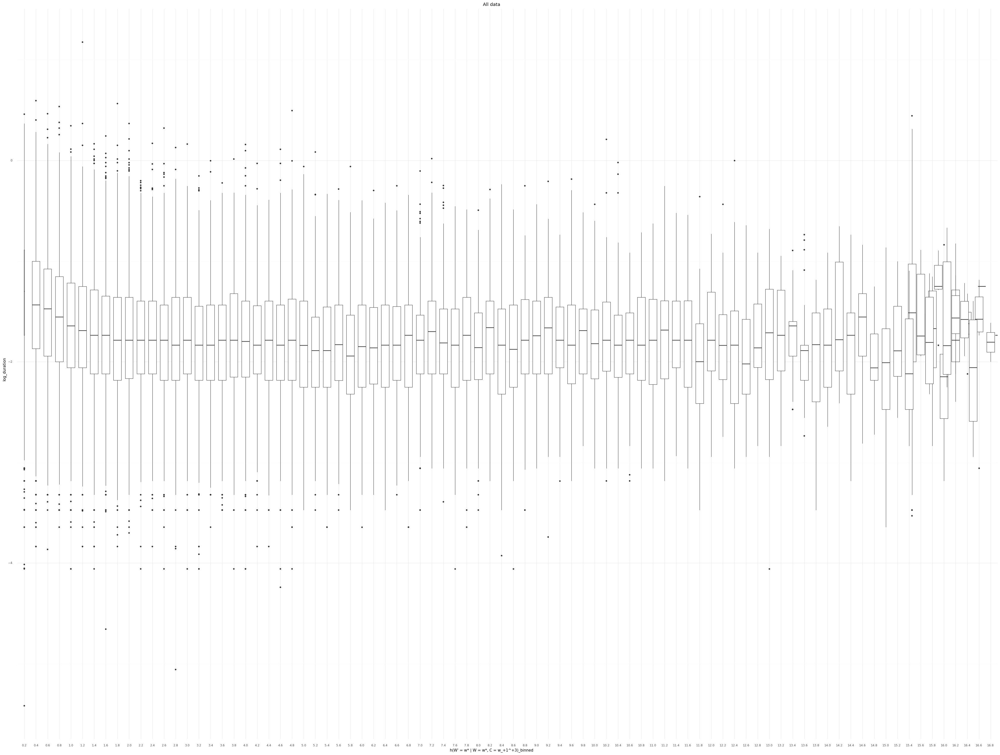

<ggplot: (8788857252669)>

................................................................................
--------------------------------------------------------------------------------
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_boxplot : Removed 2 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


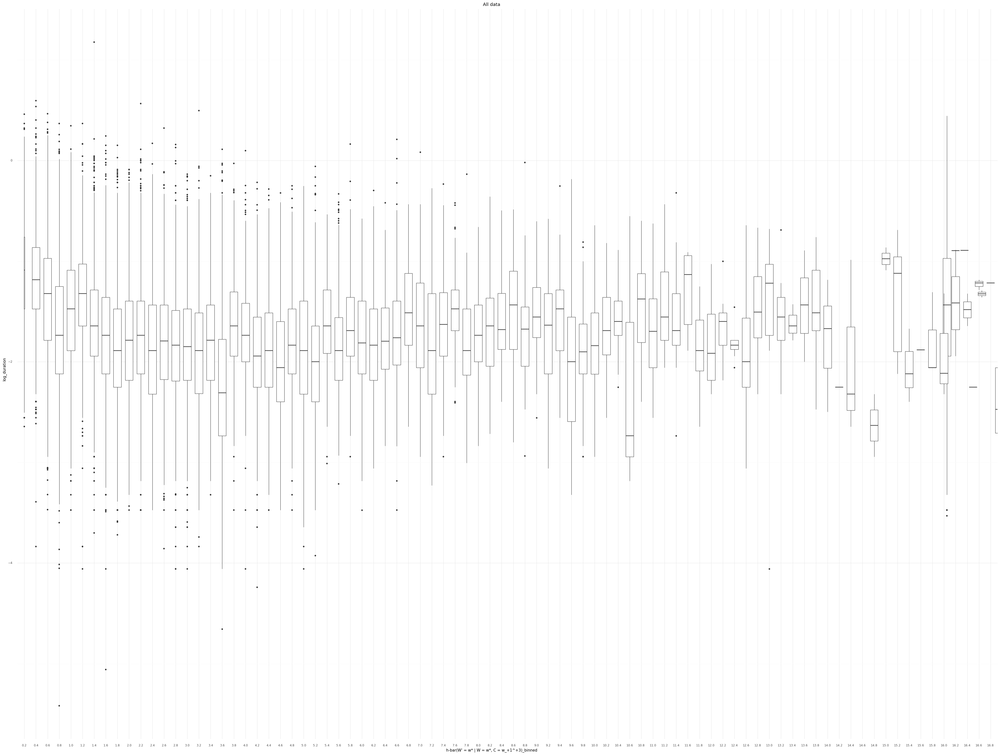

<ggplot: (8788857224049)>

................................................................................
--------------------------------------------------------------------------------
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_boxplot : Removed 2 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


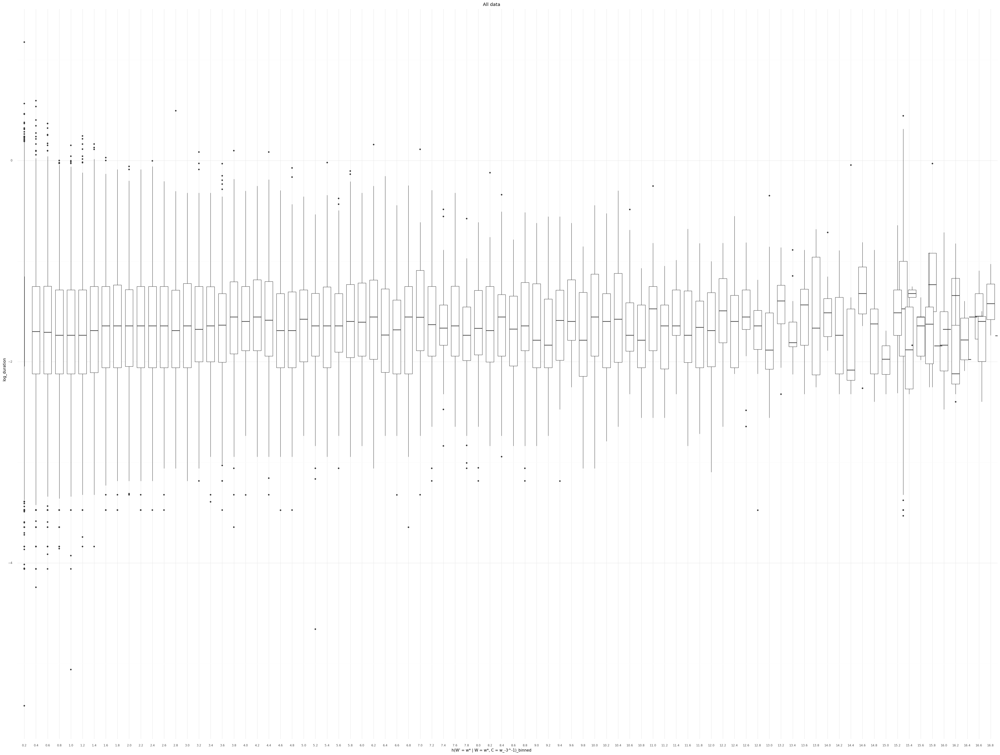

<ggplot: (8788857061873)>

................................................................................
--------------------------------------------------------------------------------
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_boxplot : Removed 2 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


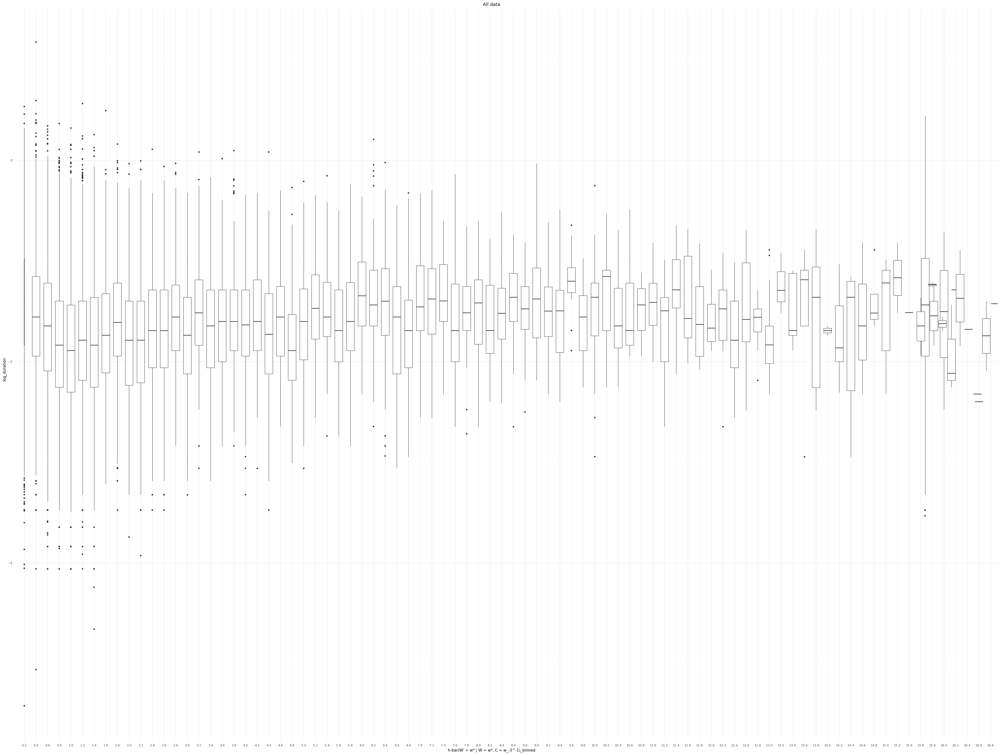

<ggplot: (8788856771453)>

................................................................................
--------------------------------------------------------------------------------




In [168]:
for surp_field in lmap(lambda field_name: field_name + '_binned', (post_field_backward_h,
                                                                   post_field_backward_h_bar,
                                                                   post_field_forward_h,
                                                                   post_field_forward_h_bar)):
#     for surp_field in lmap(lambda field_name: field_name + '_binned', (lm_field_backward_h, post_field_backward_h,
#                                                                        lm_field_forward_h, post_field_forward_h)):
#         print(f"\ts={each_s}, l={each_l}")
    print(f"\tSurprisal Field = {surp_field}")
    for dur_field in ('log_duration',):
#         for dur_field in ('duration', 'log_duration'):
#             print(f"\t\ts={each_s}, l={each_l}")
        print(f"\t\tSurprisal Field = {surp_field}")
        print(f"\t\tDuration Field = {dur_field}")
        x_scale_limits = surprisal_bins_generic_edges_cat_third
#         x_scale_limits = surprisal_bins_generic_edges_cat
#             x_scale_limits = surprisal_bins_edges_cat if "W'" in surp_field else surprisal_bins_lm_edges_cat
        make_plot(dev_words_df, surp_field, dur_field, x_scale_limits=x_scale_limits, title="All data")
#             make_plot(dev_words_df[(dev_words_df['phones_length'] == each_l) & (dev_words_df['syllables'] == each_s)], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"l={each_l}, s={each_s}")
#             make_plot(dev_words_df[dev_words_df['syllables'] == each_s], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"s={each_s}")
        print('.' * 80)
    print('-' * 80)
print('=' * 80)
print('\n')

s=1, l=2
	s=1, l=2
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=1, l=2
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=1, l=2, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


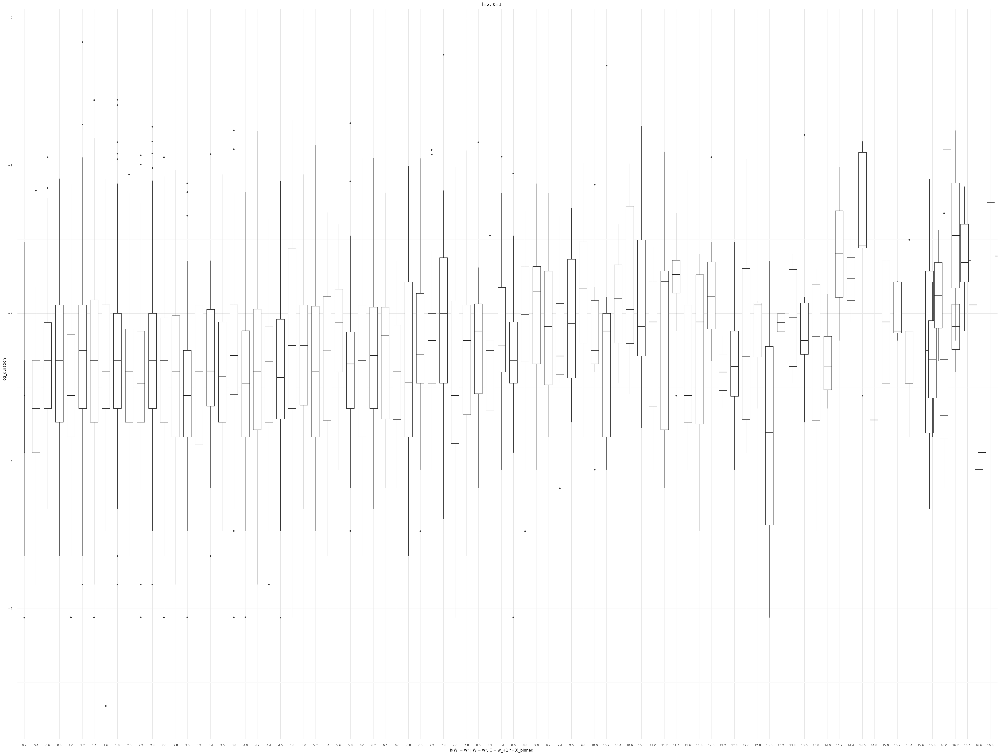

<ggplot: (8788853384313)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=2
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=1, l=2
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=1, l=2, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


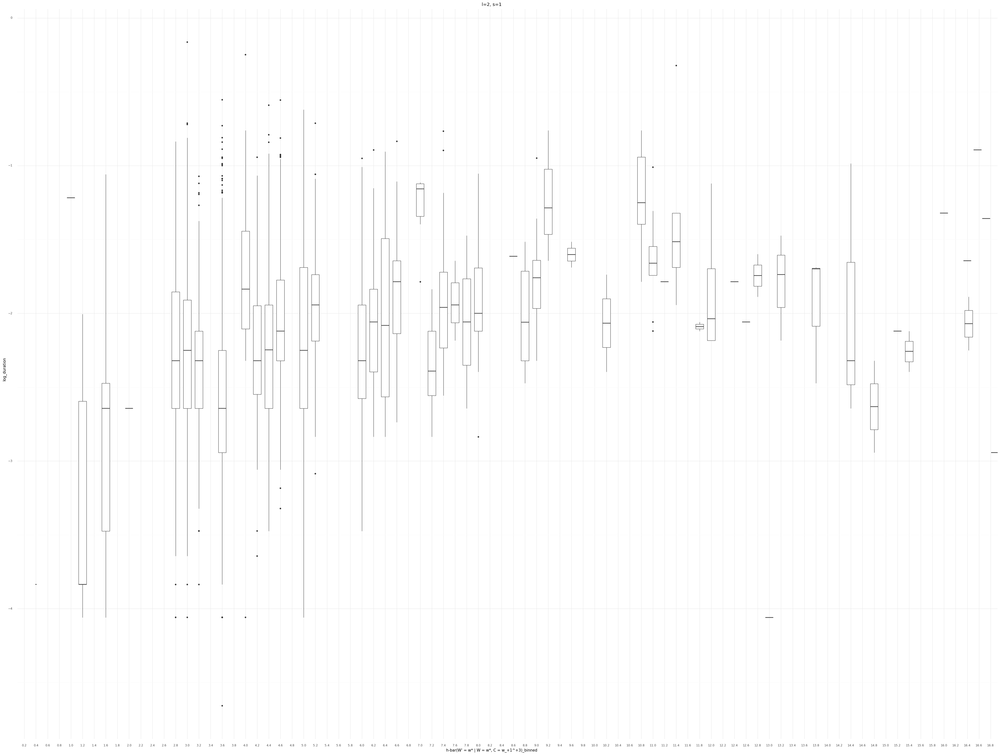

<ggplot: (8788857088957)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=2
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=1, l=2
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=1, l=2, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


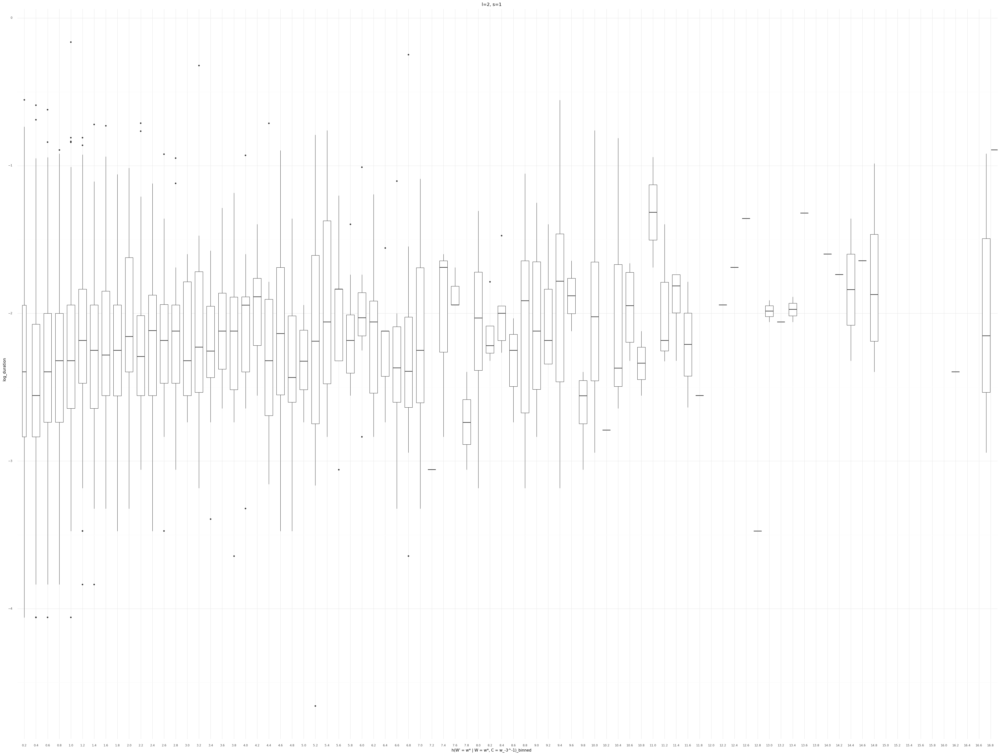

<ggplot: (8788856924261)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=2
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=1, l=2
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=1, l=2, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


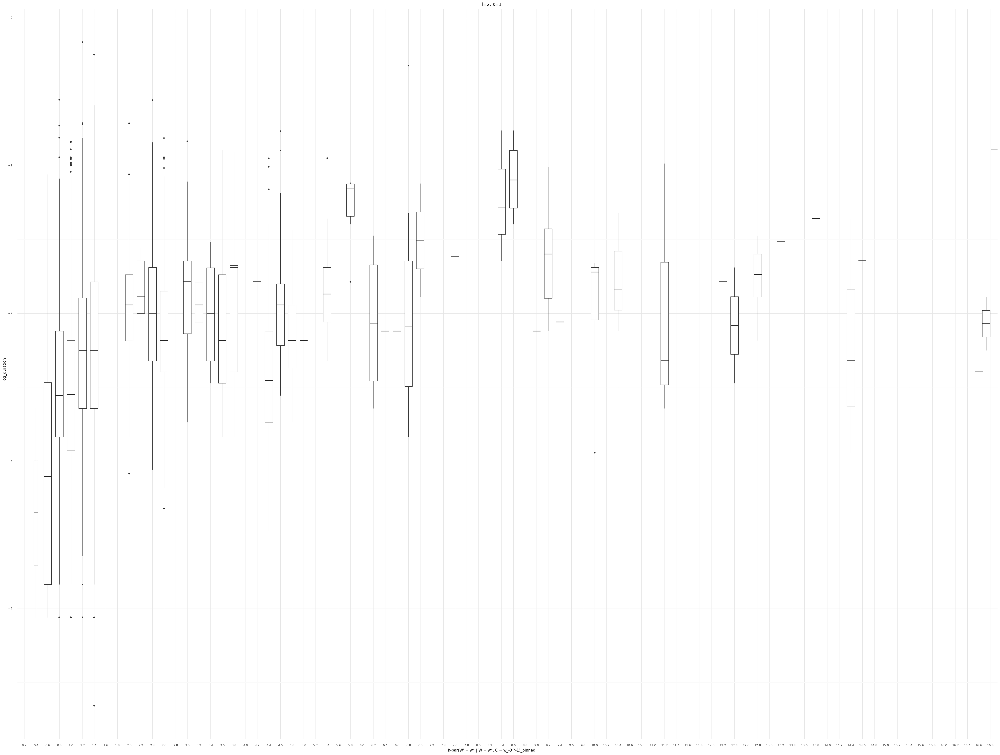

<ggplot: (8788853354657)>

................................................................................
--------------------------------------------------------------------------------


s=1, l=3
	s=1, l=3
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=1, l=3
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=1, l=3, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


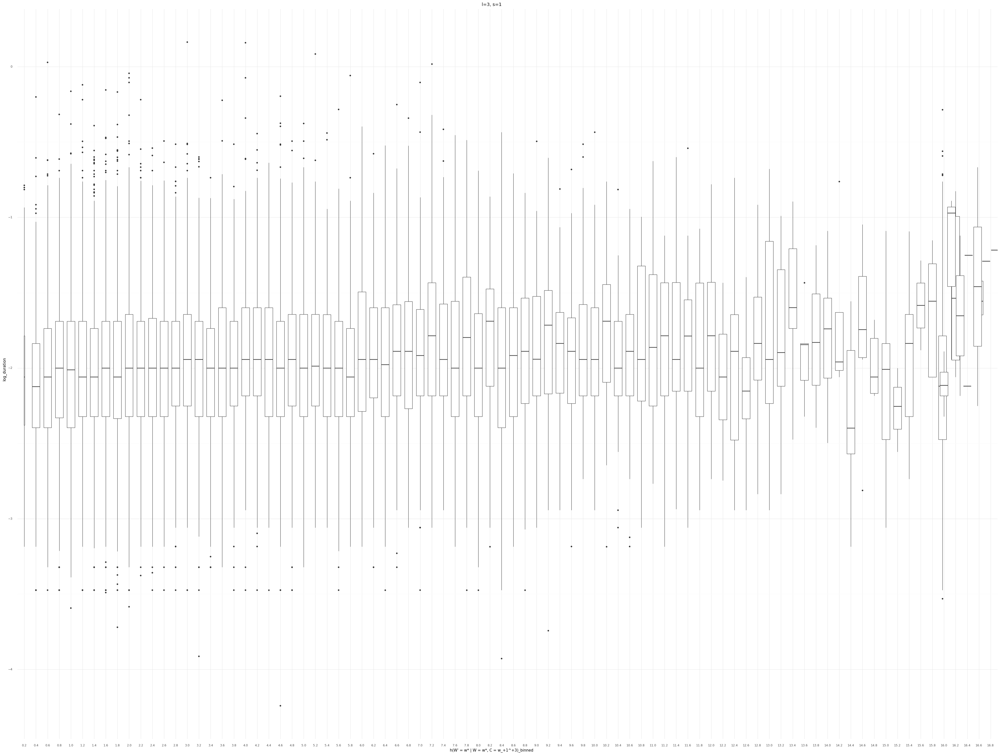

<ggplot: (8788853367445)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=3
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=1, l=3
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=1, l=3, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


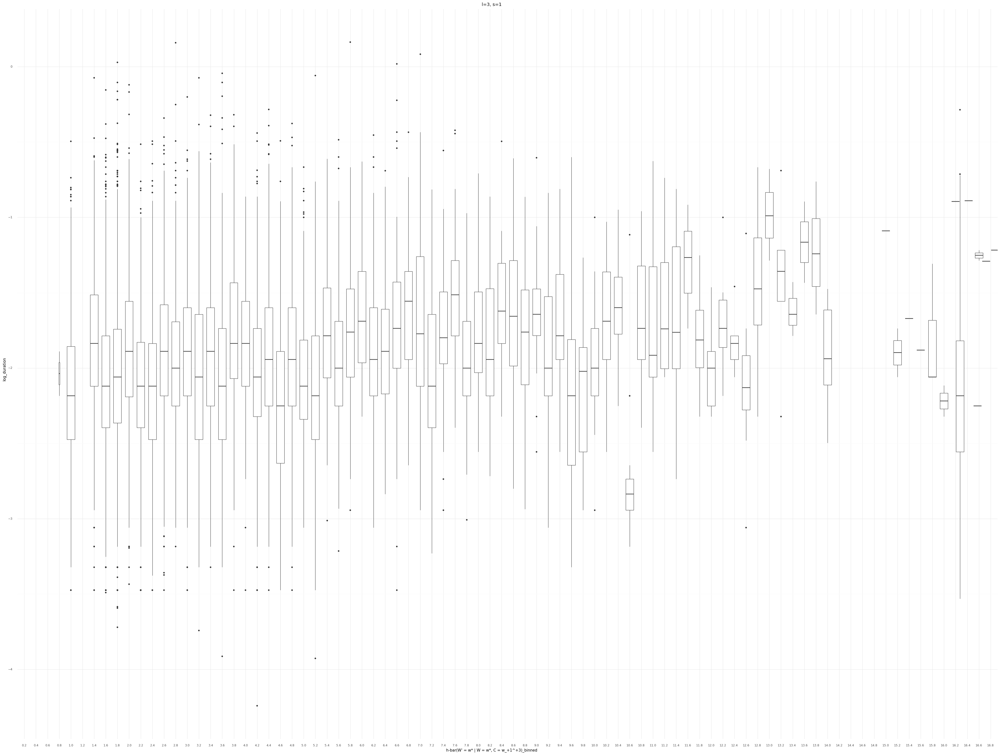

<ggplot: (8788839926913)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=3
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=1, l=3
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=1, l=3, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


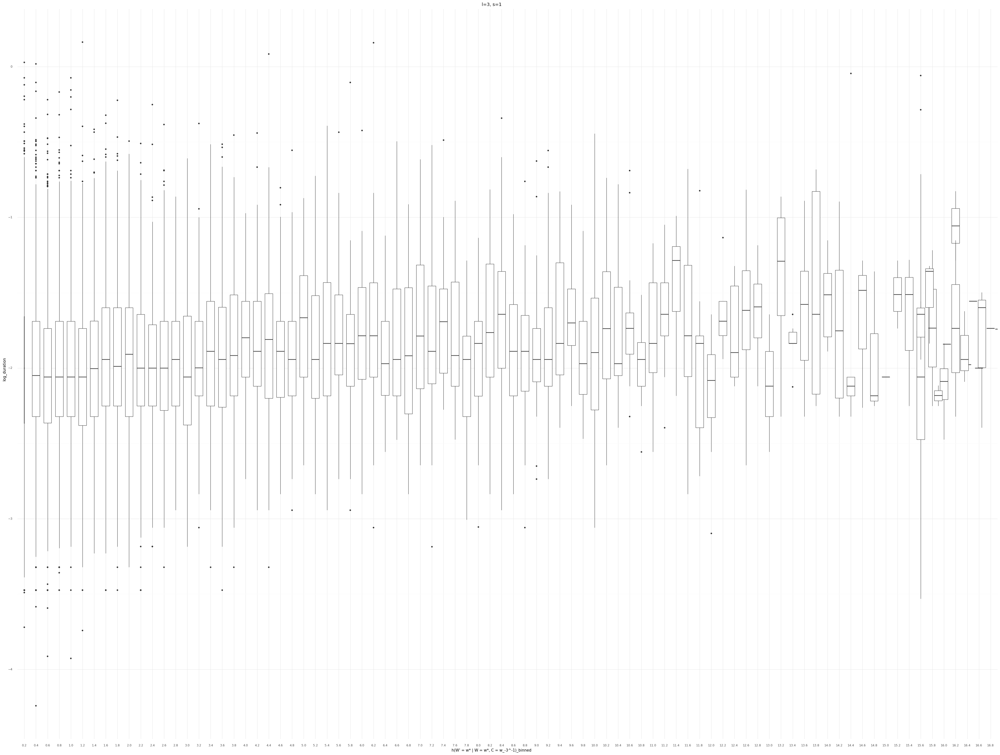

<ggplot: (8788839980997)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=3
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=1, l=3
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=1, l=3, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


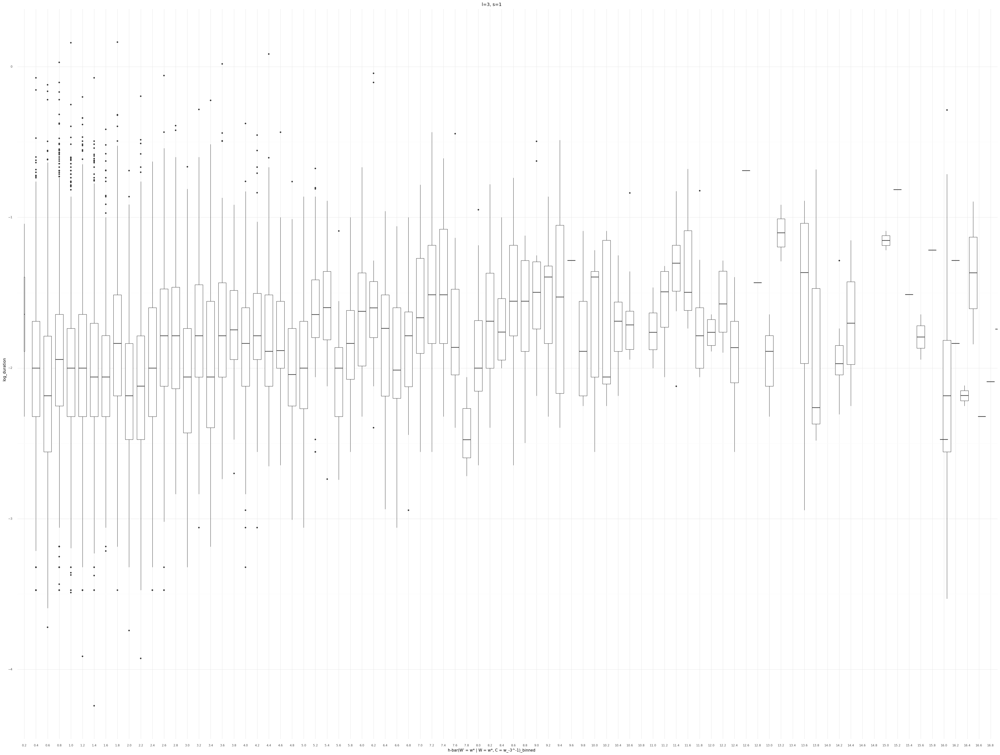

<ggplot: (8788843229501)>

................................................................................
--------------------------------------------------------------------------------


s=1, l=4
	s=1, l=4
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=1, l=4
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=1, l=4, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_boxplot : Removed 2 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


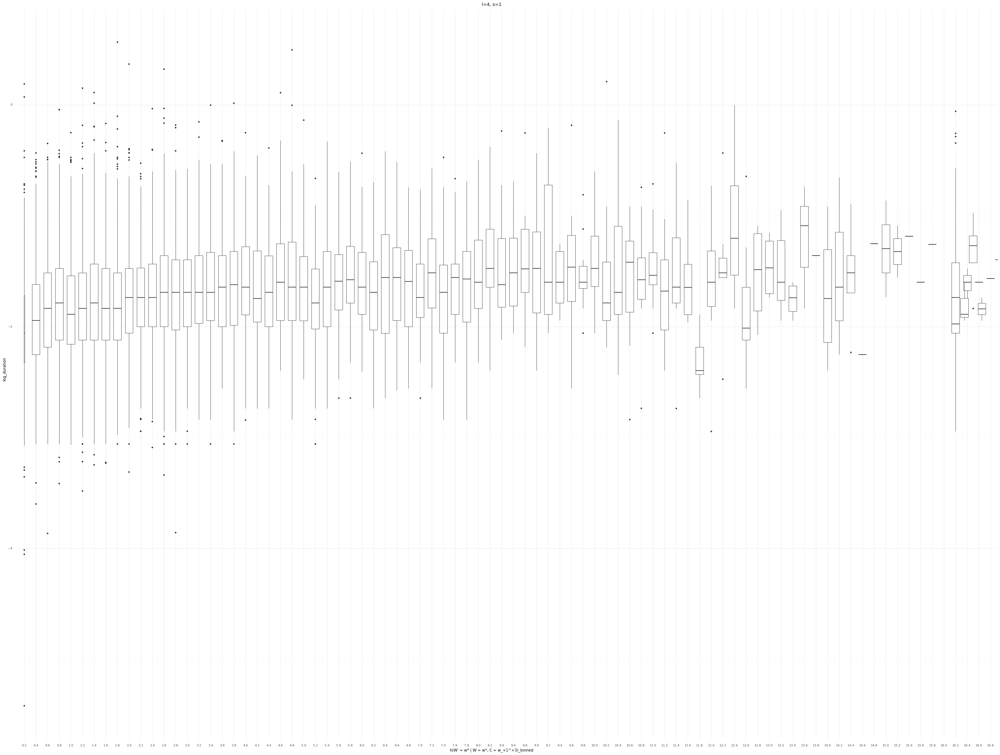

<ggplot: (8788826238541)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=4
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=1, l=4
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=1, l=4, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_boxplot : Removed 2 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


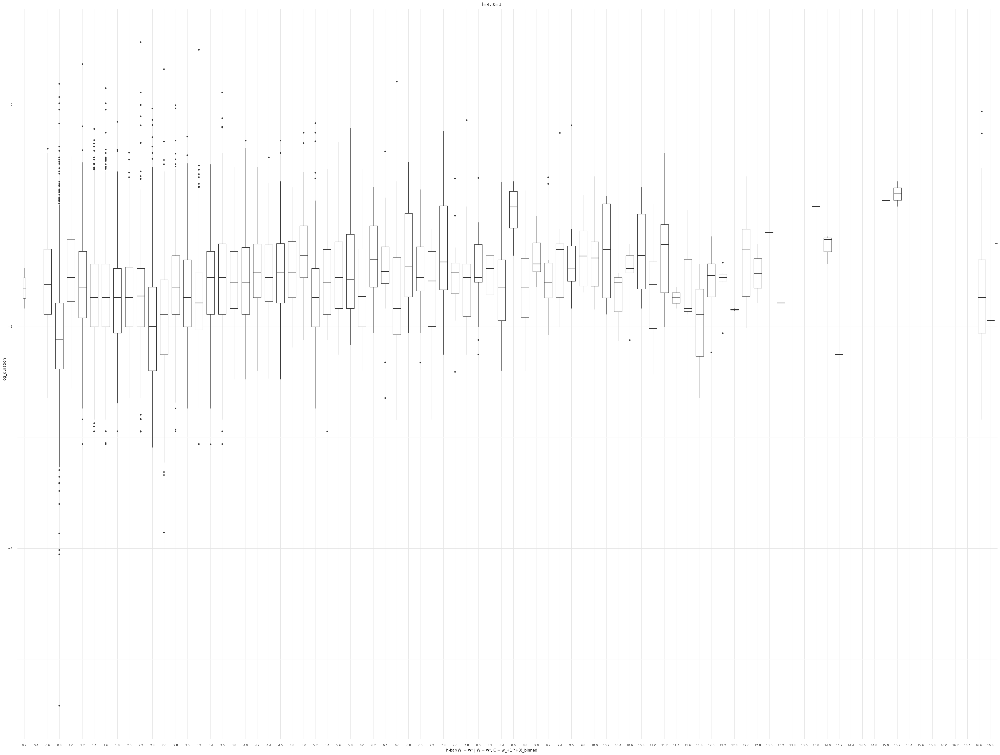

<ggplot: (8788836504989)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=4
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=1, l=4
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=1, l=4, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_boxplot : Removed 2 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


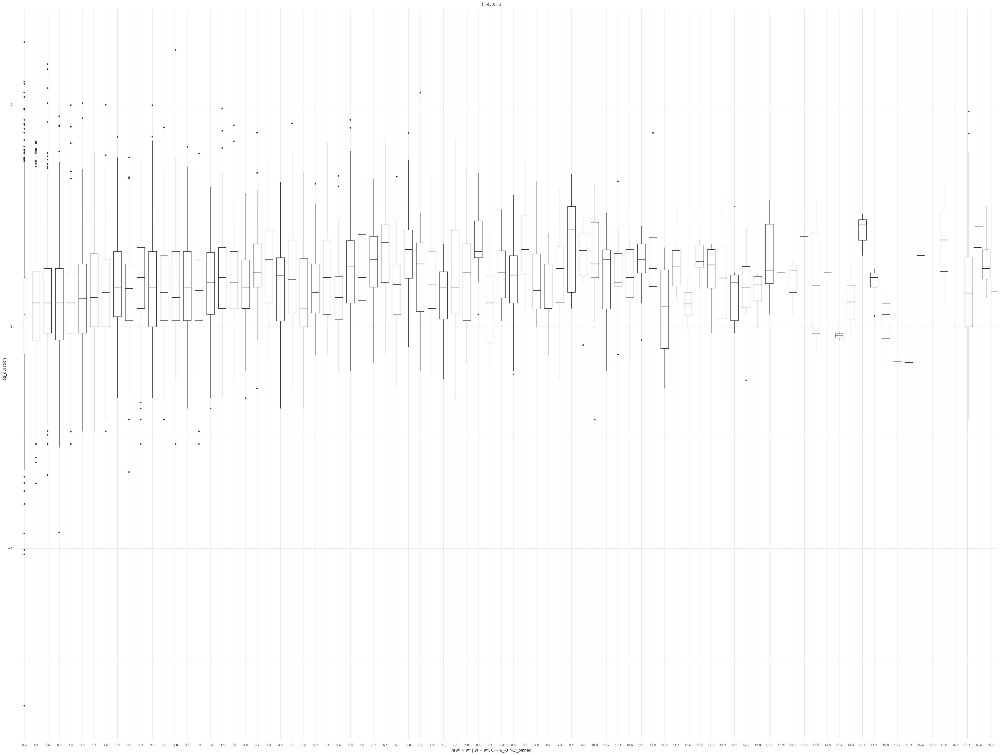

<ggplot: (8788833092565)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=4
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=1, l=4
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=1, l=4, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/layer.py:360: PlotnineWarning: stat_boxplot : Removed 2 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)
/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


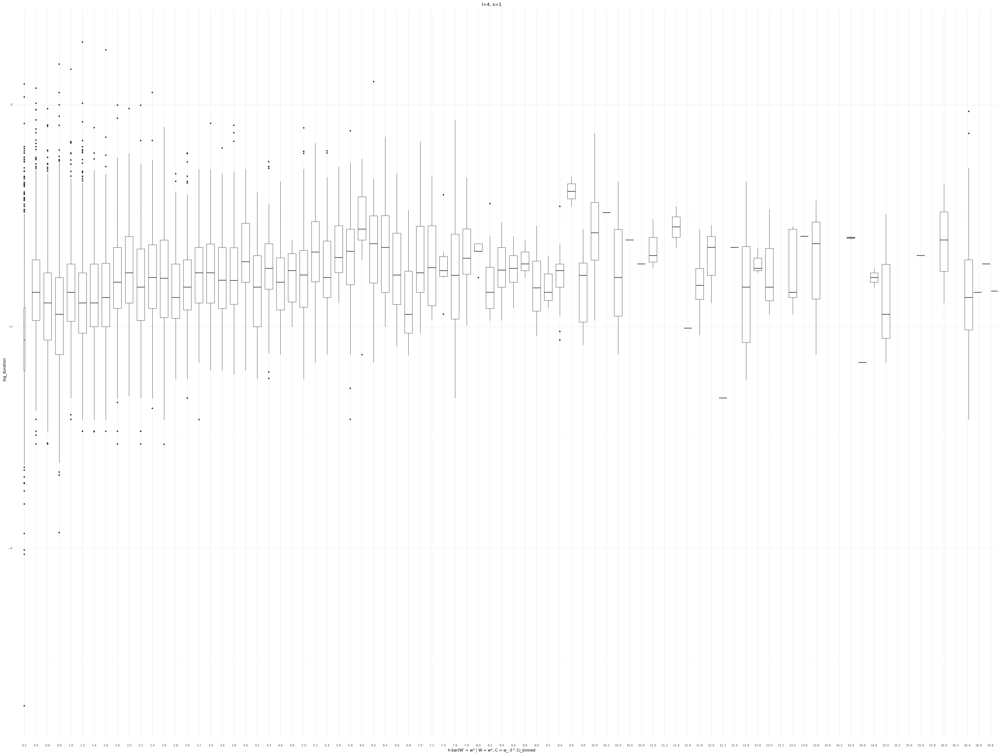

<ggplot: (8788819461601)>

................................................................................
--------------------------------------------------------------------------------


s=1, l=5
	s=1, l=5
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=1, l=5
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=1, l=5, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


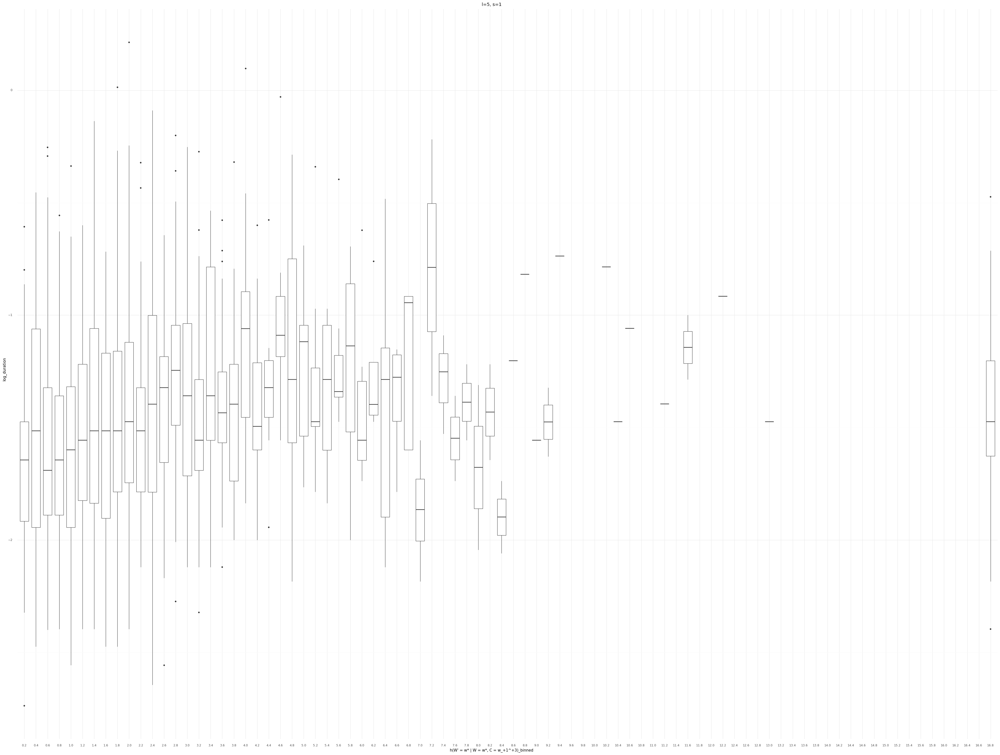

<ggplot: (8788915607417)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=5
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=1, l=5
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=1, l=5, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


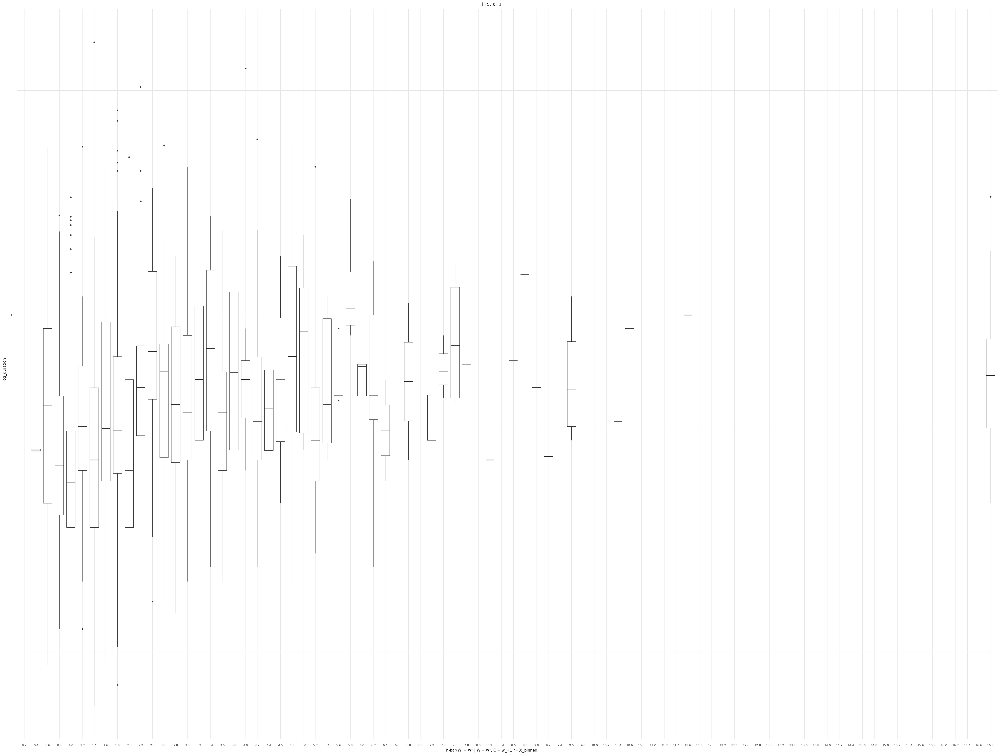

<ggplot: (8788887240377)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=5
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=1, l=5
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=1, l=5, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


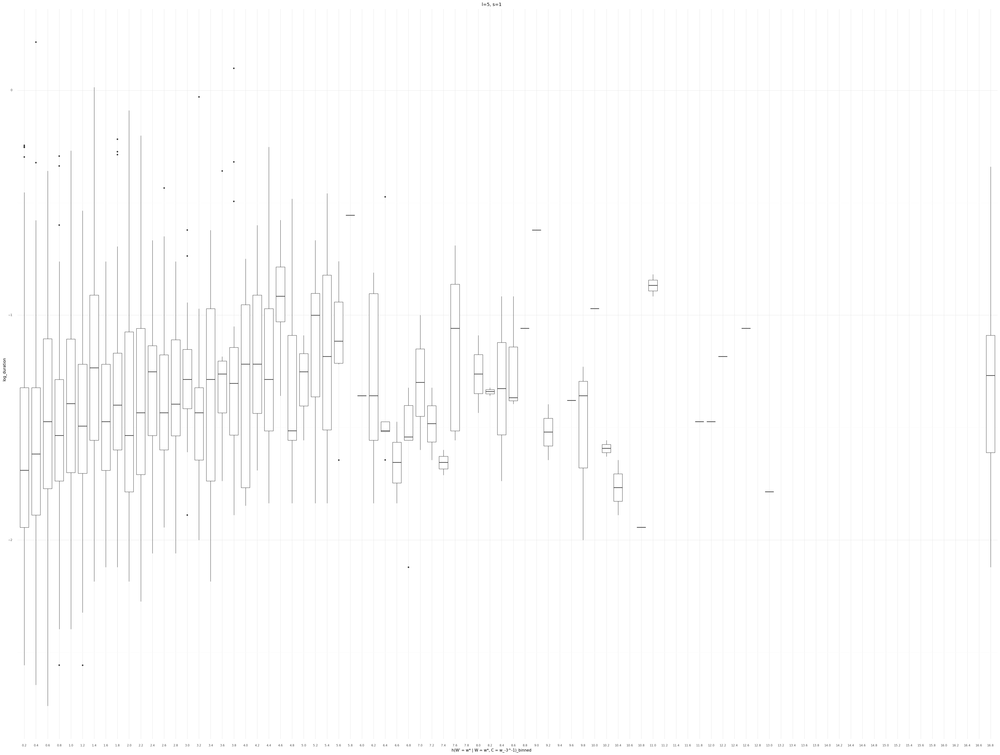

<ggplot: (8788819458197)>

................................................................................
--------------------------------------------------------------------------------
	s=1, l=5
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=1, l=5
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=1, l=5, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


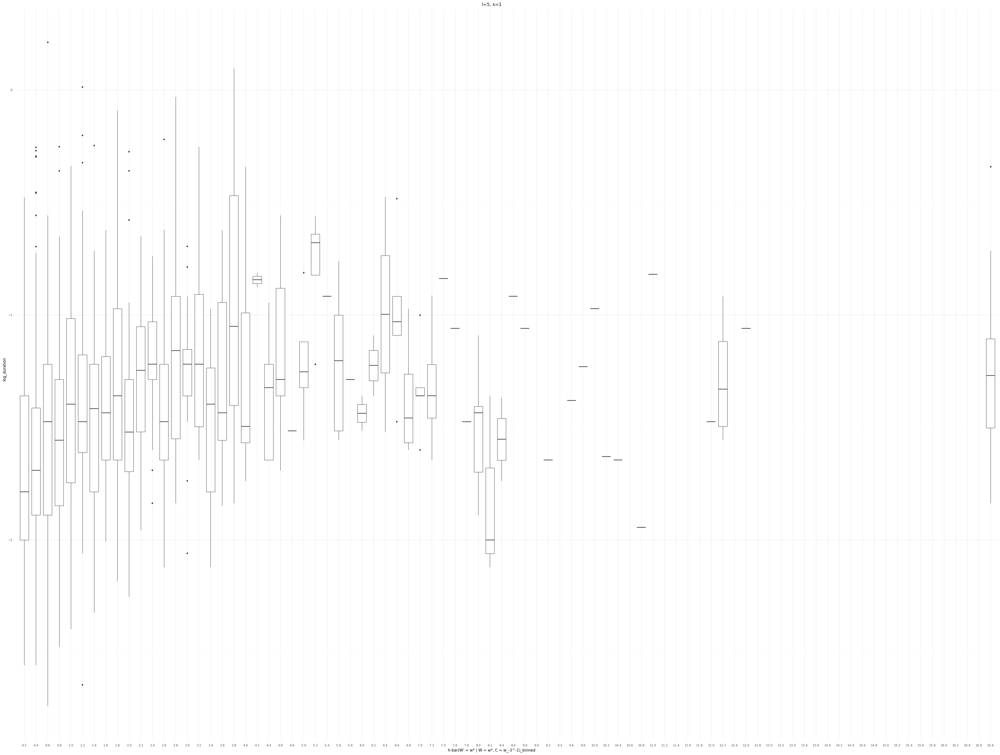

<ggplot: (8788856914961)>

................................................................................
--------------------------------------------------------------------------------


s=2, l=4
	s=2, l=4
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=2, l=4
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=2, l=4, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


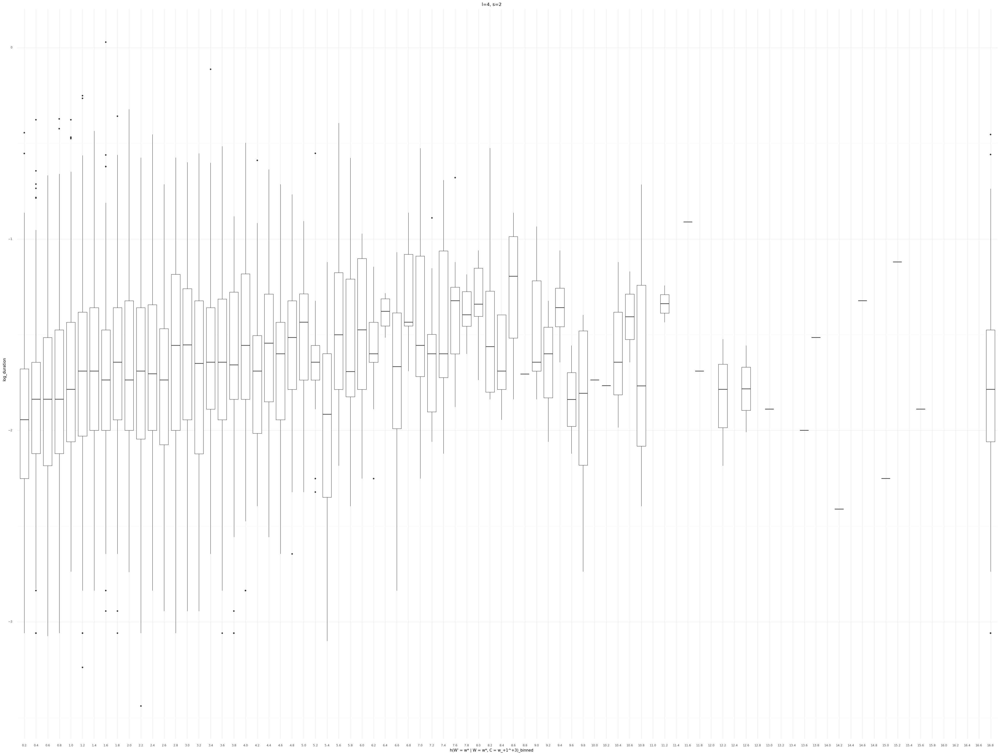

<ggplot: (8788826246109)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=4
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=2, l=4
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=2, l=4, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


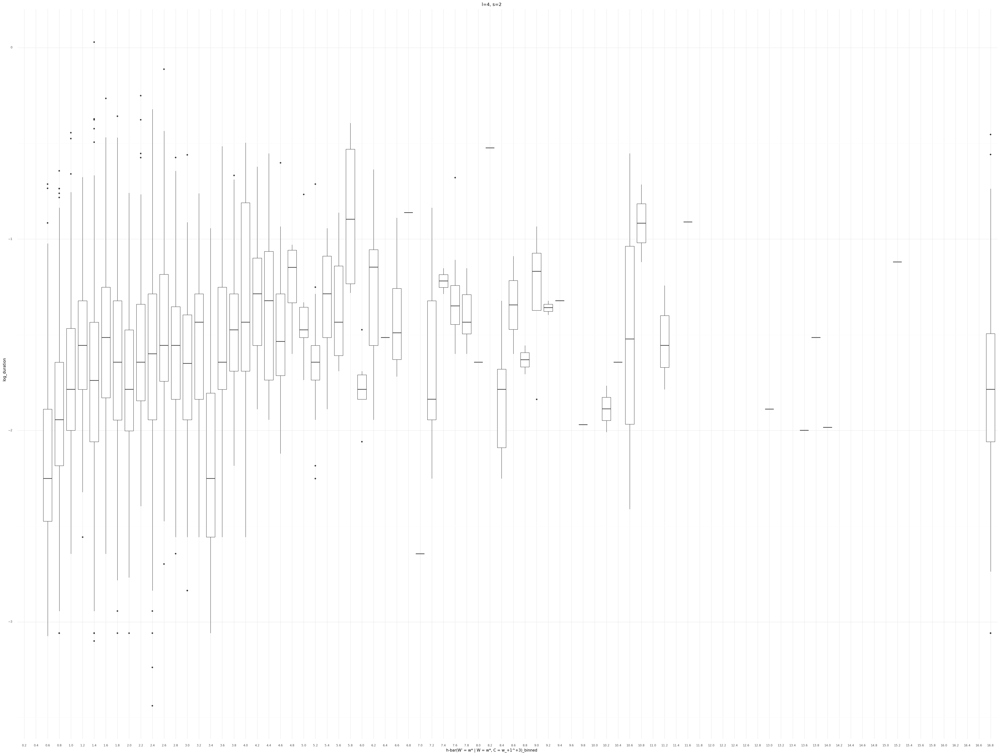

<ggplot: (8788887158681)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=4
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=2, l=4
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=2, l=4, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


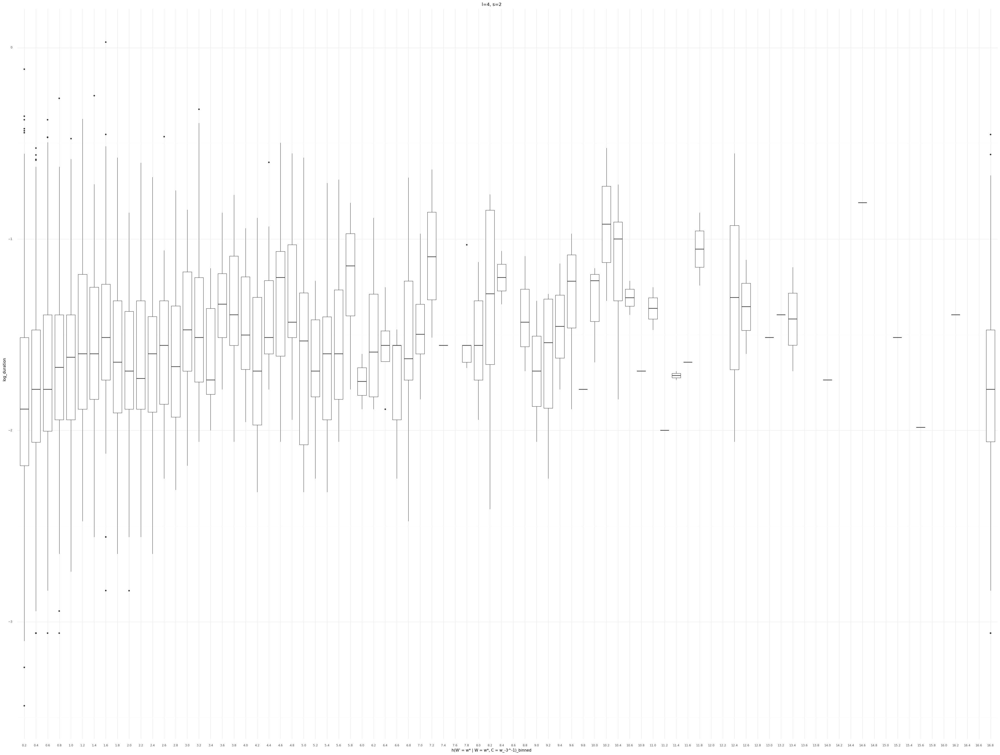

<ggplot: (8788864103257)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=4
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=2, l=4
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=2, l=4, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


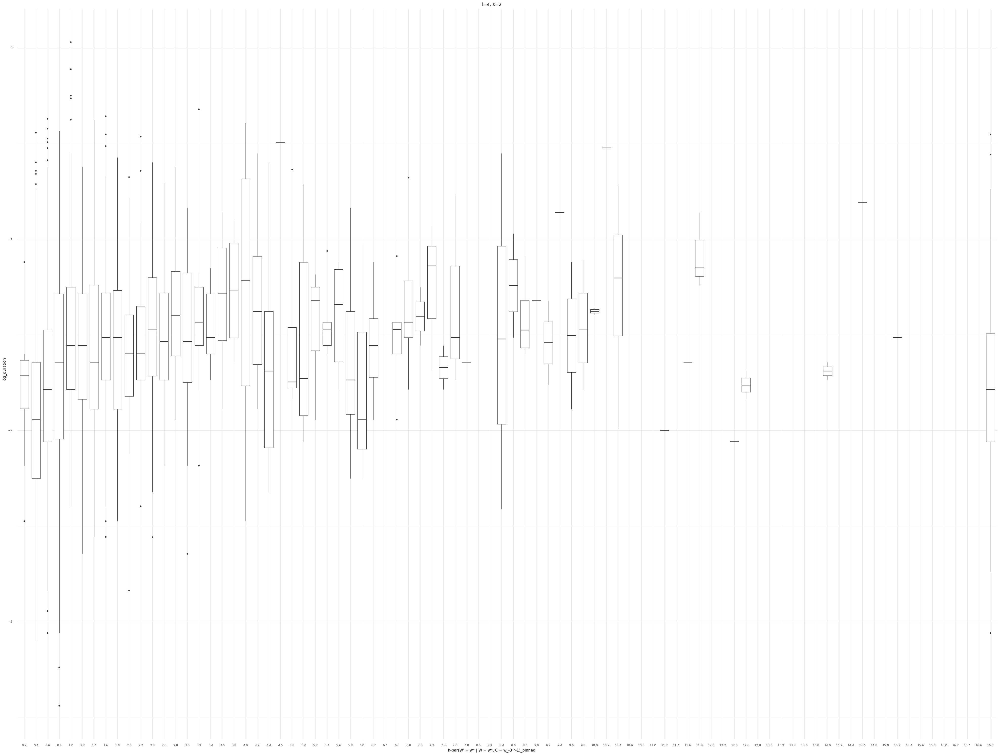

<ggplot: (8788863687605)>

................................................................................
--------------------------------------------------------------------------------


s=2, l=5
	s=2, l=5
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=2, l=5
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=2, l=5, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


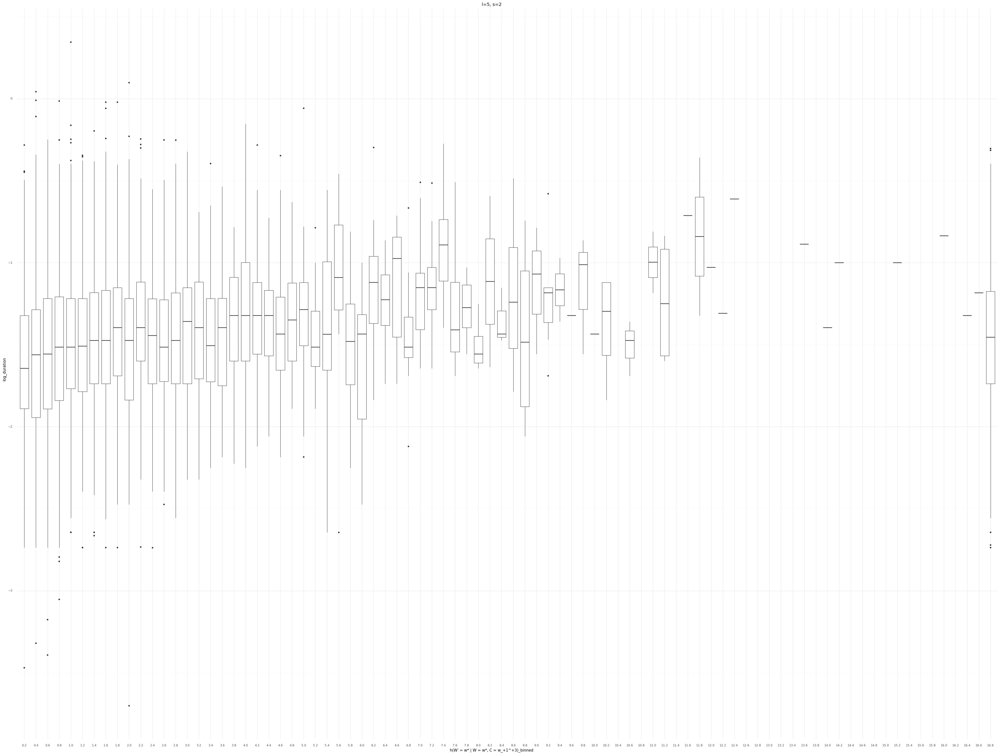

<ggplot: (8788915499529)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=5
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=2, l=5
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=2, l=5, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


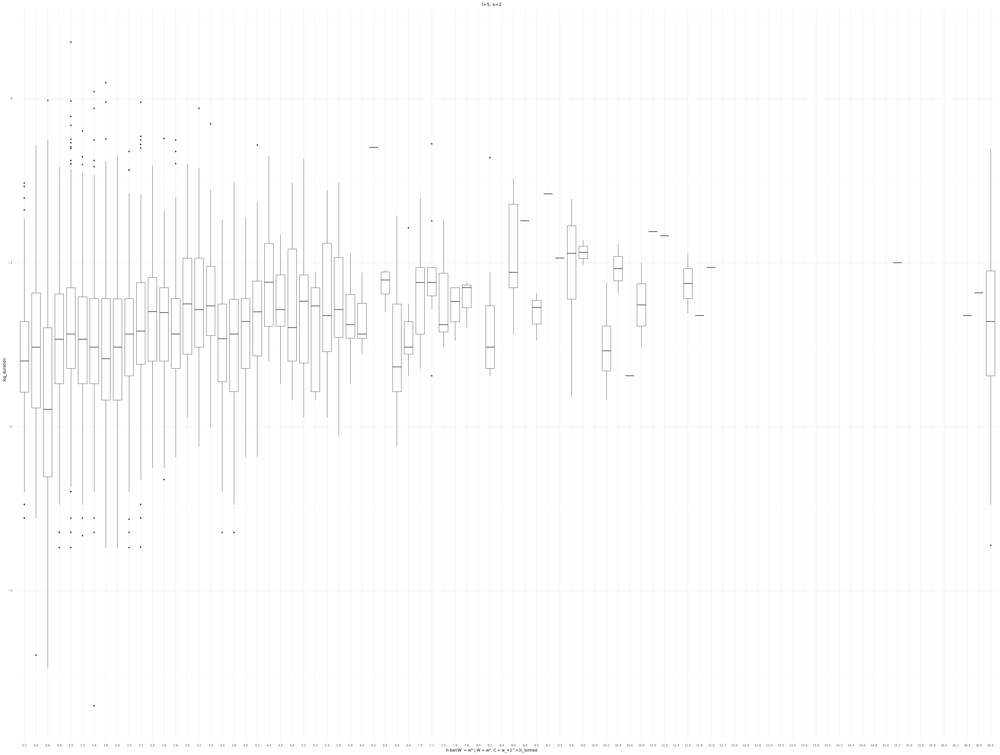

<ggplot: (8788870770269)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=5
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=2, l=5
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=2, l=5, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


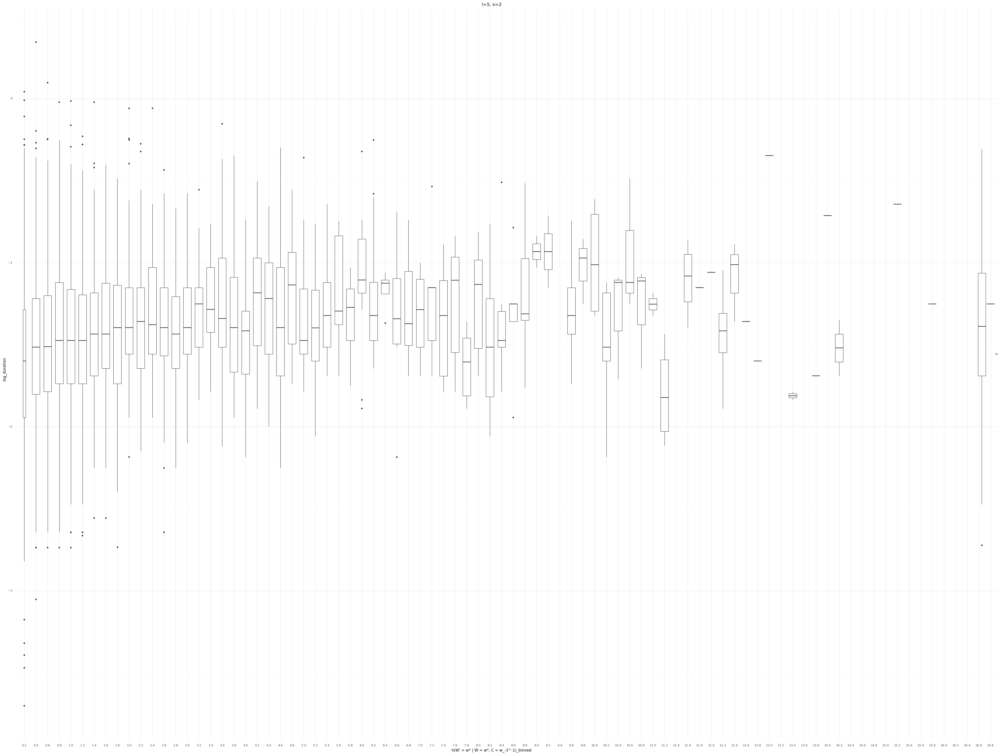

<ggplot: (8788863856025)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=5
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=2, l=5
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=2, l=5, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


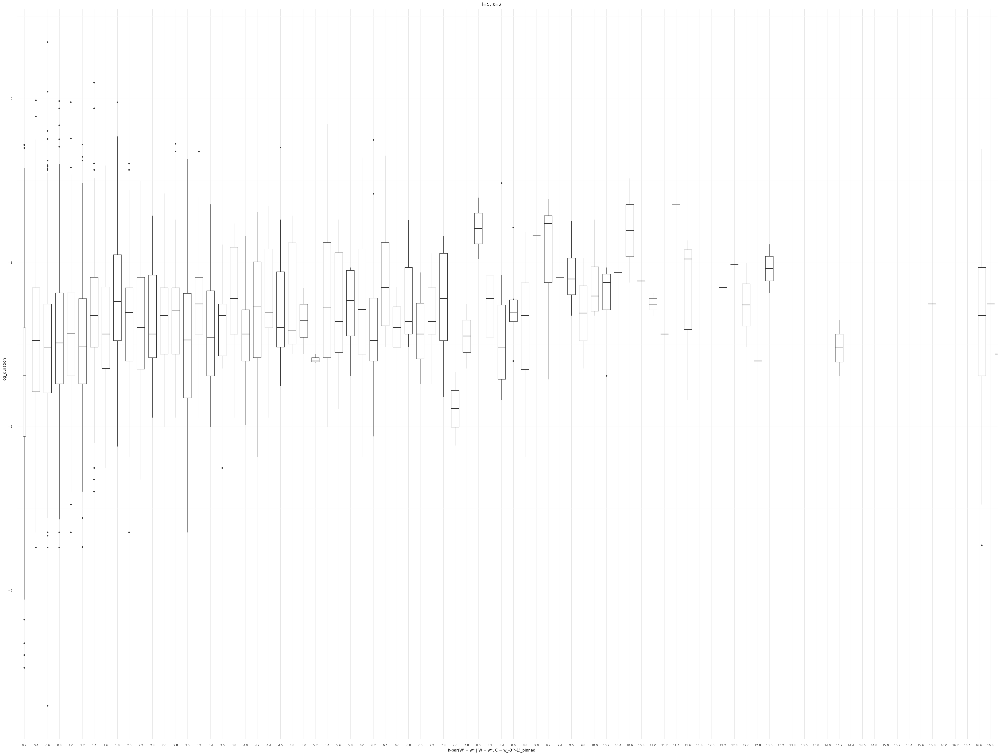

<ggplot: (8788863618369)>

................................................................................
--------------------------------------------------------------------------------


s=2, l=6
	s=2, l=6
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=2, l=6
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=2, l=6, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


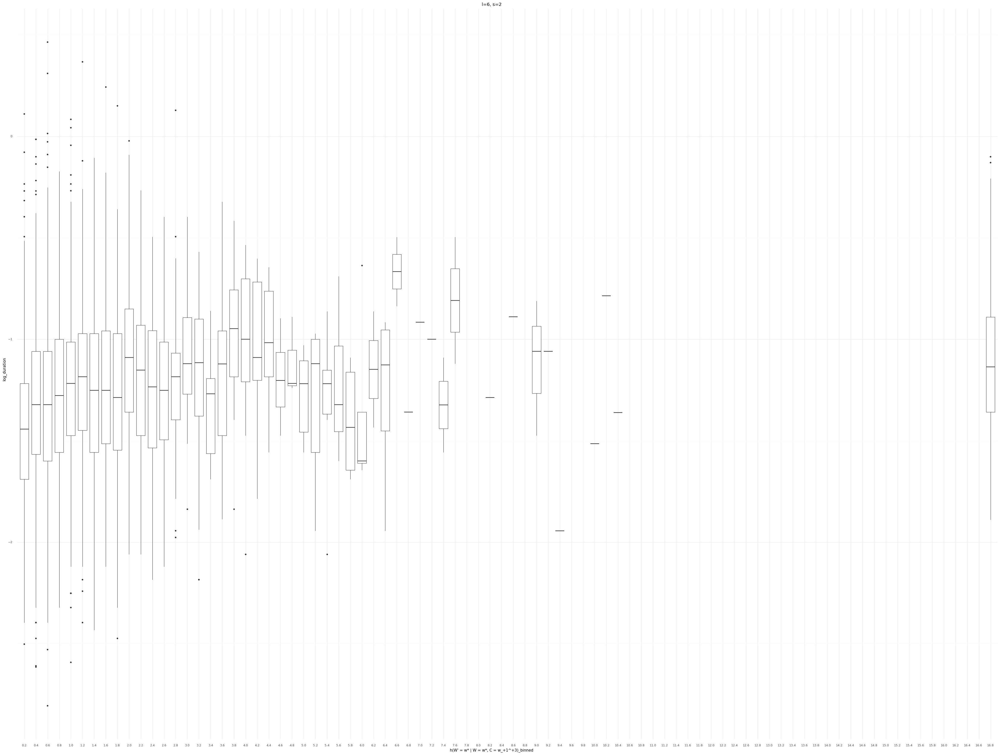

<ggplot: (8788863588045)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=6
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=2, l=6
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=2, l=6, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


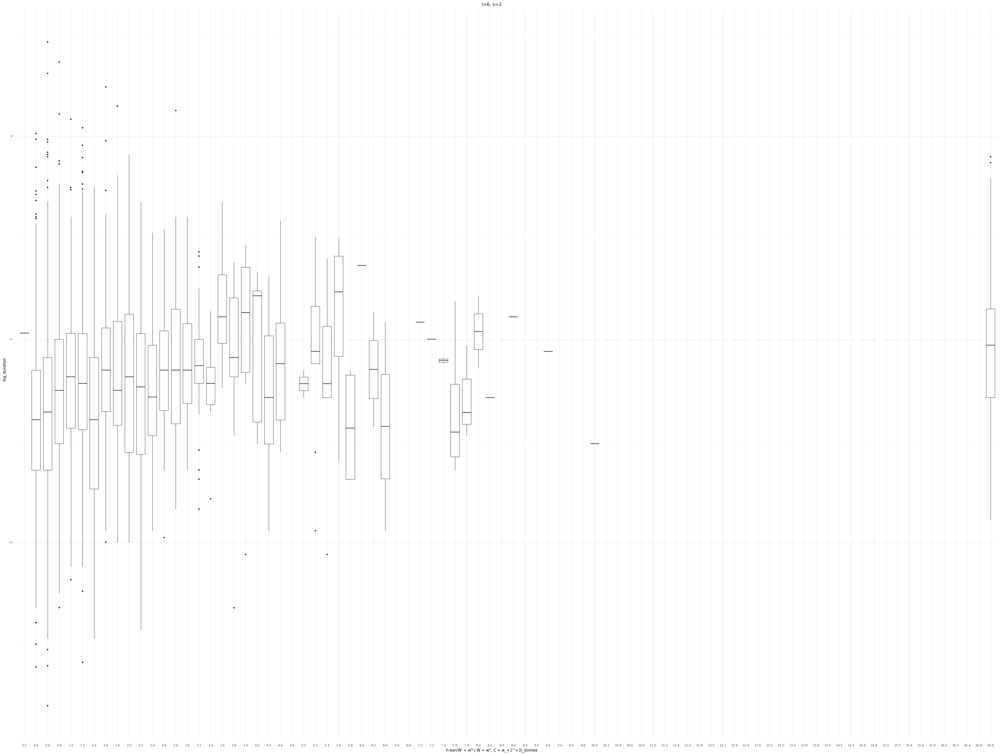

<ggplot: (8788864081641)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=6
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=2, l=6
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=2, l=6, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


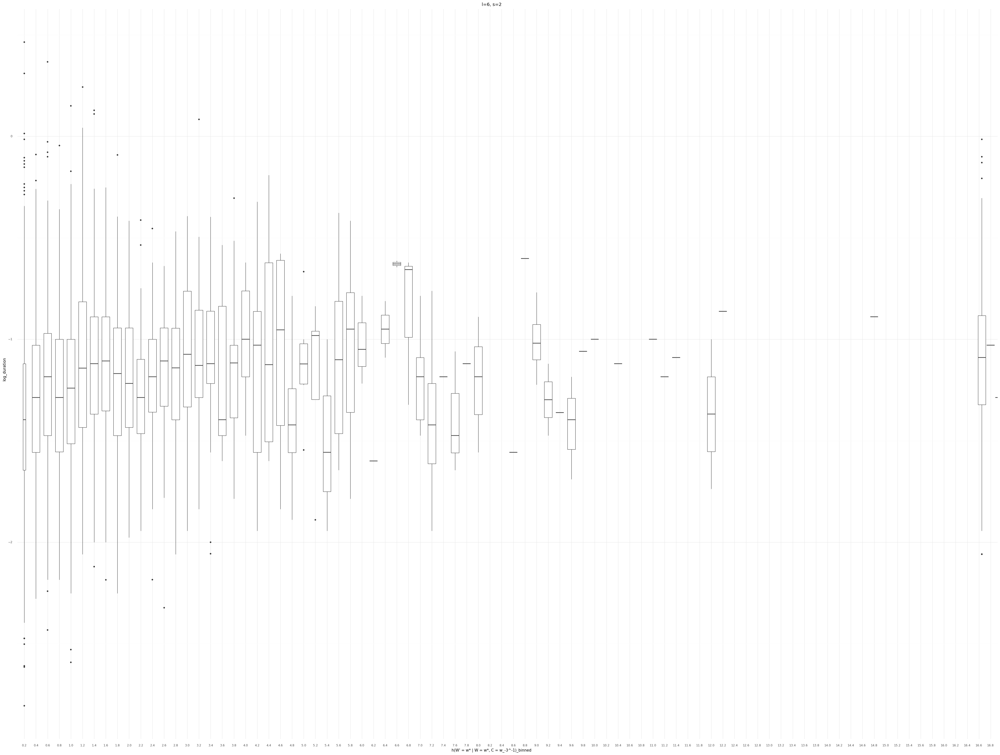

<ggplot: (8788862039037)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=6
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=2, l=6
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=2, l=6, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


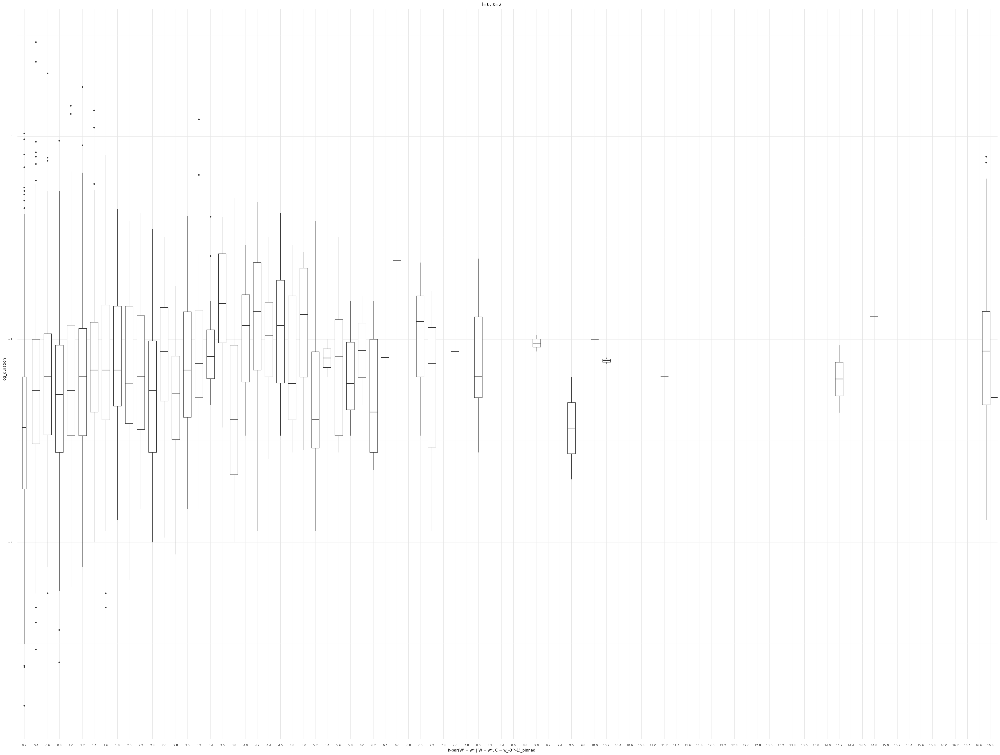

<ggplot: (8788862949829)>

................................................................................
--------------------------------------------------------------------------------


s=2, l=7
	s=2, l=7
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=2, l=7
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=2, l=7, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


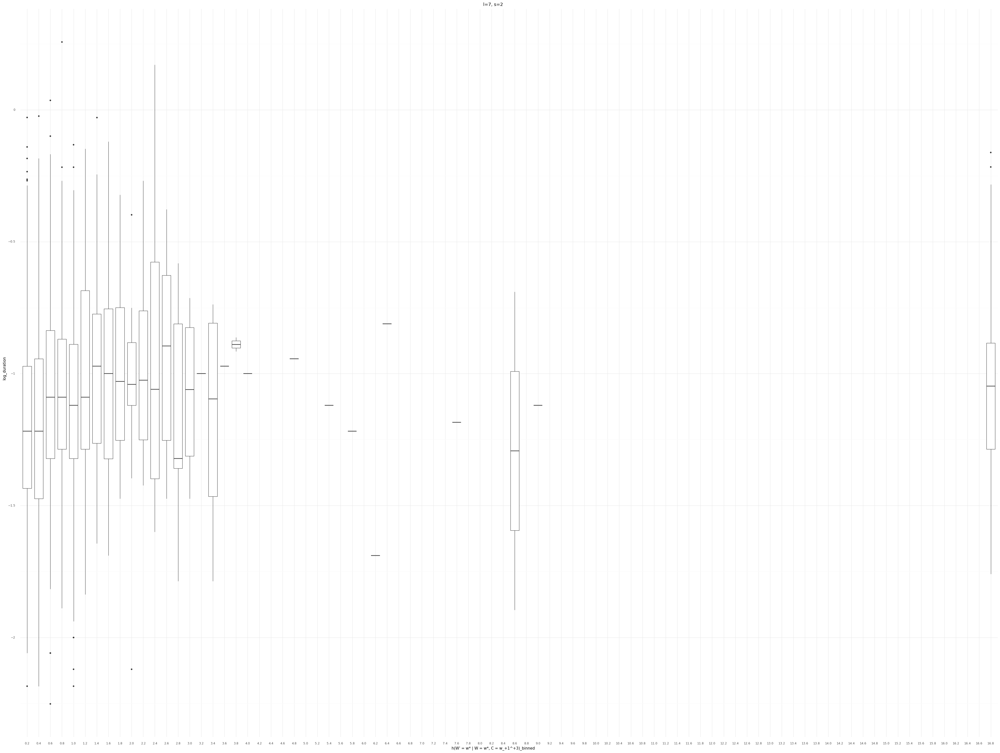

<ggplot: (8788863370701)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=7
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=2, l=7
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=2, l=7, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


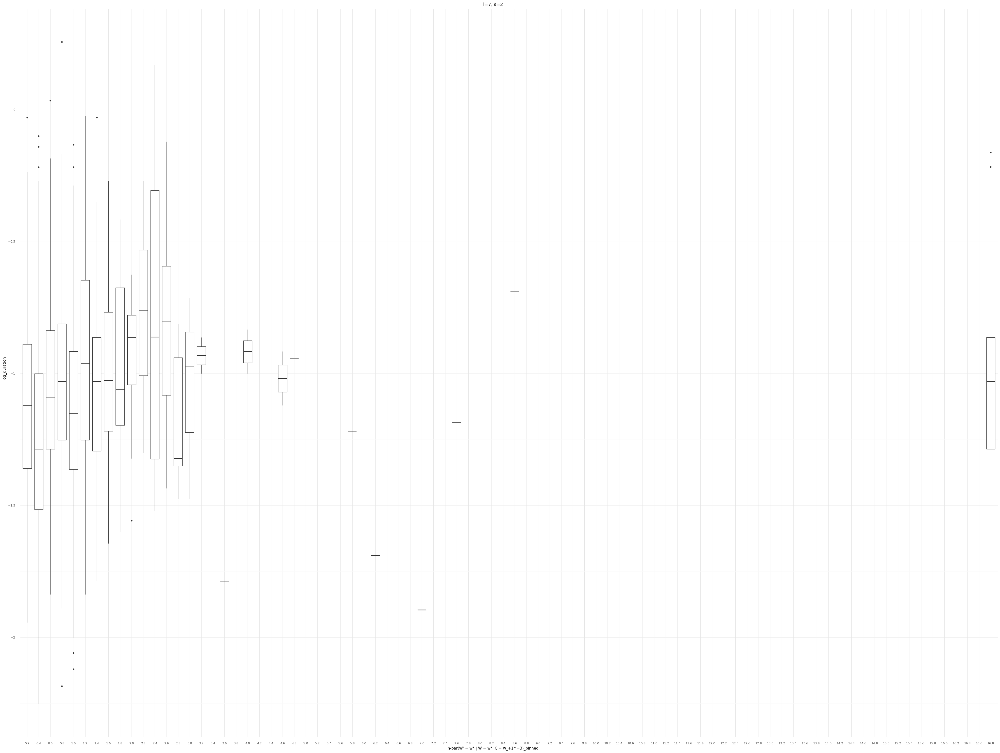

<ggplot: (8788782156437)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=7
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=2, l=7
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=2, l=7, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


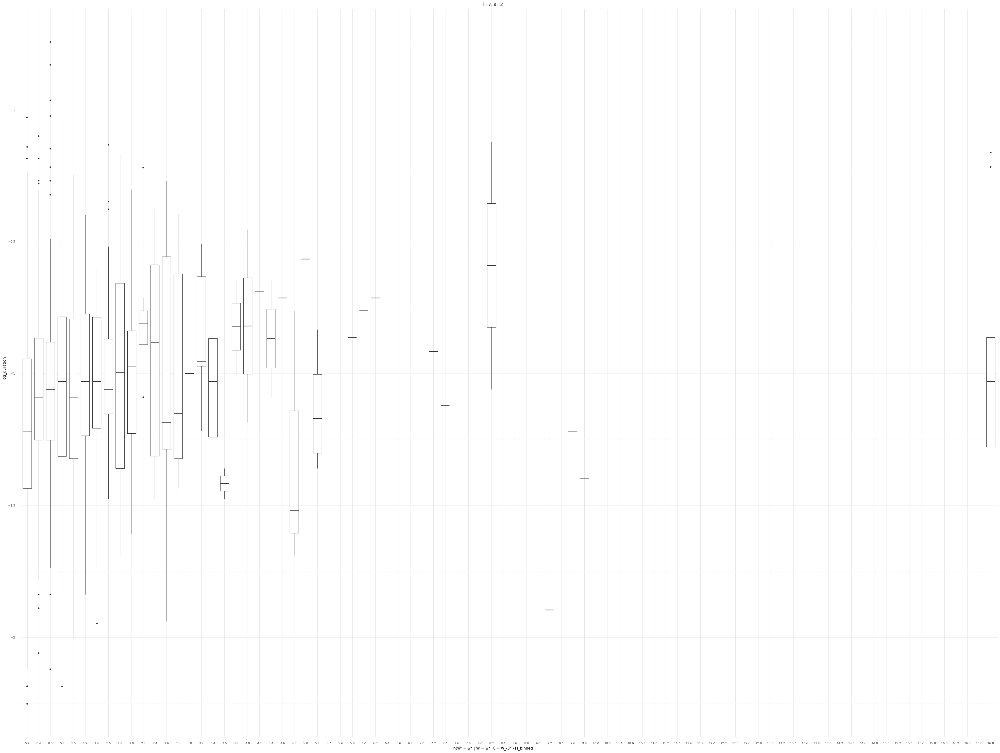

<ggplot: (8788861920217)>

................................................................................
--------------------------------------------------------------------------------
	s=2, l=7
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=2, l=7
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=2, l=7, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


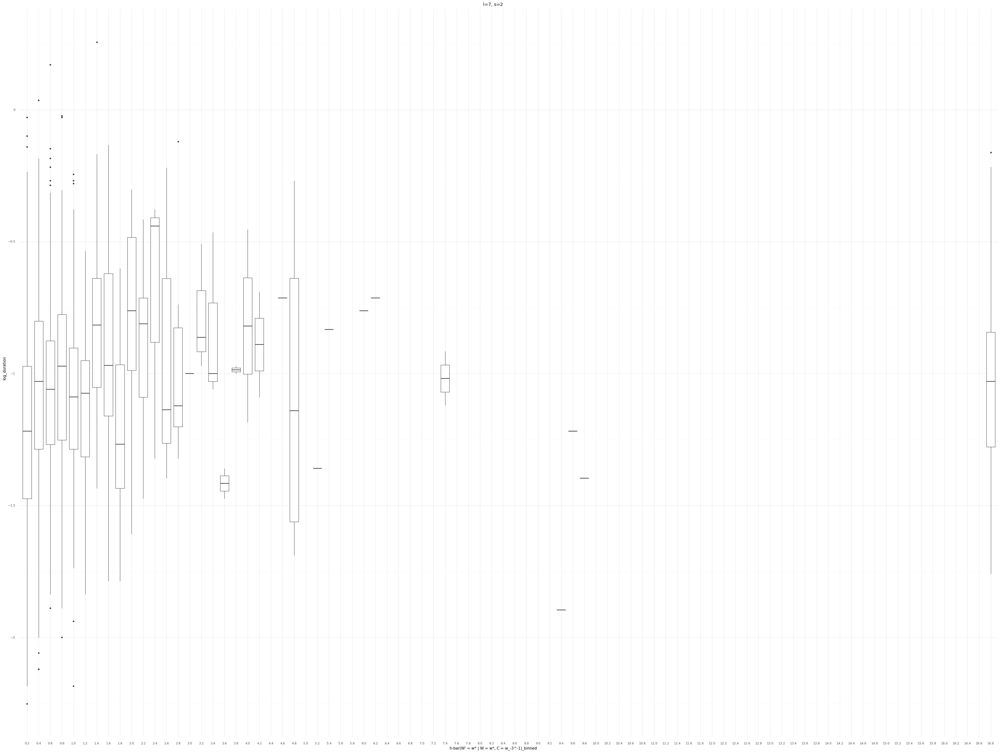

<ggplot: (8788862589689)>

................................................................................
--------------------------------------------------------------------------------


s=3, l=6
	s=3, l=6
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=3, l=6
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=3, l=6, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


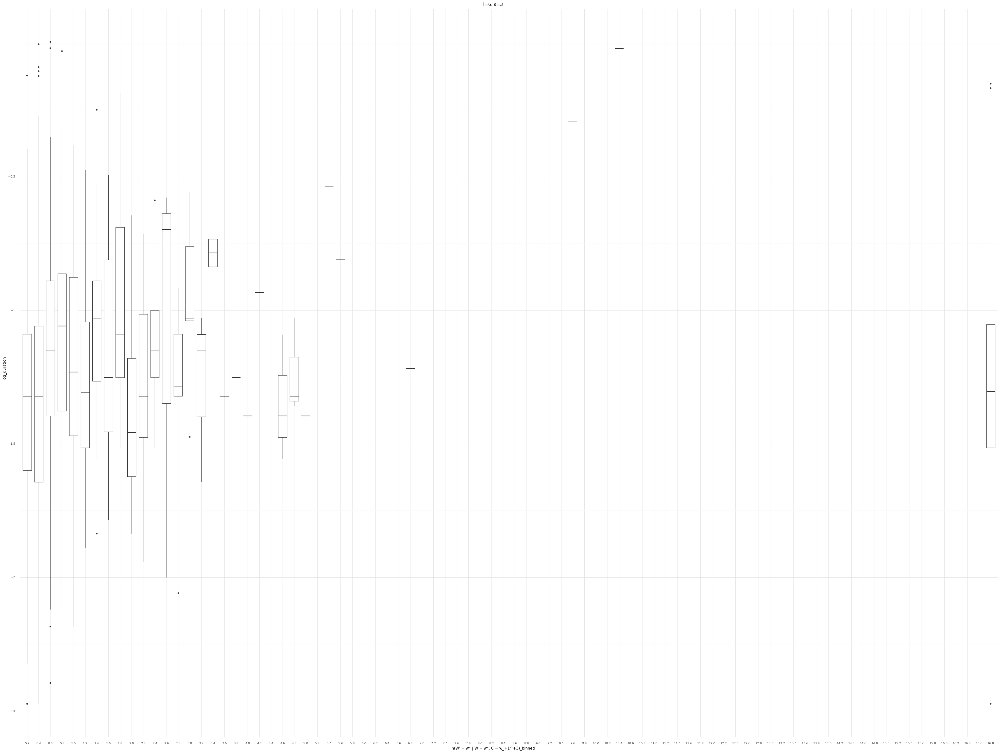

<ggplot: (8788782136189)>

................................................................................
--------------------------------------------------------------------------------
	s=3, l=6
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=3, l=6
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=3, l=6, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


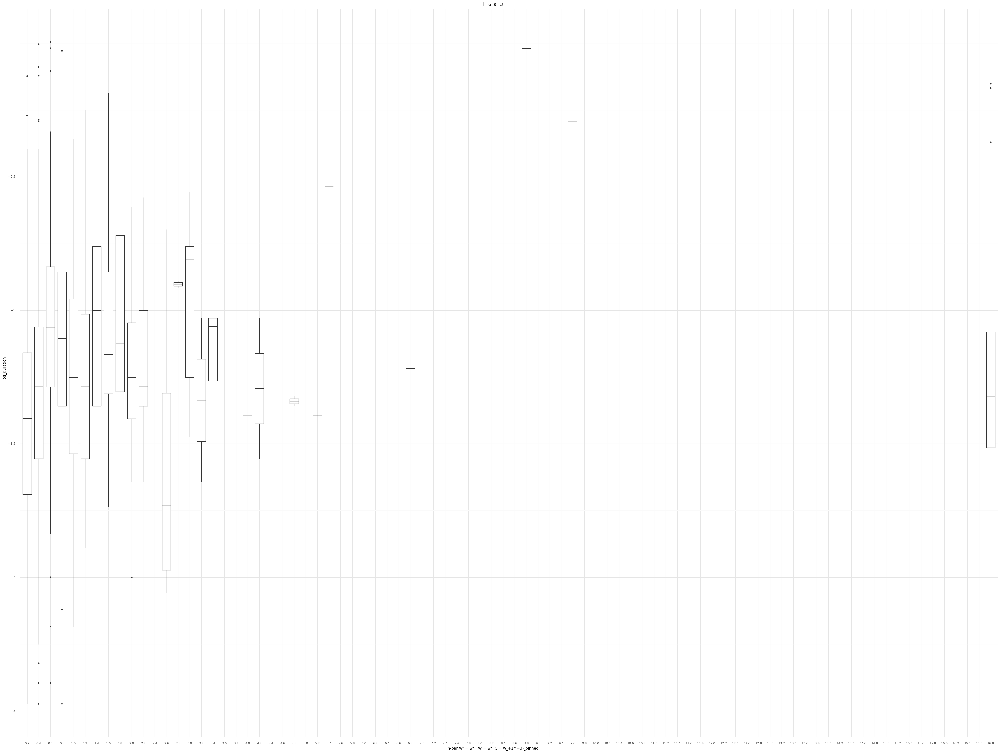

<ggplot: (8788778856405)>

................................................................................
--------------------------------------------------------------------------------
	s=3, l=6
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=3, l=6
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=3, l=6, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


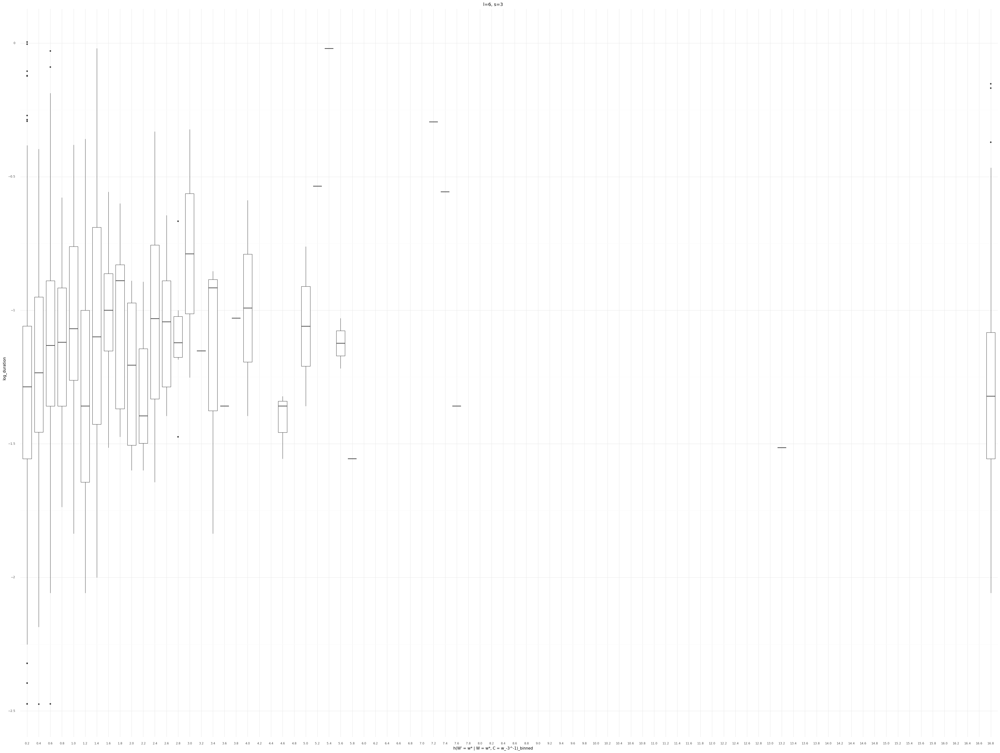

<ggplot: (8788775585829)>

................................................................................
--------------------------------------------------------------------------------
	s=3, l=6
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=3, l=6
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=3, l=6, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


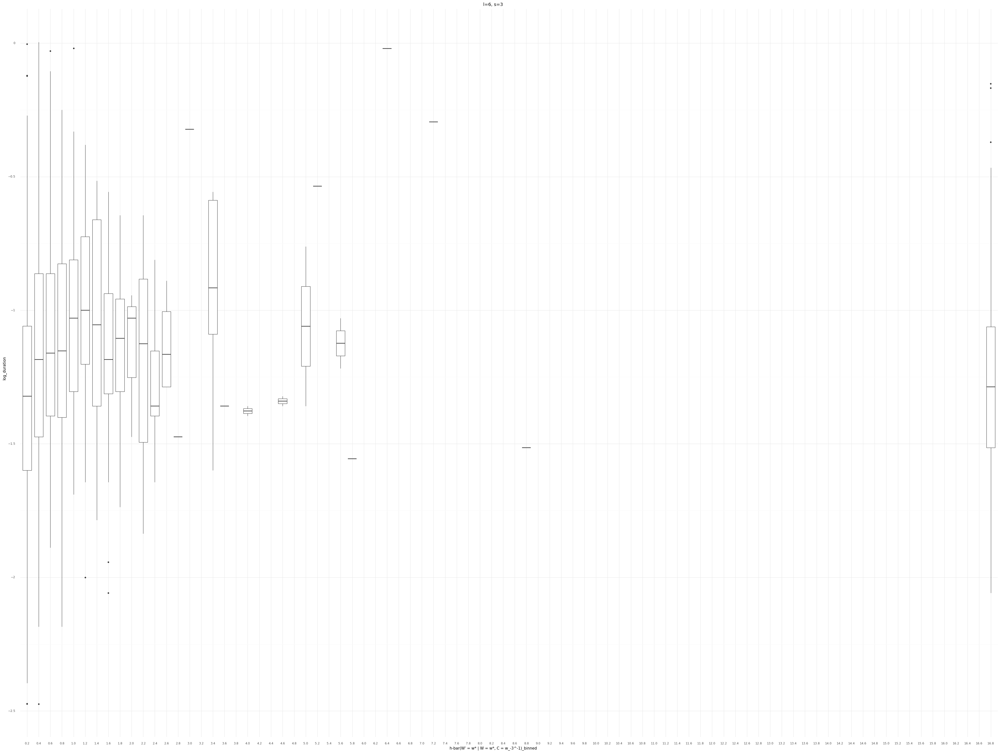

<ggplot: (8788775588185)>

................................................................................
--------------------------------------------------------------------------------


s=3, l=7
	s=3, l=7
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=3, l=7
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=3, l=7, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


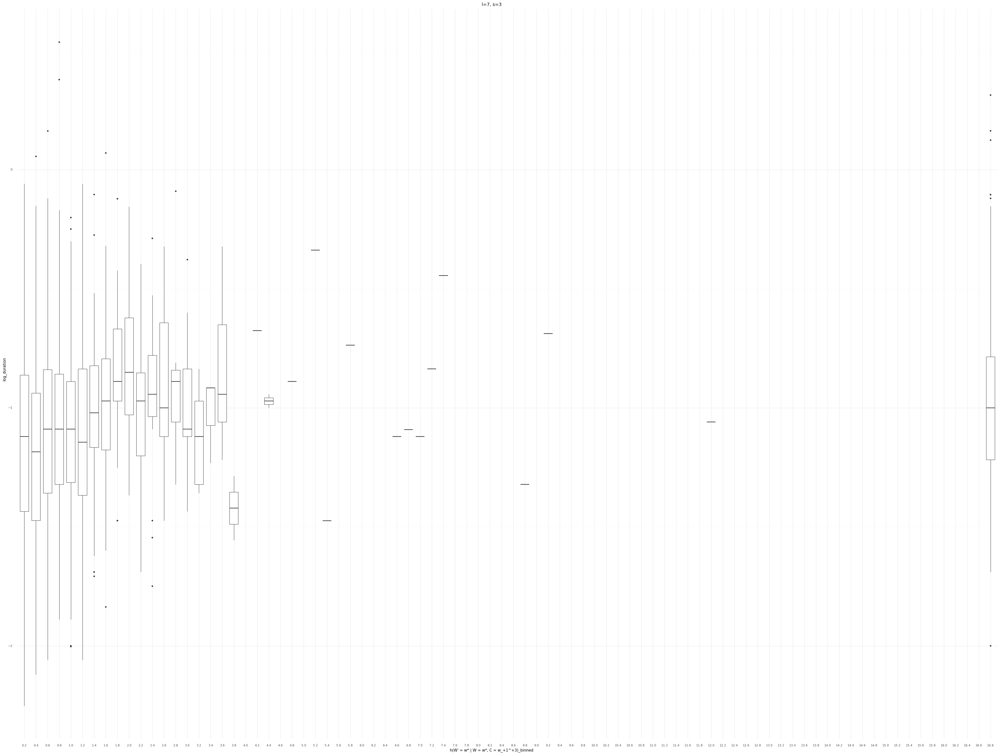

<ggplot: (8788782126409)>

................................................................................
--------------------------------------------------------------------------------
	s=3, l=7
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=3, l=7
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=3, l=7, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


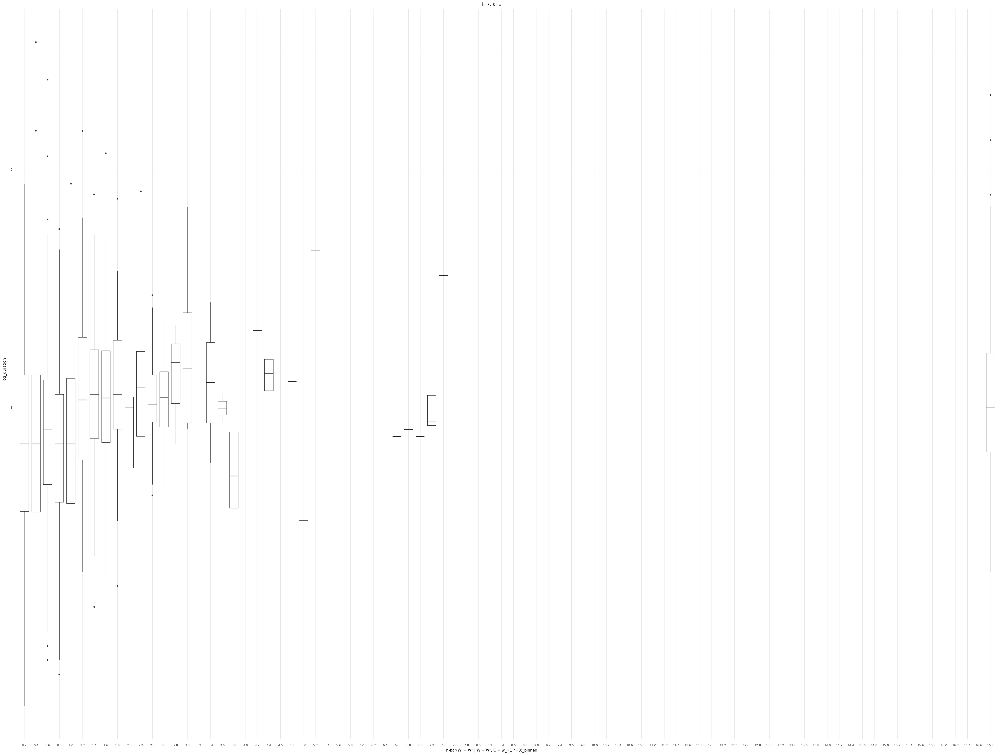

<ggplot: (8788782157149)>

................................................................................
--------------------------------------------------------------------------------
	s=3, l=7
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=3, l=7
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=3, l=7, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


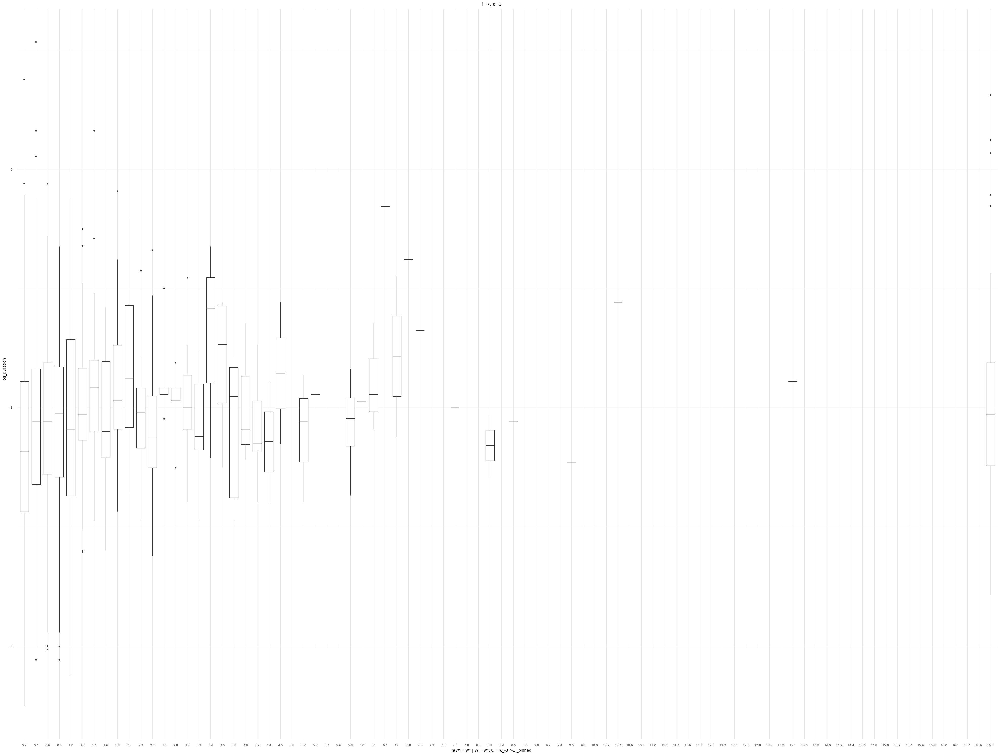

<ggplot: (8788762488949)>

................................................................................
--------------------------------------------------------------------------------
	s=3, l=7
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=3, l=7
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=3, l=7, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


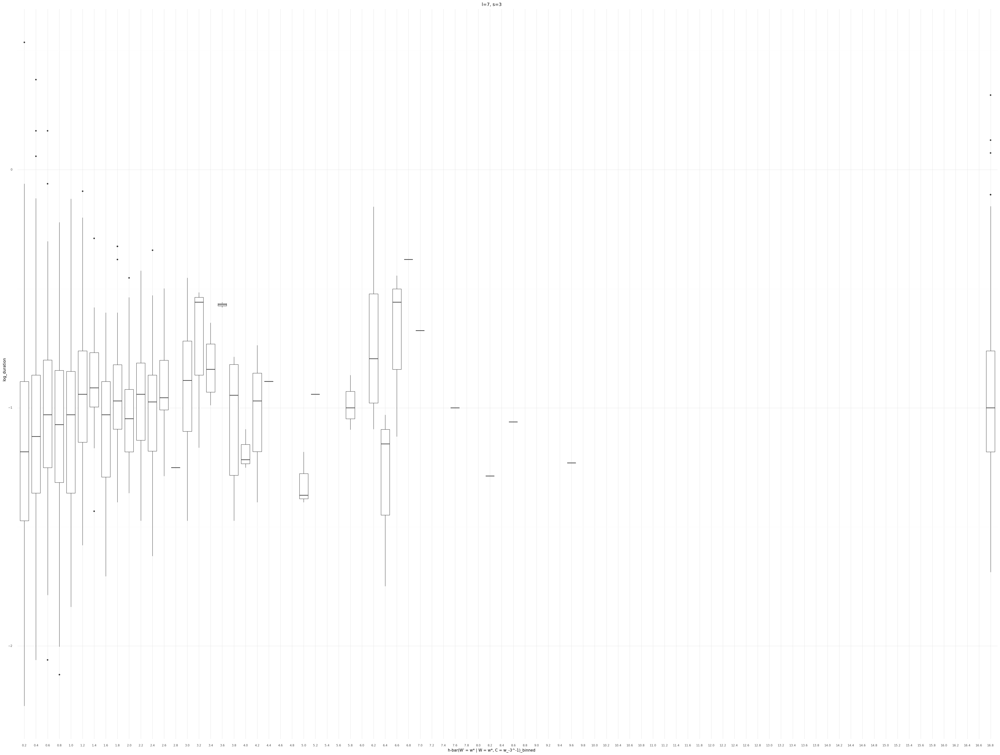

<ggplot: (8788746212369)>

................................................................................
--------------------------------------------------------------------------------


s=3, l=8
	s=3, l=8
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=3, l=8
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=3, l=8, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


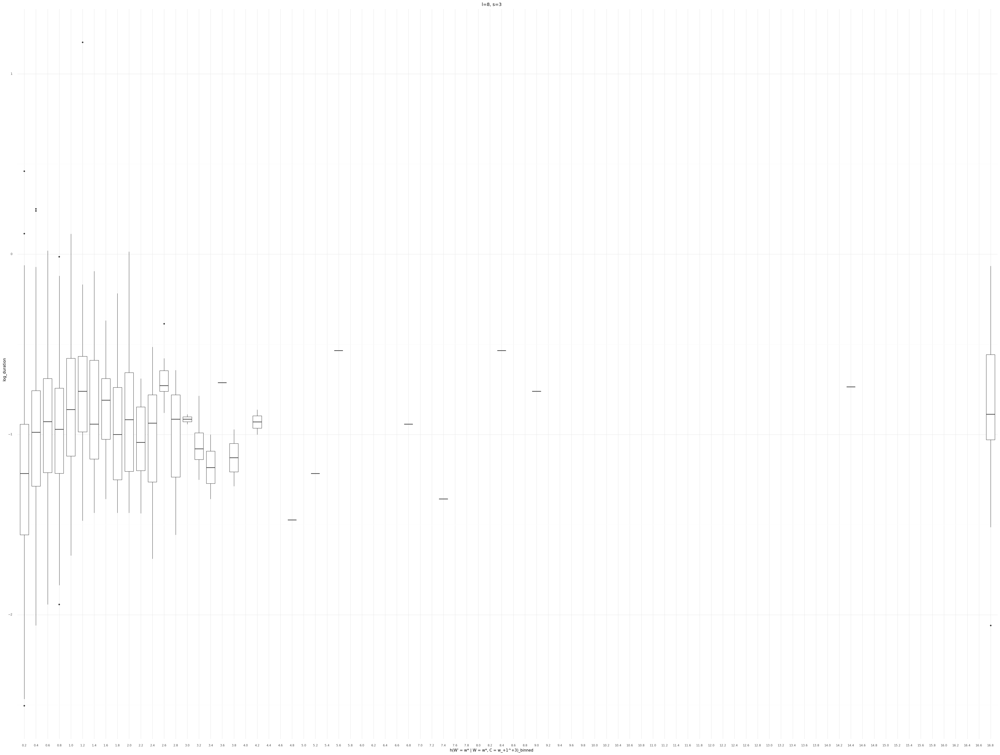

<ggplot: (8788755957681)>

................................................................................
--------------------------------------------------------------------------------
	s=3, l=8
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=3, l=8
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=3, l=8, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


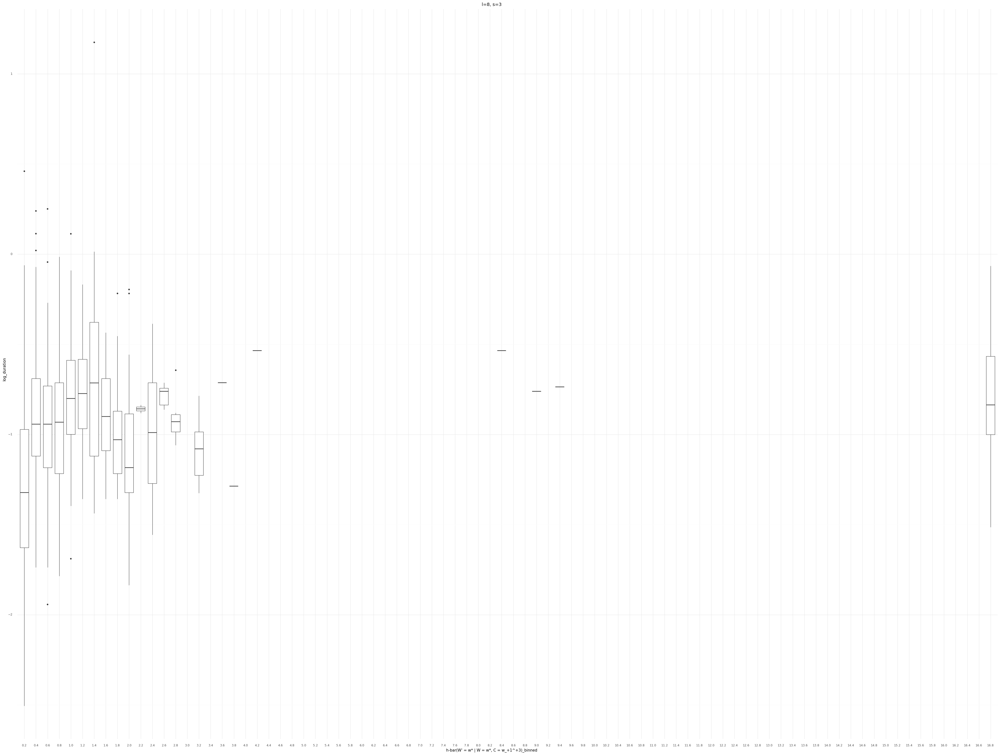

<ggplot: (8788752679337)>

................................................................................
--------------------------------------------------------------------------------
	s=3, l=8
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=3, l=8
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=3, l=8, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


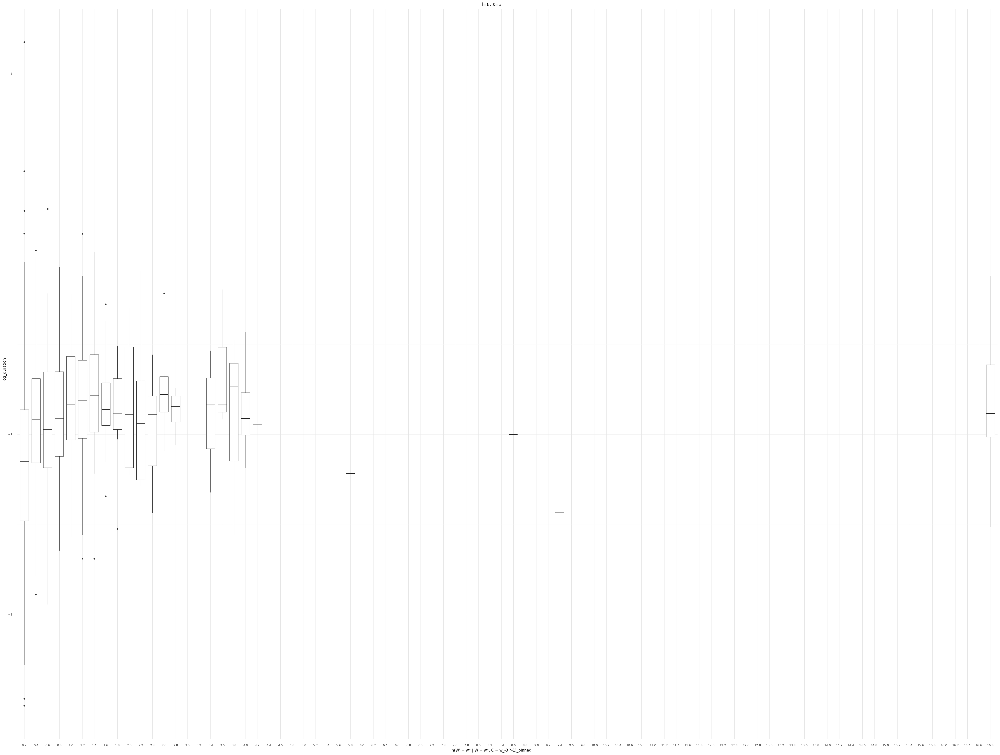

<ggplot: (8788749495513)>

................................................................................
--------------------------------------------------------------------------------
	s=3, l=8
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=3, l=8
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=3, l=8, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


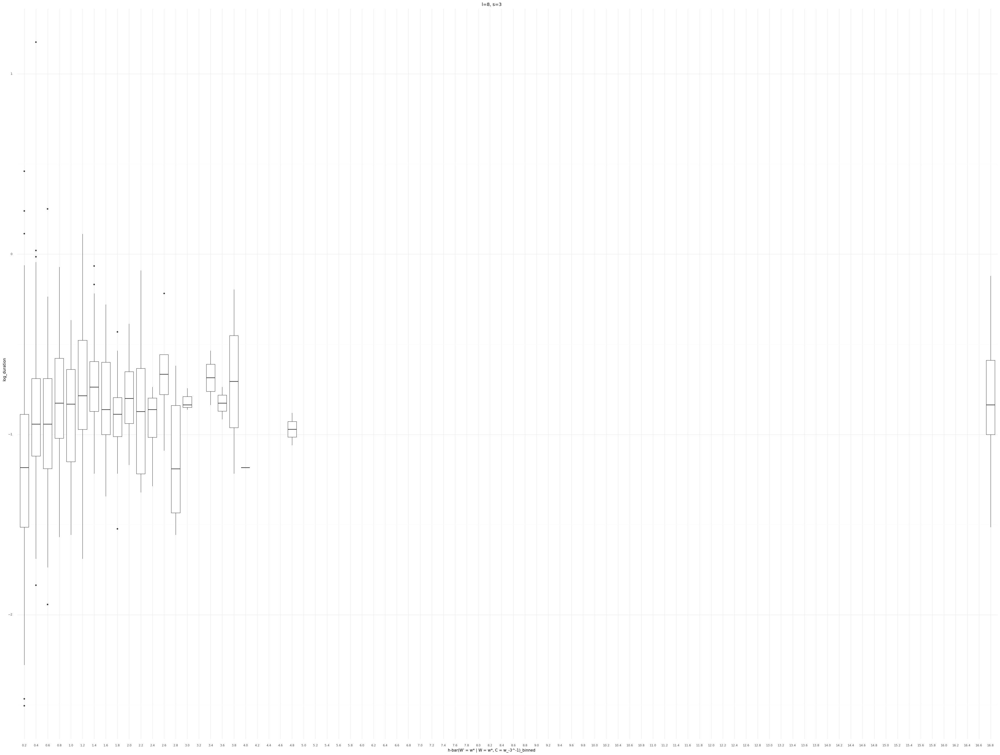

<ggplot: (8788746144857)>

................................................................................
--------------------------------------------------------------------------------


s=4, l=8
	s=4, l=8
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=4, l=8
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=4, l=8, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


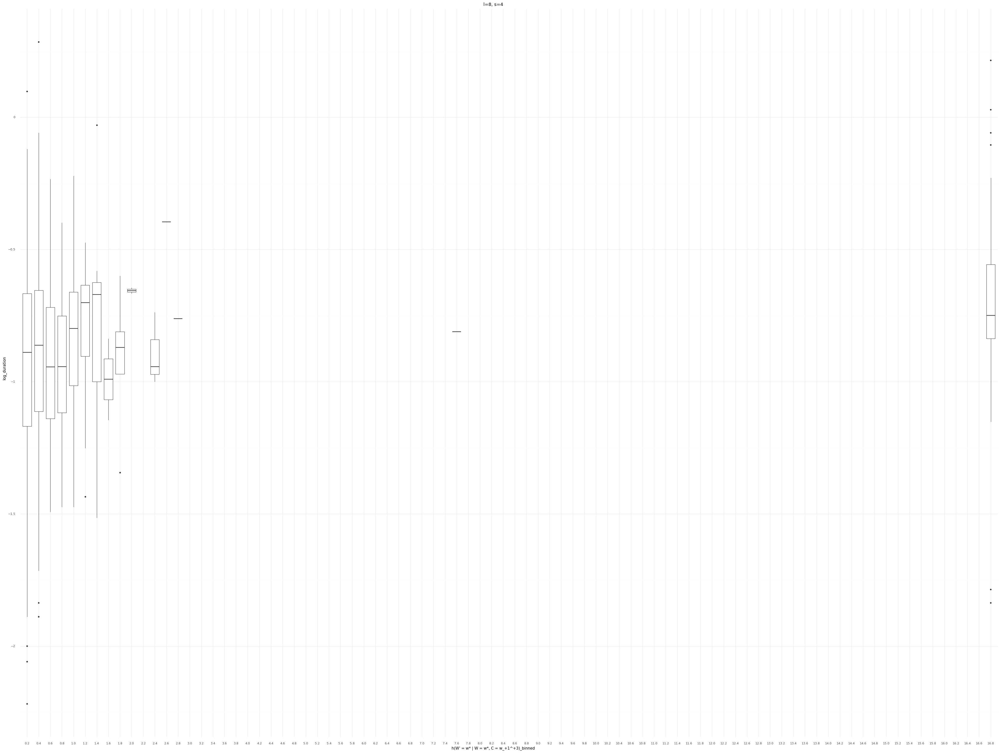

<ggplot: (8788742845109)>

................................................................................
--------------------------------------------------------------------------------
	s=4, l=8
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=4, l=8
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=4, l=8, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


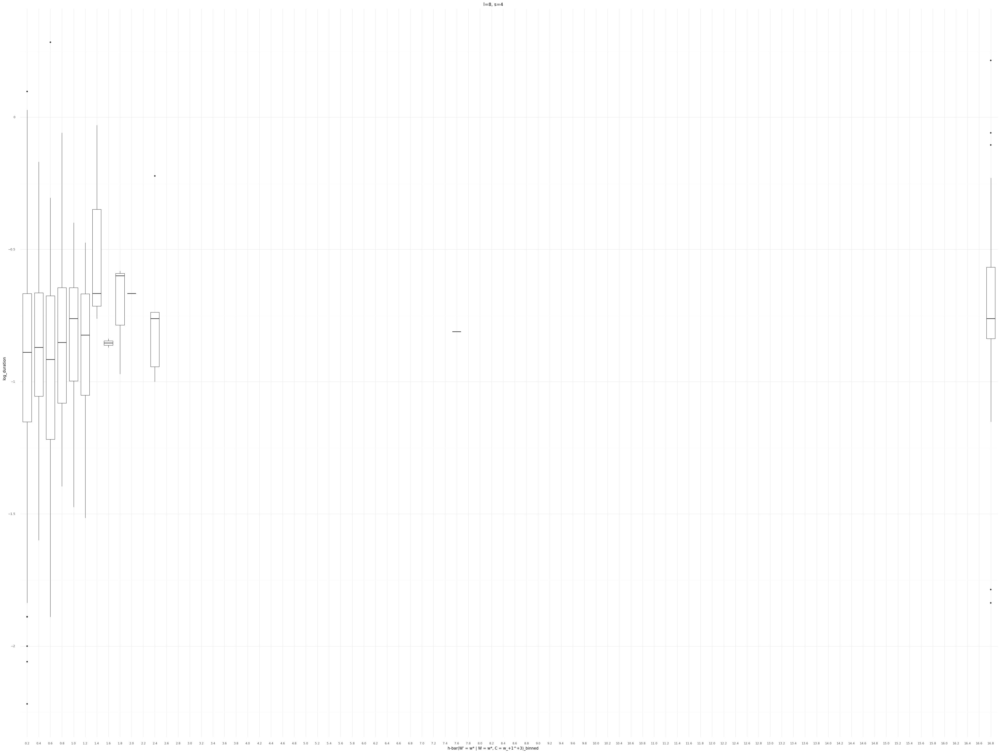

<ggplot: (8788739609437)>

................................................................................
--------------------------------------------------------------------------------
	s=4, l=8
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=4, l=8
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=4, l=8, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


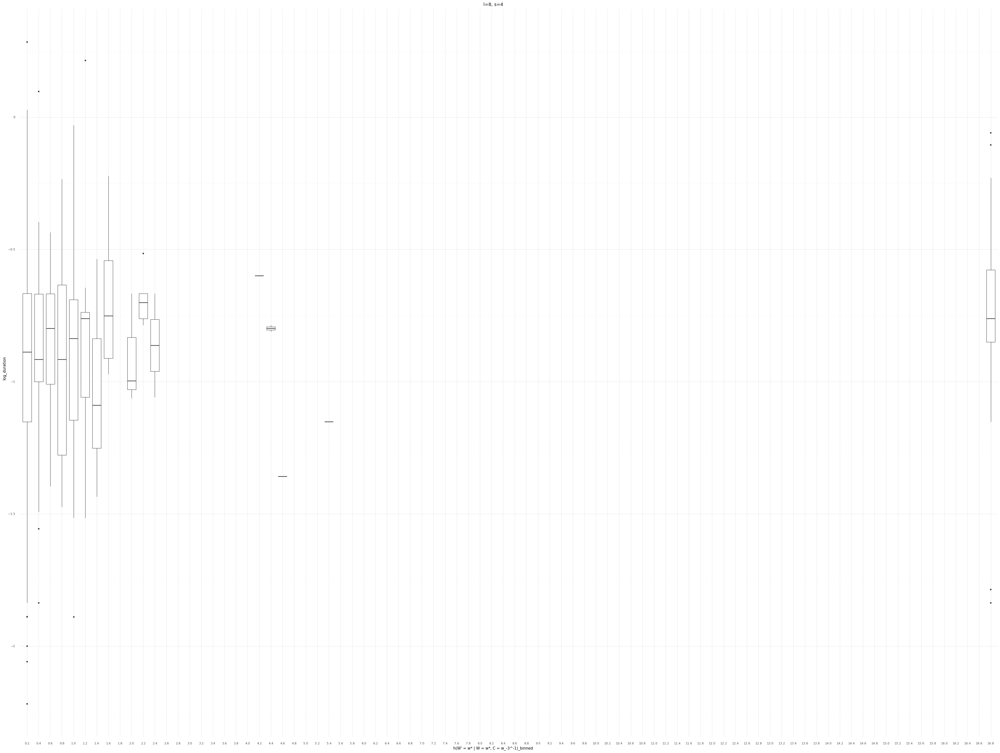

<ggplot: (8788736324601)>

................................................................................
--------------------------------------------------------------------------------
	s=4, l=8
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=4, l=8
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=4, l=8, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


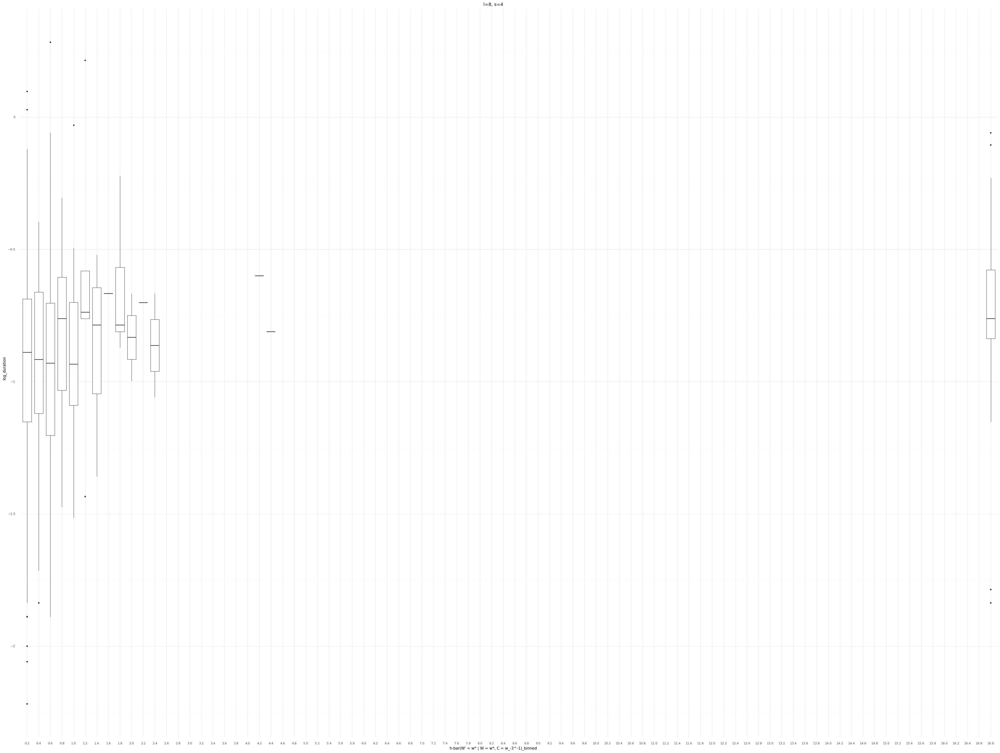

<ggplot: (8788723367701)>

................................................................................
--------------------------------------------------------------------------------


s=4, l=9
	s=4, l=9
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=4, l=9
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=4, l=9, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


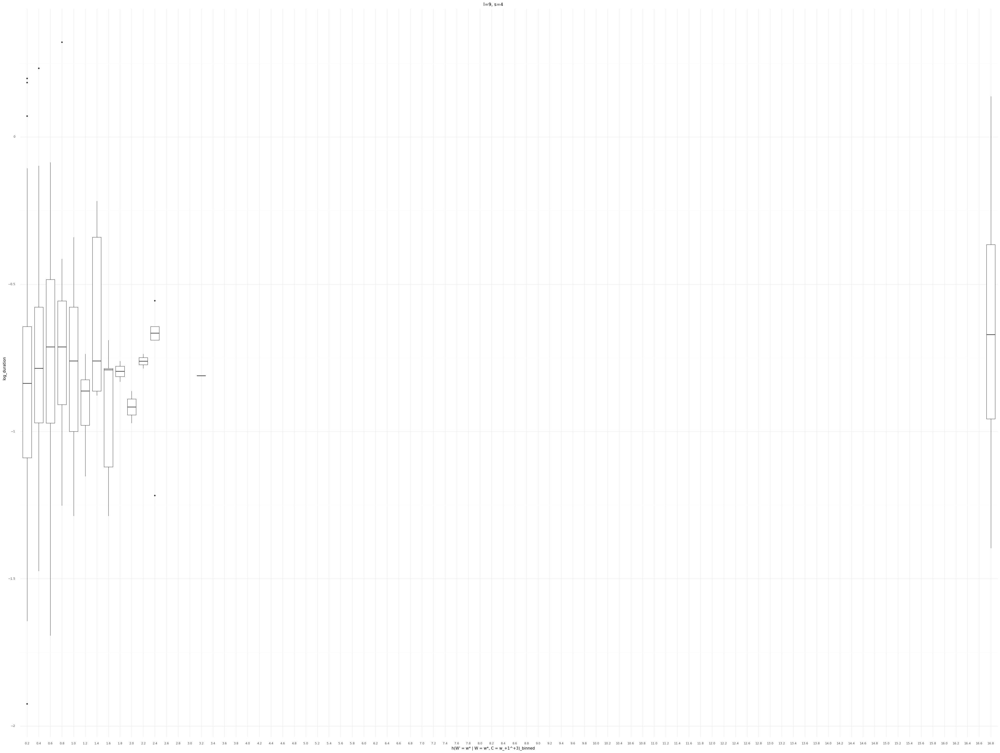

<ggplot: (8788733217601)>

................................................................................
--------------------------------------------------------------------------------
	s=4, l=9
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=4, l=9
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=4, l=9, log_duration ~ backwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


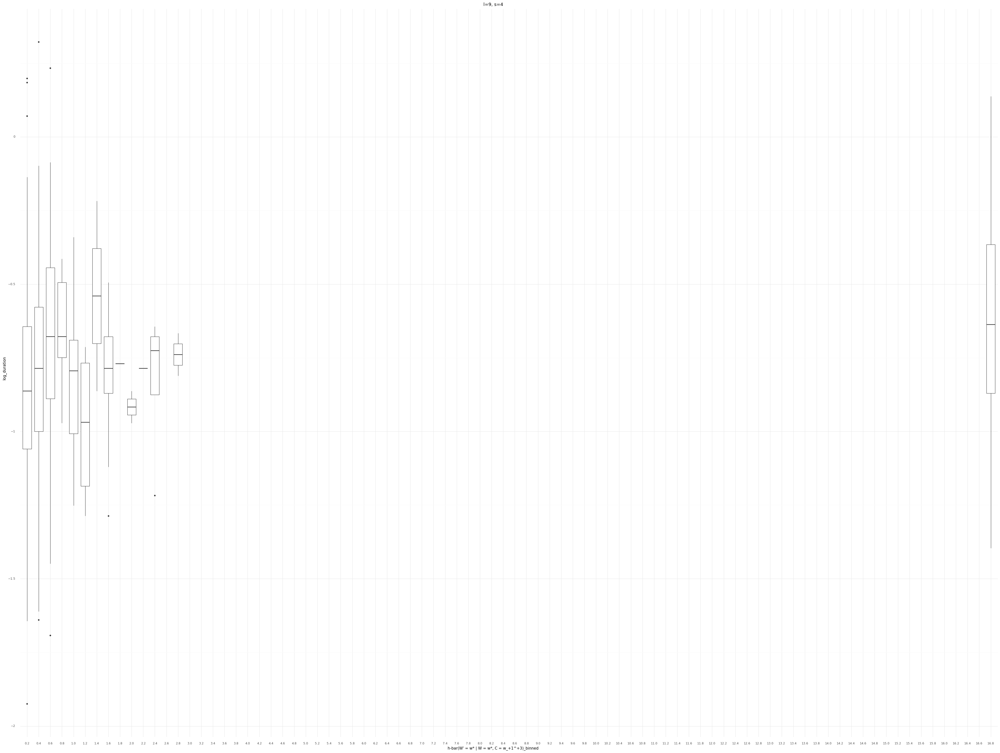

<ggplot: (8788739593213)>

................................................................................
--------------------------------------------------------------------------------
	s=4, l=9
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=4, l=9
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=4, l=9, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


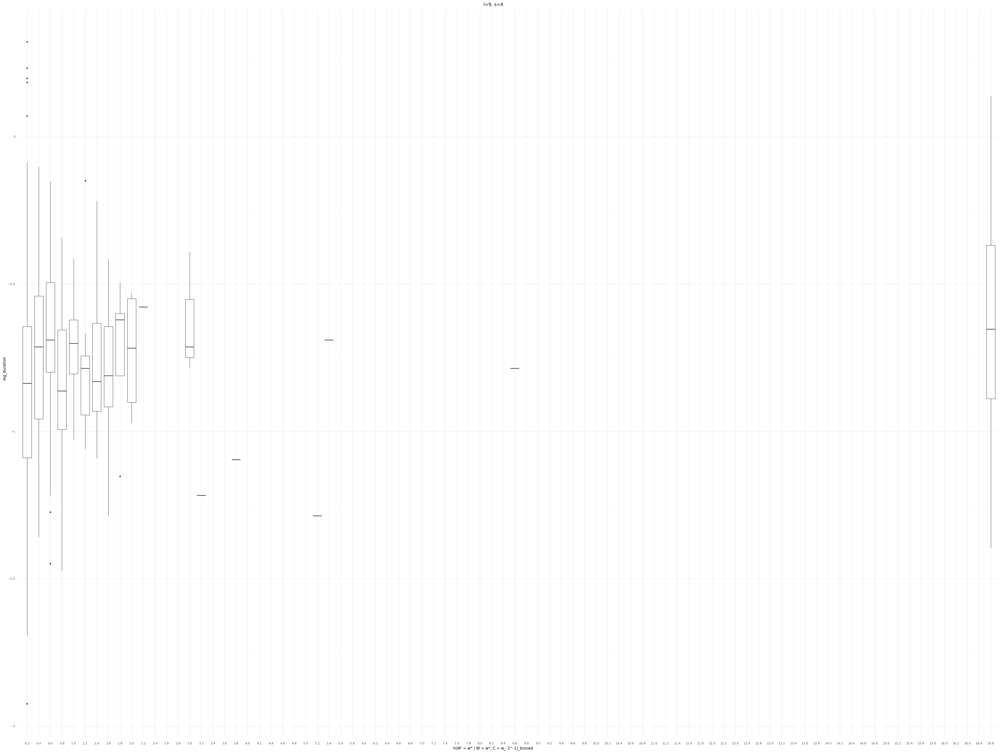

<ggplot: (8788716882205)>

................................................................................
--------------------------------------------------------------------------------
	s=4, l=9
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=4, l=9
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=4, l=9, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


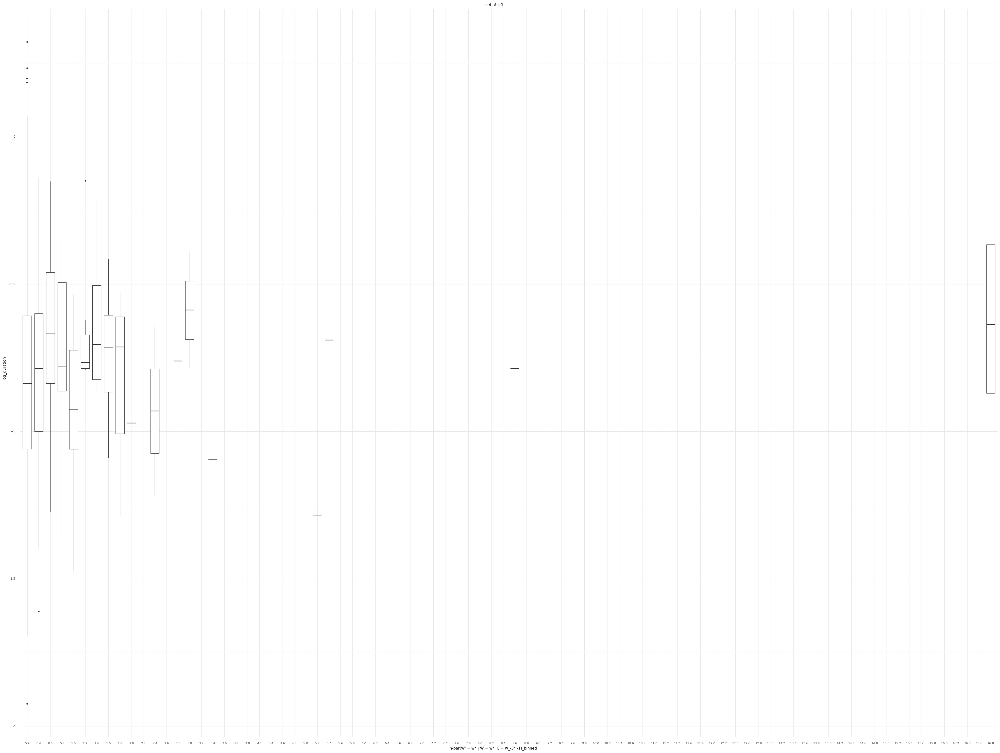

<ggplot: (8788733091353)>

................................................................................
--------------------------------------------------------------------------------


s=4, l=10
	s=4, l=10
	Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		s=4, l=10
		Surprisal Field = h(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=4, l=10, log_duration ~ backwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


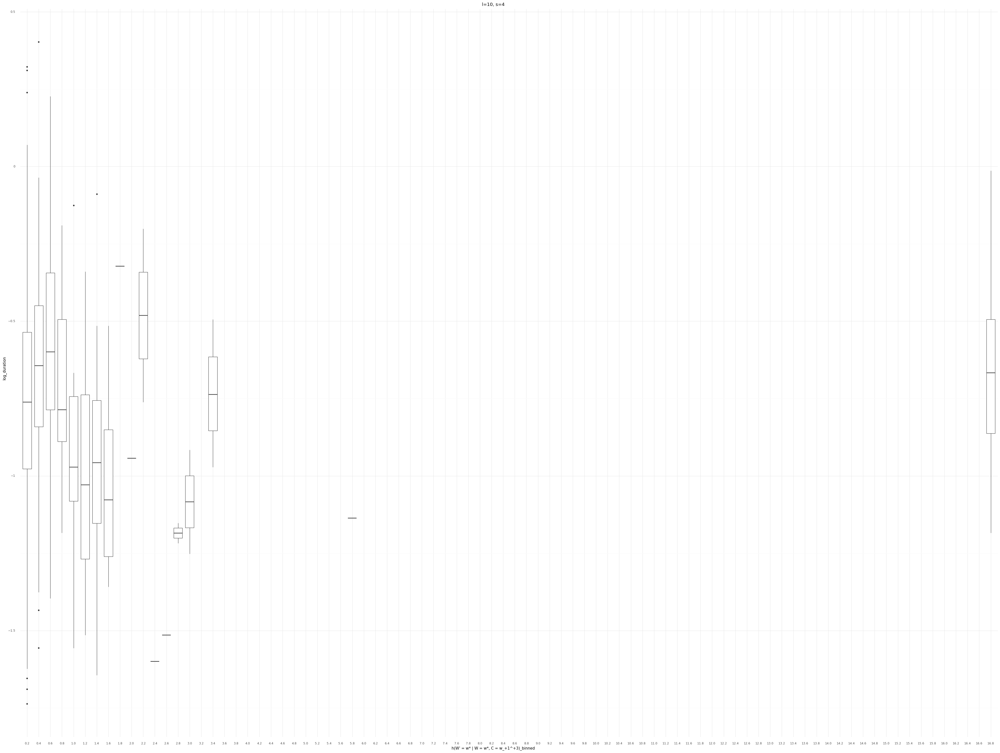

<ggplot: (8788720250241)>

................................................................................
--------------------------------------------------------------------------------
	s=4, l=10
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		s=4, l=10
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_+1^+3)_binned
		Duration Field = log_duration
s=4, l=10, log_duration ~ backwards avg in-context posterior:


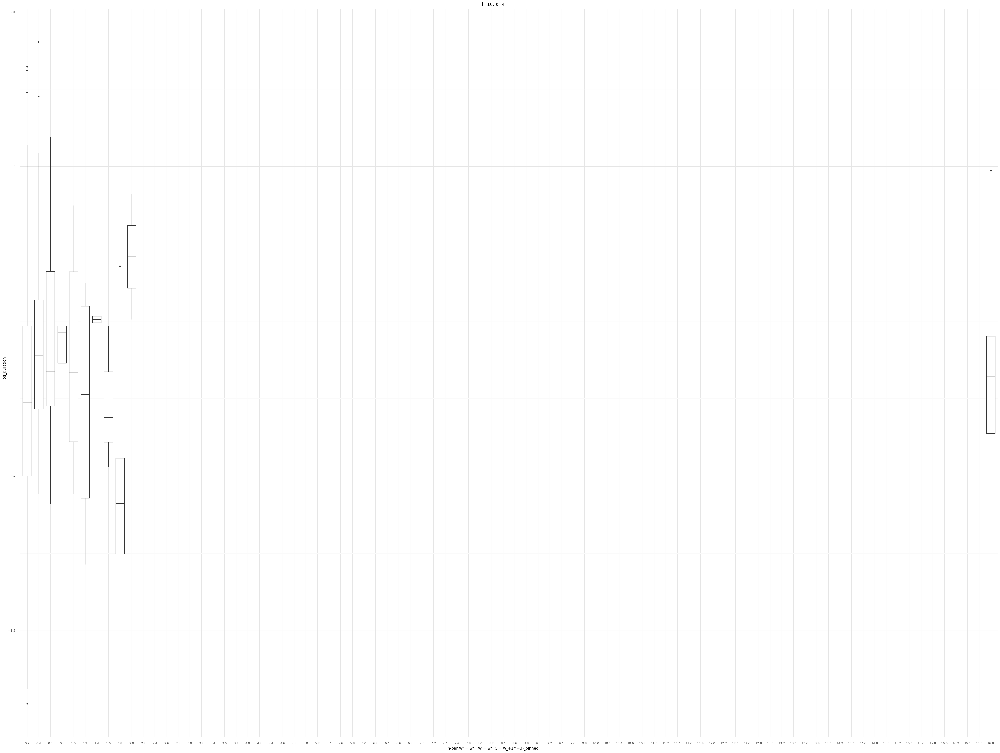

<ggplot: (8788713647989)>

................................................................................
--------------------------------------------------------------------------------
	s=4, l=10
	Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		s=4, l=10
		Surprisal Field = h(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=4, l=10, log_duration ~ forwards  posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


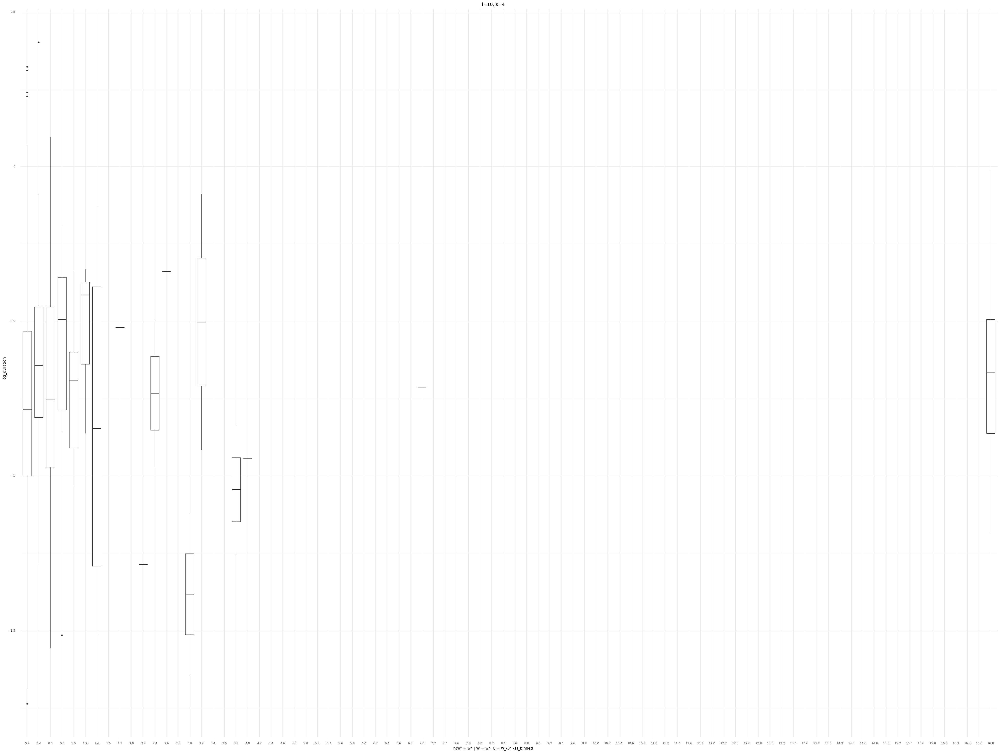

<ggplot: (8788710421741)>

................................................................................
--------------------------------------------------------------------------------
	s=4, l=10
	Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		s=4, l=10
		Surprisal Field = h-bar(W' = w* | W = w*, C = w_-3^-1)_binned
		Duration Field = log_duration
s=4, l=10, log_duration ~ forwards avg in-context posterior:


/home/AD/emeinhar/anaconda3/envs/jax-gpu2/lib/python3.7/site-packages/plotnine/stats/stat.py:311: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  stats = pd.concat(stats, axis=0, ignore_index=True)


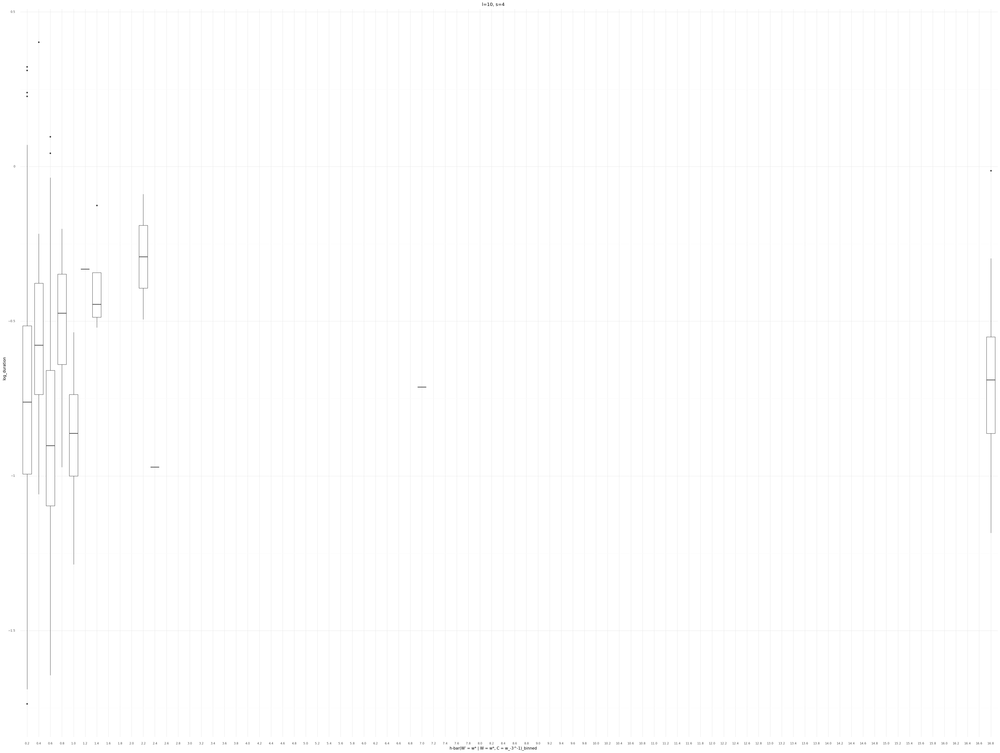

<ggplot: (8788707162845)>

................................................................................
--------------------------------------------------------------------------------




In [169]:
#truncated x-axis, bin width 0.2

#rescaling the x axis

for each_s, each_l in seg_syll_combos:
    print(f"s={each_s}, l={each_l}")
    for surp_field in lmap(lambda field_name: field_name + '_binned', (post_field_backward_h,
                                                                       post_field_backward_h_bar,
                                                                       post_field_forward_h,
                                                                       post_field_forward_h_bar)):
#     for surp_field in lmap(lambda field_name: field_name + '_binned', (lm_field_backward_h, post_field_backward_h,
#                                                                        lm_field_forward_h, post_field_forward_h)):
        print(f"\ts={each_s}, l={each_l}")
        print(f"\tSurprisal Field = {surp_field}")
        for dur_field in ('log_duration',):
#         for dur_field in ('duration', 'log_duration'):
            print(f"\t\ts={each_s}, l={each_l}")
            print(f"\t\tSurprisal Field = {surp_field}")
            print(f"\t\tDuration Field = {dur_field}")
            my_dir = 'backwards' if '+' in surp_field else 'forwards'
            is_avg_str = 'avg in-context' if 'bar' in surp_field else ''
            print(f"s={each_s}, l={each_l}, {dur_field} ~ {my_dir} {is_avg_str} posterior:")
#             x_scale_limits = surprisal_bins_generic_edges_cat
            x_scale_limits = surprisal_bins_generic_edges_cat_third
#             x_scale_limits = surprisal_bins_edges_cat if "W'" in surp_field else surprisal_bins_lm_edges_cat
            make_plot(dev_words_df[(dev_words_df[num_segs_field] == each_l) & (dev_words_df['syllables'] == each_s)], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"l={each_l}, s={each_s}")
#             make_plot(dev_words_df[dev_words_df['syllables'] == each_s], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"s={each_s}")
#             make_plot(dev_words_df[dev_words_df[num_segs_field] == each_l], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"l={each_l}")
#             make_plot(dev_words_df[dev_words_df['syllables'] == each_s], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"s={each_s}")
            print('.' * 80)
        print('-' * 80)
    print('=' * 80)
    print('\n')

In [170]:
# #truncated x-axis, bin width 0.1

# for each_s, each_l in seg_syll_combos:
#     print(f"s={each_s}, l={each_l}")
#     for surp_field in lmap(lambda field_name: field_name + '_binned', (post_field_backward_h,
#                                                                        post_field_forward_h)):
# #     for surp_field in lmap(lambda field_name: field_name + '_binned', (lm_field_backward_h, post_field_backward_h,
# #                                                                        lm_field_forward_h, post_field_forward_h)):
#         print(f"\ts={each_s}, l={each_l}")
#         print(f"\tSurprisal Field = {surp_field}")
#         for dur_field in ('log_duration',):
# #         for dur_field in ('duration', 'log_duration'):
#             print(f"\t\ts={each_s}, l={each_l}")
#             print(f"\t\tSurprisal Field = {surp_field}")
#             print(f"\t\tDuration Field = {dur_field}")
# #             x_scale_limits = surprisal_bins_generic_edges_cat
#             x_scale_limits = surprisal_bins_generic_edges_cat_third
# #             x_scale_limits = surprisal_bins_edges_cat if "W'" in surp_field else surprisal_bins_lm_edges_cat
#             make_plot(dev_words_df[(dev_words_df[num_segs_field] == each_l) & (dev_words_df['syllables'] == each_s)], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"l={each_l}")
# #             make_plot(dev_words_df[dev_words_df['syllables'] == each_s], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"s={each_s}")
# #             make_plot(dev_words_df[dev_words_df[num_segs_field] == each_l], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"l={each_l}")
# #             make_plot(dev_words_df[dev_words_df['syllables'] == each_s], surp_field, dur_field, x_scale_limits=x_scale_limits, title=f"s={each_s}")
#             print('.' * 80)
#         print('-' * 80)
#     print('=' * 80)
#     print('\n')

In [171]:
# #takes 13s/plot on kotoba
# # my_plots[str_join('_', ['nxt_swbd', lm_field_backward_h + '_binned', 'duration'])] = make_plot(words_w_segs_binned_surprisals_df)
# ggplot(words_w_l_segs_binned_surprisals_df, aes(x=lm_field_backward_h + '_binned', y='duration')) + geom_boxplot() + scale_x_discrete(limits=surprisal_bins_lm_edges_cat) + theme_minimal()
# ggplot(words_w_l_segs_binned_surprisals_df, aes(x=lm_field_backward_h + '_binned', y='log_duration')) + geom_boxplot() + scale_x_discrete(limits=surprisal_bins_lm_edges_cat) + theme_minimal()

In [172]:
# #takes 13s/plot on kotoba
# ggplot(words_w_l_segs_binned_surprisals_df, aes(x=post_field_backward_h + '_binned', y='duration')) + geom_boxplot() + scale_x_discrete(limits=surprisal_bins_edges_cat) + theme_minimal()
# ggplot(words_w_l_segs_binned_surprisals_df, aes(x=post_field_backward_h + '_binned', y='log_duration')) + geom_boxplot() + scale_x_discrete(limits=surprisal_bins_edges_cat) + theme_minimal()

In [173]:
# #takes 13s/plot on kotoba
# ggplot(words_w_l_segs_binned_surprisals_df, aes(x=lm_field_forward_h + '_binned', y='duration')) + geom_boxplot() + scale_x_discrete(limits=surprisal_bins_lm_edges_cat) + theme_minimal()
# ggplot(words_w_l_segs_binned_surprisals_df, aes(x=lm_field_forward_h + '_binned', y='log_duration')) + geom_boxplot() + scale_x_discrete(limits=surprisal_bins_lm_edges_cat) + theme_minimal()

In [174]:
# #takes 13s/plot on kotoba
# ggplot(words_w_l_segs_binned_surprisals_df, aes(x=post_field_forward_h + '_binned', y='duration')) + geom_boxplot() + scale_x_discrete(limits=surprisal_bins_edges_cat) + theme_minimal()
# ggplot(words_w_l_segs_binned_surprisals_df, aes(x=post_field_forward_h + '_binned', y='log_duration')) + geom_boxplot() + scale_x_discrete(limits=surprisal_bins_edges_cat) + theme_minimal()

In [175]:
#similar plots for other segmental lengths
#add Fisher unigram frequencies

In [429]:
dev_words[0]

{'utt_id': 't110_1',
 'utt_start': 389.161875,
 'utt_end': 392.801875,
 'utt_duration': 3.6399999999999864,
 'utt_orth': 'wanting to play is the drums cause his my brother plays',
 'utt_speech': 'wanting to play is the drums cause his my brother plays',
 'conversation_id': '3152',
 'speaker': 'B',
 'sex': 'F',
 'dob': 1962,
 'dialect': 'MIXED',
 'speaker_id': 'spkr1320',
 'interlocutor_id': 'spkr1290',
 'topic': 'MUSIC',
 'turn_id': 't110',
 'id': 'ms89B_pw719',
 'distance_from_left_edge_of_turn': 1,
 'distance_from_right_edge_of_turn': 2,
 'num_phonwords': 11,
 'num_syllables': 13,
 'start': 389.611875,
 'end': 389.981875,
 'duration': 0.37000000000000455,
 'speech_rate': 3.571428571428585,
 'orth': 'play',
 'speech': 'play',
 'has_extreme_speech_rate': False,
 'type': 'phonword',
 'tag': 'phonword',
 'msstate': 'sw3152B-ms98-a-0089',
 'stress': 'p',
 'child_type': 'syllable',
 'missing_syllable_info': False,
 'child_fn': 'sw3152.B.syllables.xml',
 'child_fp': '/mnt/truffle/corpora/sw

In [430]:
dev_words_df.info()
dev_words_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56618 entries, 0 to 56617
Columns: 125 entries, utt_id to transcription_added?
dtypes: bool(16), float64(55), int64(8), object(46)
memory usage: 47.9+ MB


,utt_id,utt_start,utt_end,utt_duration,utt_orth,utt_speech,conversation_id,speaker,sex,dob,...,log_num_phonwords,log_num_syllables,log_duration,log_speech_rate,log_syllables,log_phone_durations,log_phones_length,log_orthography_length,missing_transcription?,transcription_added?
0,t110_1,389.161875,392.801875,3.640000,wanting to play is the drums cause his my brot...,wanting to play is the drums cause his my brot...,3152,B,F,1962,...,3.459432,3.700440,-1.434403,1.836501,0.000000,"[-3.0588936890535137, -3.0588936890535137, -2....",1.584963,2.000000,NaN,NaN
1,t18_5,124.657875,135.520875,10.863000,um adjust to other people's people's mannerism...,um adjust to other people's people's mannerism...,3487,B,F,1955,...,5.000000,5.523562,-1.184425,2.082211,1.584963,"[-4.058893689054197, -5.058893689053514, -4.05...",3.169925,3.000000,NaN,NaN
2,t108_0,549.879250,551.599250,1.720000,every road sign you come to is like well i did...,every road sign you come to is like well i did...,2669,B,M,1963,...,3.807355,4.087463,-2.058894,3.305054,0.000000,"[-3.3219280948870344, -3.3219280948870344, -4....",1.584963,2.000000,NaN,NaN
3,t98_0,336.299250,340.897250,4.598000,how would it how what kind of stuff would they...,how would it how what kind of stuff would they...,2870,B,F,1956,...,4.247928,4.247928,-1.643856,2.046921,0.000000,"[-3.3219280948870344, -4.643856189776037, -3.6...",2.000000,2.321928,NaN,NaN
4,t40_1,176.517125,180.810250,4.293125,they are famous for i guess having really top ...,they are famous for i guess having really top ...,4682,B,M,1963,...,3.584963,4.087463,-1.029146,1.985435,1.000000,"[-3.643856189774499, -3.0588936890535137, -3.4...",2.321928,2.807355,NaN,NaN


In [180]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [431]:
list(dev_words[0].keys())

['utt_id',
 'utt_start',
 'utt_end',
 'utt_duration',
 'utt_orth',
 'utt_speech',
 'conversation_id',
 'speaker',
 'sex',
 'dob',
 'dialect',
 'speaker_id',
 'interlocutor_id',
 'topic',
 'turn_id',
 'id',
 'distance_from_left_edge_of_turn',
 'distance_from_right_edge_of_turn',
 'num_phonwords',
 'num_syllables',
 'start',
 'end',
 'duration',
 'speech_rate',
 'orth',
 'speech',
 'has_extreme_speech_rate',
 'type',
 'tag',
 'msstate',
 'stress',
 'child_type',
 'missing_syllable_info',
 'child_fn',
 'child_fp',
 'child_id_span',
 'child_id_range',
 'parent_type',
 'parent_ids',
 'POSs',
 'isAdj',
 'isAdv',
 'isV',
 'isN',
 'syllables',
 'phone_ids',
 'phones',
 'phone_durations',
 'phones_length',
 'orthography_length',
 'transcription',
 'is_non_speech',
 'is_disfluent',
 'is_filled_pause',
 'has_clitic',
 'is_unk',
 'is_content_word',
 'has_valid_transcription',
 'has_extreme_word_duration',
 'preceding_4_wordforms',
 'preceding_3_wordforms',
 'preceding_2_wordforms',
 'preceding_1_w

In [432]:
set(lmap(type, lpluck("h-bar(W = w* | C = w_-1^-1)", dev_words)))

{float}

In [433]:
dev_words_df['post_bwd_4gram'] = dev_words_df["h(W' = w* | W = w*, C = w_+1^+3)"]
dev_words_df['surprisal_bwd_4gram'] = dev_words_df["h(W = w* | C = w_+1^+3)"]
dev_words_df['post_fwd_4gram'] = dev_words_df["h(W' = w* | W = w*, C = w_-3^-1)"]
dev_words_df['surprisal_fwd_4gram'] = dev_words_df["h(W = w* | C = w_-3^-1)"]
dev_words_df['avg_post_bwd_4gram'] = dev_words_df["h-bar(W' = w* | W = w*, C = w_+1^+3)"]
dev_words_df['avg_post_fwd_4gram'] = dev_words_df["h-bar(W' = w* | W = w*, C = w_-3^-1)"]
dev_words_df['avg_surprisal_bwd_4gram'] = dev_words_df["h-bar(W = w* | C = w_+1^+3)"]
dev_words_df['avg_surprisal_fwd_4gram'] = dev_words_df["h-bar(W = w* | C = w_-3^-1)"]

dev_words_df['post_bwd_2gram'] = dev_words_df["h(W' = w* | W = w*, C = w_+1^+1)"]
dev_words_df['surprisal_bwd_2gram'] = dev_words_df["h(W = w* | C = w_+1^+1)"]
dev_words_df['post_fwd_2gram'] = dev_words_df["h(W' = w* | W = w*, C = w_-1^-1)"]
dev_words_df['surprisal_fwd_2gram'] = dev_words_df["h(W = w* | C = w_-1^-1)"]
dev_words_df['avg_post_bwd_2gram'] = dev_words_df["h-bar(W' = w* | W = w*, C = w_+1^+1)"]
dev_words_df['avg_post_fwd_2gram'] = dev_words_df["h-bar(W' = w* | W = w*, C = w_-1^-1)"]
dev_words_df['avg_surprisal_bwd_2gram'] = dev_words_df["h-bar(W = w* | C = w_+1^+1)"]
dev_words_df['avg_surprisal_fwd_2gram'] = dev_words_df["h-bar(W = w* | C = w_-1^-1)"]

In [434]:
dev_words_df['phones_length_cat'] = dev_words_df['phones_length'].apply(str)
dev_words_df['syllables_cat'] = dev_words_df['syllables'].apply(str)

In [435]:
dev_words_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56618 entries, 0 to 56617
Columns: 143 entries, utt_id to syllables_cat
dtypes: bool(16), float64(71), int64(8), object(48)
memory usage: 55.7+ MB


In [436]:
dev_words_df_nonan = dev_words_df[['log_duration', 'post_bwd_4gram','surprisal_bwd_4gram','phones_length', 'syllables','speaker_id', 'phones_length_cat', 'syllables_cat','post_fwd_4gram','surprisal_fwd_4gram','avg_surprisal_bwd_4gram','avg_surprisal_fwd_4gram','avg_post_bwd_4gram','avg_post_fwd_4gram','isAdj','isAdv','isV','isN','speech_rate','duration','post_bwd_2gram','surprisal_bwd_2gram','post_fwd_2gram','surprisal_fwd_2gram','avg_post_bwd_2gram','avg_post_fwd_2gram','avg_surprisal_bwd_2gram','avg_surprisal_fwd_2gram']].dropna()

In [437]:
[x for x in dev_words_df_nonan.iloc[:,2] if x==-1*np.inf]

[]

In [438]:
dev_words_df_nonan.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53786 entries, 0 to 56616
Data columns (total 28 columns):
log_duration               53786 non-null float64
post_bwd_4gram             53786 non-null float64
surprisal_bwd_4gram        53786 non-null float64
phones_length              53786 non-null int64
syllables                  53786 non-null float64
speaker_id                 53786 non-null object
phones_length_cat          53786 non-null object
syllables_cat              53786 non-null object
post_fwd_4gram             53786 non-null float64
surprisal_fwd_4gram        53786 non-null float64
avg_surprisal_bwd_4gram    53786 non-null float64
avg_surprisal_fwd_4gram    53786 non-null float64
avg_post_bwd_4gram         53786 non-null float64
avg_post_fwd_4gram         53786 non-null float64
isAdj                      53786 non-null bool
isAdv                      53786 non-null bool
isV                        53786 non-null bool
isN                        53786 non-null bool
speech_r

In [294]:
# mod = smf.ols(formula = "log_duration ~ +surprisal_bwd_4gram + syllables*phones_length ", data=dev_words_df_nonan,missing='drop')
# mod

In [451]:
mod = smf.ols(formula = "log_duration ~ avg_post_bwd_2gram + avg_surprisal_bwd_2gram+ surprisal_bwd_2gram  + speaker_id + syllables_cat +isAdj+isAdv+isV+isN+speech_rate", data=dev_words_df_nonan,missing='drop')
mod

In [452]:
res = mod.fit()

In [453]:
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:           log_duration   R-squared:                       0.542
Model:                            OLS   Adj. R-squared:                  0.539
Method:                 Least Squares   F-statistic:                     170.6
Date:                Fri, 04 Oct 2019   Prob (F-statistic):               0.00
Time:                        19:06:23   Log-Likelihood:                -29246.
No. Observations:               53786   AIC:                         5.923e+04
Df Residuals:                   53415   BIC:                         6.253e+04
Df Model:                         370                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 